# HYPOTHESIS 1: Infants are expected to demonstrate varying exploration patterns in response to changes in difficulty
As task complexity increases, they may extend their exploration periods, fixate on images longer and more frequently, and exhibit heightened image-switching behavior

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import shapiro, levene, kruskal, sem, f_oneway, linregress, spearmanr
from sklearn.utils import resample
import random 
from sklearn.cluster import AgglomerativeClustering, KMeans
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import statsmodels.api as sm
import statsmodels.formula.api as smf
#import pymc as pm
#import arviz as az
from sklearn.model_selection import KFold
from sklearn.model_selection import LeaveOneOut
from sklearn.metrics import mean_absolute_error, mean_squared_error
import warnings
from scipy.special import gamma
from sklearn.preprocessing import MinMaxScaler

In [2]:
#Read the dataset and drop NaN values

dataset = 'data_thesis_FILTERED.csv'
data = pd.read_csv(dataset)
data.dropna(inplace=True)

data['durLookBottom'] = data['LookTotDurInL'] + data['LookTotDurInR'] #New variable: durLookBottom

data['FixNbInBottom'] = data['FixNbInL'] + data['FixNbInR'] #New variable: FixNbInBottom

data['durfixBottom'] = data['FixTotDurInL'] + data['FixTotDurInR'] #New variable: durFixBottom

data

,session,trialno,difficulty,accuracy,period_in_trial,step_reached,durPeriodTotal,FixNb,FixNbInL,FixNbInR,...,objL,objR,objT,sideChosen,sideMatch,timePeriodStarts,timePeriodEnds,durLookBottom,FixNbInBottom,durfixBottom
0,curE002a,8,Easy,0.0,exploration,3,11270,20,13,5,...,V-1-G-1.png,F-4-E-1.png,F-4-E-1.png,left,right,1962.0,13230.0,5480,18,4952
1,curE002a,8,Easy,0.0,decision,3,924,2,1,0,...,V-1-G-1.png,F-4-E-1.png,F-4-E-1.png,left,right,13232.0,14154.0,536,1,536
2,curE002a,9,Easy,1.0,exploration,3,2498,6,3,2,...,F-1-A-3.png,V-2-H-2.png,F-1-A-3.png,left,left,2024.0,4520.0,1670,5,1468
3,curE002a,9,Easy,1.0,decision,3,2182,4,1,0,...,F-1-A-3.png,V-2-H-2.png,F-1-A-3.png,left,left,4522.0,6702.0,530,1,470
4,curE002a,10,Easy,1.0,exploration,3,9912,11,3,5,...,F-4-E-1.png,V-1-G-1.png,V-1-G-1.png,right,right,2046.0,11956.0,2658,8,2546
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2055,curE122a,35,Hard,1.0,decision,3,1432,0,0,0,...,V-4-F-1.png,V-4-A-4.png,V-4-F-1.png,left,left,18390.0,19820.0,0,0,0
2056,curE122a,38,Hard,1.0,exploration,3,2414,5,2,1,...,O-2-J-1.png,O-2-G-4.png,O-2-J-1.png,left,left,2716.0,5128.0,1586,3,1510
2057,curE122a,38,Hard,1.0,decision,3,582,2,2,0,...,O-2-J-1.png,O-2-G-4.png,O-2-J-1.png,left,left,5130.0,5710.0,488,2,488
2058,curE122a,48,Medium,0.0,exploration,3,2332,2,1,0,...,V-2-B-3.png,V-3-H-3.png,V-3-H-3.png,left,right,1488.0,17710.0,596,1,596


In [3]:
# Summary statistics
print(data.describe())

           trialno     accuracy  step_reached  durPeriodTotal        FixNb  \
count  2060.000000  2060.000000   2060.000000     2060.000000  2060.000000   
mean     26.346602     0.523301      2.954369     4381.984466     7.853883   
std      14.649251     0.499578      0.208734     3745.790742     6.214751   
min       7.000000     0.000000      2.000000      550.000000     0.000000   
25%      15.000000     0.000000      3.000000     1917.500000     4.000000   
50%      24.000000     1.000000      3.000000     2823.000000     6.000000   
75%      35.000000     1.000000      3.000000     5520.000000    10.000000   
max      87.000000     1.000000      3.000000    20258.000000    51.000000   

          FixNbInL     FixNbInR     FixNbInT   FixNbNoAOI  FixTotDurInL  ...  \
count  2060.000000  2060.000000  2060.000000  2060.000000   2060.000000  ...   
mean      2.614563     2.436408     2.610194     0.192718    851.565049  ...   
std       3.830805     3.421404     2.686826     0.507587

In [4]:
# Divide the dataset into decision and exploration rows
decision_data = data[data['period_in_trial'] == 'decision']
exploration_data = data[data['period_in_trial'] == 'exploration']

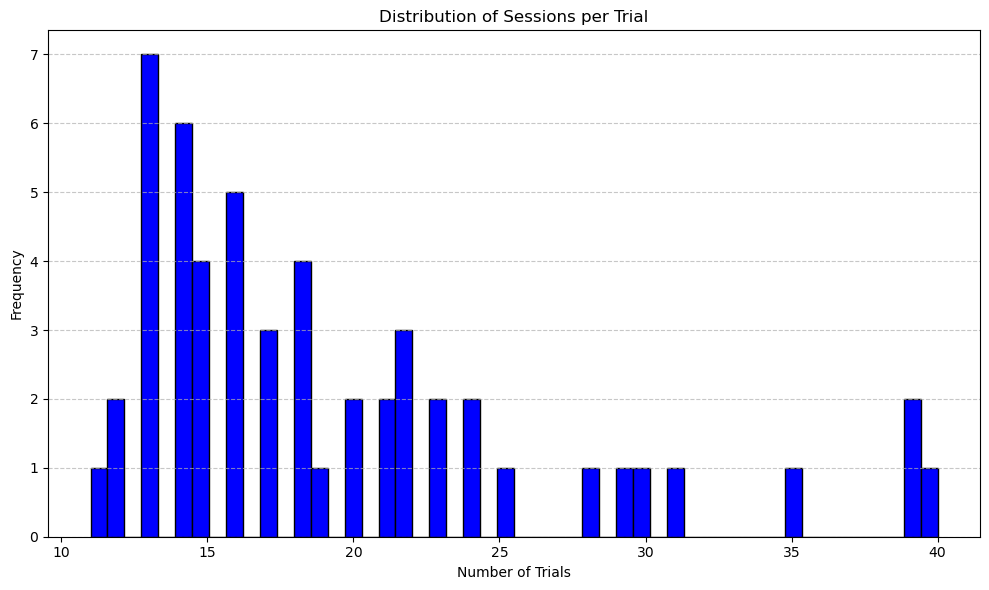

In [5]:
# Distribution of session per trial number
trials_per_session = decision_data.groupby('session')['trialno'].nunique()

# Plot the number of trials per session
plt.figure(figsize=(10, 6))
plt.hist(trials_per_session, bins=50, color='blue', edgecolor='black')
plt.title('Distribution of Sessions per Trial')
plt.xlabel('Number of Trials')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Difficulty counts:
difficulty
Easy      454
Medium    320
Hard      163
xHard      93
Name: count, dtype: int64


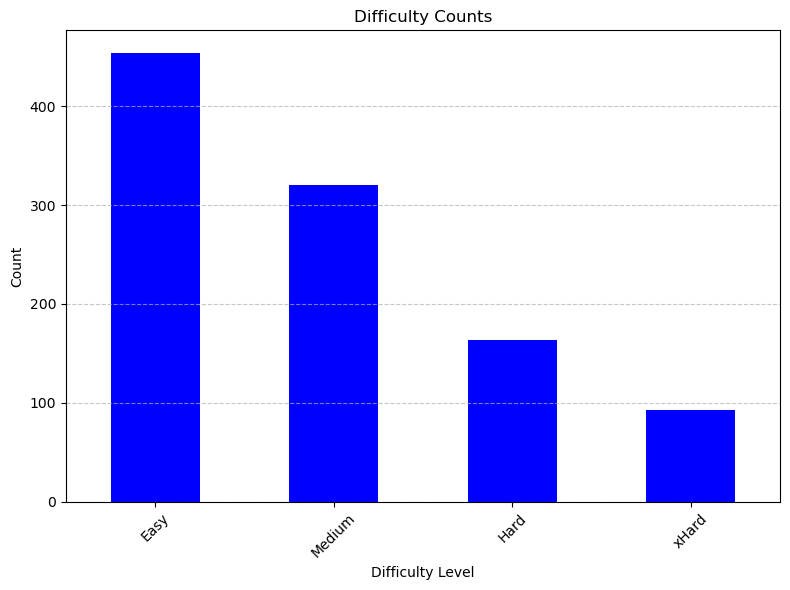

In [6]:
#Count of Difficulty Levels 

difficulty_counts = decision_data['difficulty'].value_counts()

print("Difficulty counts:")
print(difficulty_counts)

plt.figure(figsize=(8, 6))
difficulty_counts.plot(kind='bar', color='blue')
plt.title('Difficulty Counts')
plt.xlabel('Difficulty Level')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

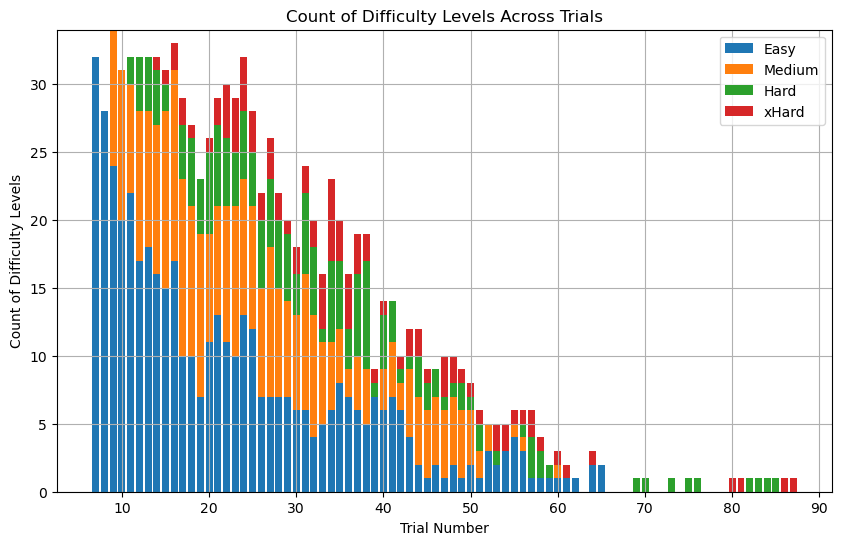

In [7]:
# Difficulty levels count across trials

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']
difficulty_trial_counts = decision_data.groupby(['trialno', 'difficulty']).size().unstack(fill_value=0)
difficulty_trial_counts = difficulty_trial_counts[difficulty_order]

plt.figure(figsize=(10, 6))

bottom = None
for difficulty in difficulty_trial_counts.columns:
    plt.bar(difficulty_trial_counts.index, difficulty_trial_counts[difficulty], label=difficulty, bottom=bottom)
    if bottom is None:
        bottom = difficulty_trial_counts[difficulty].values
    else:
        bottom += difficulty_trial_counts[difficulty].values

plt.xlabel('Trial Number')
plt.ylabel('Count of Difficulty Levels')
plt.title('Count of Difficulty Levels Across Trials')
plt.legend()
plt.grid(True)
plt.show()

# Features + Difficulty Level Analysis

## Accuracy vs. Difficulty Level

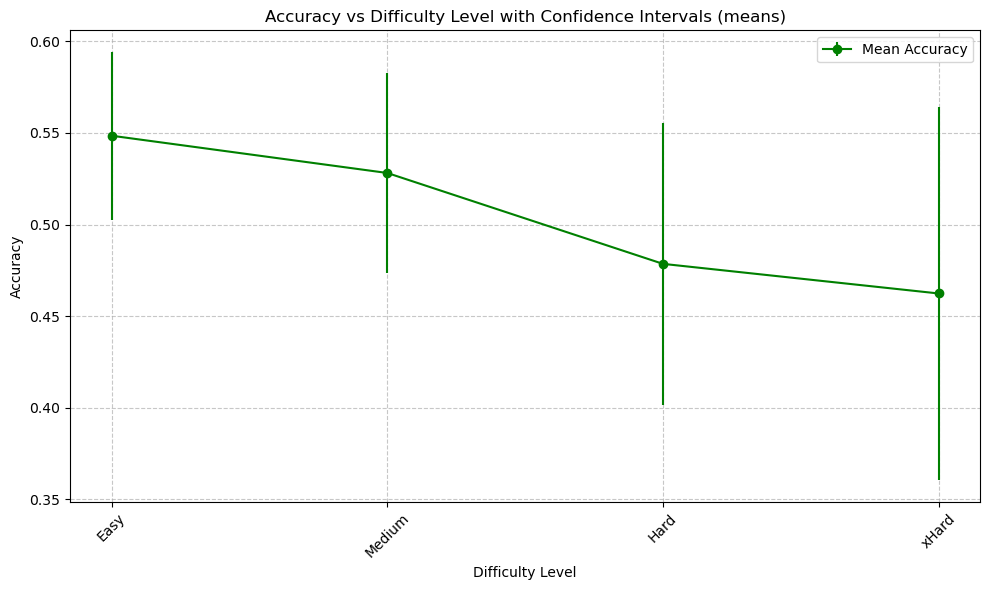

Accuracy means per difficulty level:
difficulty
Easy      0.548458
Medium    0.528125
Hard      0.478528
xHard     0.462366
Name: accuracy, dtype: float64


<Figure size 1000x600 with 0 Axes>

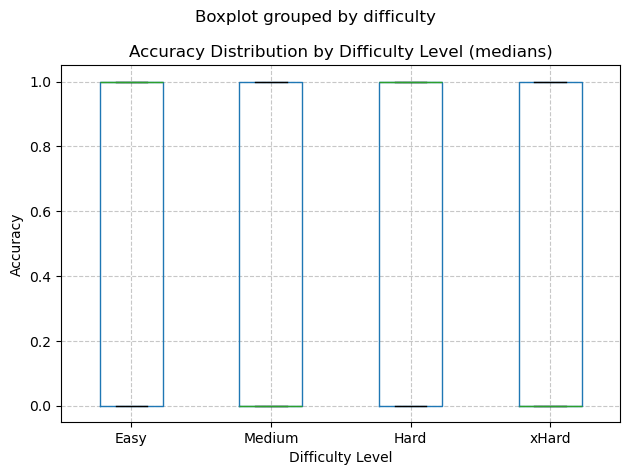


Accuracy medians per difficulty level:
difficulty
Easy      1.0
Medium    1.0
Hard      0.0
xHard     0.0
Name: accuracy, dtype: float64


In [8]:
#Accuracy means by difficulty level

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

mean_accuracy = decision_data.groupby('difficulty')['accuracy'].mean().loc[difficulty_order]
std_accuracy = decision_data.groupby('difficulty')['accuracy'].std().loc[difficulty_order]
count_accuracy = decision_data.groupby('difficulty')['accuracy'].count().loc[difficulty_order]
conf_interval = 1.96 * std_accuracy / np.sqrt(count_accuracy)

plt.figure(figsize=(10, 6))

plt.errorbar(mean_accuracy.index, mean_accuracy, yerr=conf_interval, fmt='o', linestyle='-', color='green', label='Mean Accuracy')

plt.title('Accuracy vs Difficulty Level with Confidence Intervals (means)')
plt.xlabel('Difficulty Level')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

print("Accuracy means per difficulty level:")
print(mean_accuracy)

median_accuracy = decision_data.groupby('difficulty')['accuracy'].median().loc[difficulty_order]

plt.figure(figsize=(10, 6))
decision_data.boxplot(column='accuracy', by='difficulty', positions=np.arange(len(difficulty_order)))
plt.title('Accuracy Distribution by Difficulty Level (medians)')
plt.xlabel('Difficulty Level')
plt.ylabel('Accuracy')
plt.xticks(np.arange(len(difficulty_order)), difficulty_order)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

print("\nAccuracy medians per difficulty level:")
print(median_accuracy)

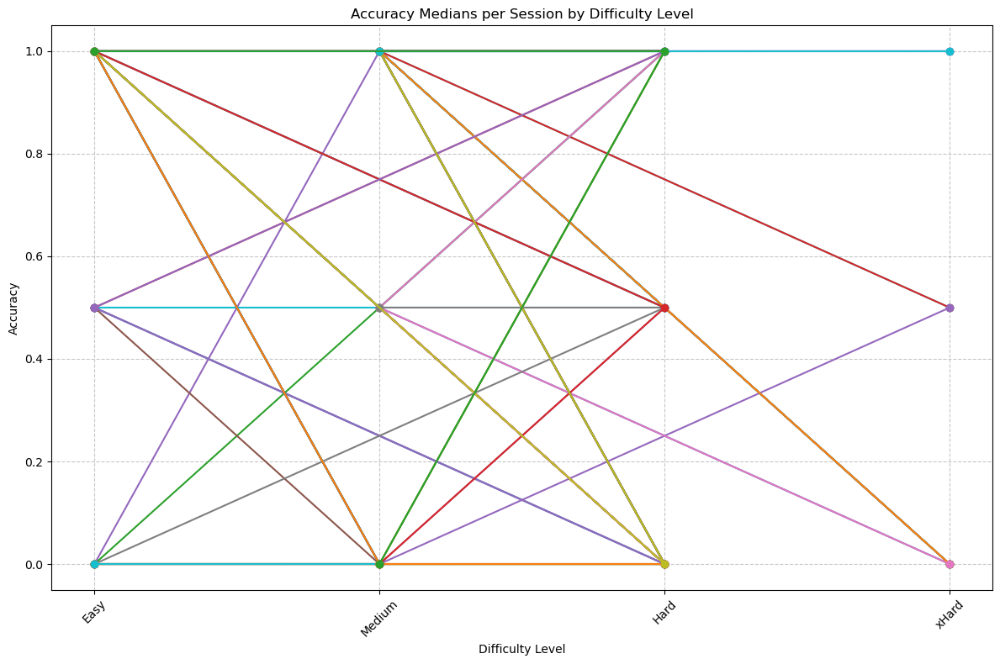

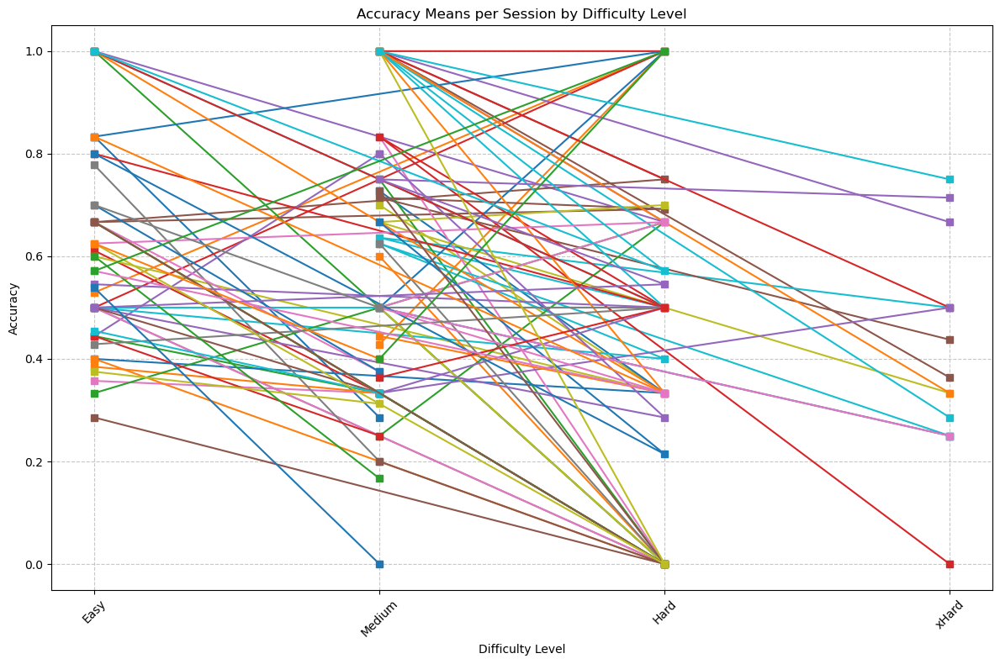

In [9]:
# Accuracy per session by difficulty level

#Medians
session_accuracy = decision_data.groupby(['session', 'difficulty'])['accuracy'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))
palette = sns.color_palette('husl', n_colors=len(sessions))

for session in sessions:
    available_difficulty_levels = session_accuracy.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_accuracy_session = session_accuracy.loc[session][available_difficulty_levels]
        plt.plot(median_accuracy_session.index, median_accuracy_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Accuracy Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Accuracy')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

# Means
session_mean_accuracy = decision_data.groupby(['session', 'difficulty'])['accuracy'].mean().unstack()

plt.figure(figsize=(12, 8))
palette = sns.color_palette('husl', n_colors=len(sessions))

for session in sessions:
    available_difficulty_levels = session_mean_accuracy.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_accuracy_session = session_mean_accuracy.loc[session][available_difficulty_levels]
        plt.plot(mean_accuracy_session.index, mean_accuracy_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Accuracy Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Accuracy')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

## Total trial duration vs. Difficulty Level

C:\Users\I587504\AppData\Local\Temp\ipykernel_41852\3272573089.py:7: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_duration_by_difficulty = trial_duration.groupby('difficulty')['durPeriodTotal'].mean()
C:\Users\I587504\AppData\Local\Temp\ipykernel_41852\3272573089.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  median_duration_by_difficulty = trial_duration.groupby('difficulty')['durPeriodTotal'].median()
C:\Users\I587504\AppData\Local\Temp\ipykernel_41852\3272573089.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observ

Total trial duration
Means: 
difficulty
Easy      8616.647577
Medium    8782.012500
Hard      9513.766871
xHard     8106.903226
Name: durPeriodTotal, dtype: float64
Standard Errors of the Mean: 
difficulty
Easy      246.971350
Medium    284.499826
Hard      416.462705
xHard     477.873892
Name: durPeriodTotal, dtype: float64


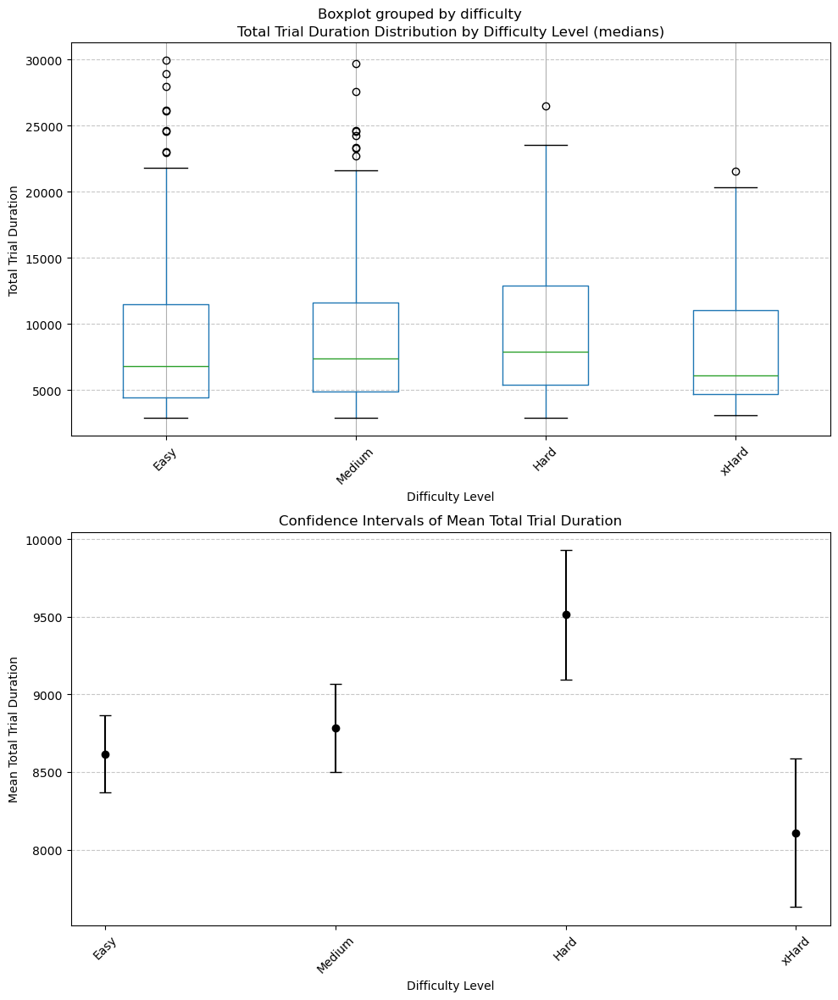

In [10]:
#Total trial duration vs. Difficulty level

trial_duration = data.groupby(['session', 'trialno', 'difficulty'])['durPeriodTotal'].sum().reset_index()

trial_duration['difficulty'] = pd.Categorical(trial_duration['difficulty'], categories=difficulty_order, ordered=True)

mean_duration_by_difficulty = trial_duration.groupby('difficulty')['durPeriodTotal'].mean()
median_duration_by_difficulty = trial_duration.groupby('difficulty')['durPeriodTotal'].median()
sem_duration_by_difficulty = trial_duration.groupby('difficulty')['durPeriodTotal'].sem()

print("Total trial duration")
print("Means: ")
print(mean_duration_by_difficulty)
print("Standard Errors of the Mean: ")
print(sem_duration_by_difficulty)

fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

# Subplot 1: Boxplot of trial duration by difficulty
trial_duration.boxplot(column='durPeriodTotal', by='difficulty', ax=ax1, positions=range(len(difficulty_order)))
ax1.set_title('Total Trial Duration Distribution by Difficulty Level (medians)')
ax1.set_xlabel('Difficulty Level')
ax1.set_ylabel('Total Trial Duration')
ax1.grid(axis='y', linestyle='--', alpha=0.7)
ax1.tick_params(axis='x', rotation=45)

# Subplot 2: Error bar plot of mean trial duration with confidence intervals
ax2.errorbar(mean_duration_by_difficulty.index, mean_duration_by_difficulty, yerr=sem_duration_by_difficulty, fmt='o', color='black', capsize=5)
ax2.set_title('Confidence Intervals of Mean Total Trial Duration')
ax2.set_xlabel('Difficulty Level')
ax2.set_ylabel('Mean Total Trial Duration')
ax2.grid(axis='y', linestyle='--', alpha=0.7)
ax2.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

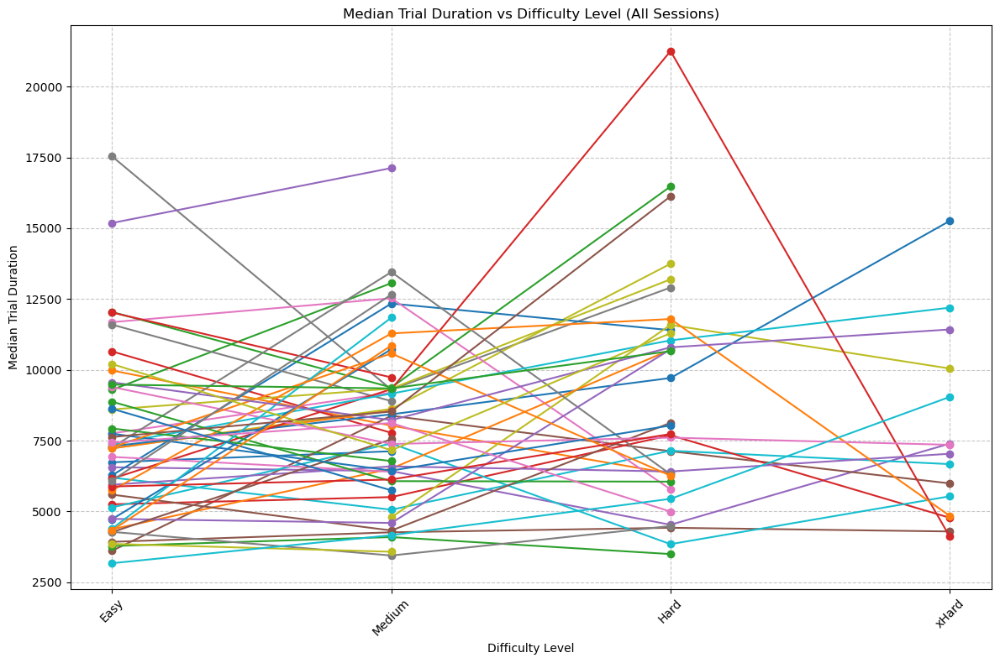

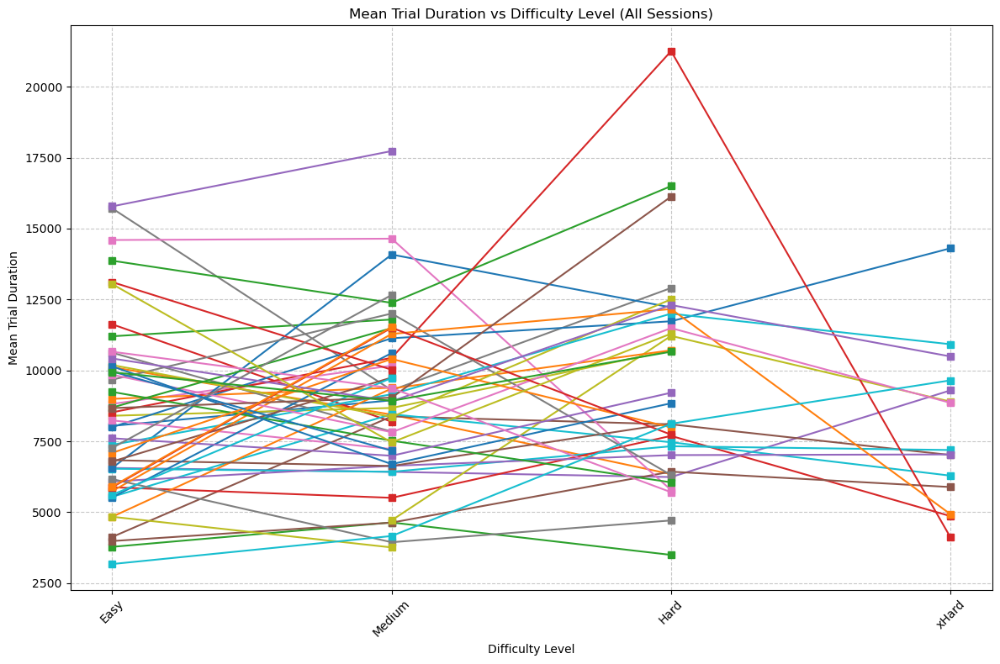

In [11]:
# Median trial duration per session by difficulty level (top sessions with most trials)

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

total_trial_duration_per_trial = data.groupby(['session', 'trialno', 'difficulty'])['durPeriodTotal'].sum().reset_index()

plt.figure(figsize=(12, 8))

all_sessions = data['session'].unique()

#Medians
for session_id in all_sessions:
    session_data = total_trial_duration_per_trial[total_trial_duration_per_trial['session'] == session_id]
    median_trial_duration_per_session = session_data.groupby('difficulty')['durPeriodTotal'].median().reindex(difficulty_order) 
    plt.plot(median_trial_duration_per_session.index,  median_trial_duration_per_session, marker='o', linestyle='-', label=f'Session {session_id}')

plt.title('Median Trial Duration vs Difficulty Level (All Sessions)')
plt.xlabel('Difficulty Level')
plt.ylabel('Median Trial Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

#Means
plt.figure(figsize=(12, 8))

for session_id in all_sessions:
    session_data = total_trial_duration_per_trial[total_trial_duration_per_trial['session'] == session_id]
    mean_trial_duration_by_session = session_data.groupby('difficulty')['durPeriodTotal'].mean().reindex(difficulty_order)
    plt.plot(mean_trial_duration_by_session.index, mean_trial_duration_by_session, marker='s', linestyle='-', label=f'Session {session_id}')

plt.title('Mean Trial Duration vs Difficulty Level (All Sessions)')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Trial Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

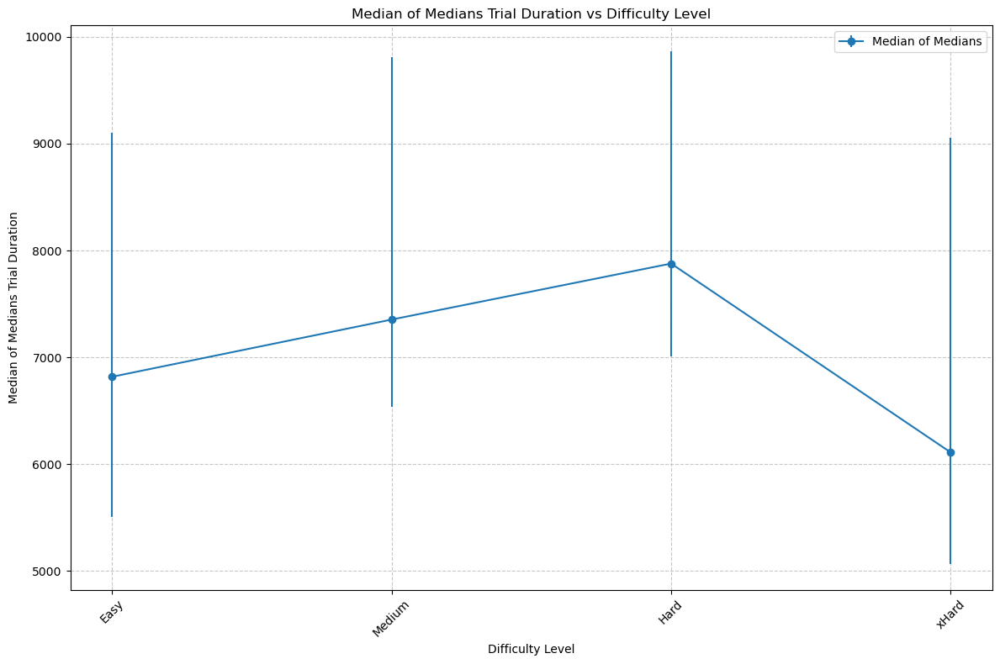

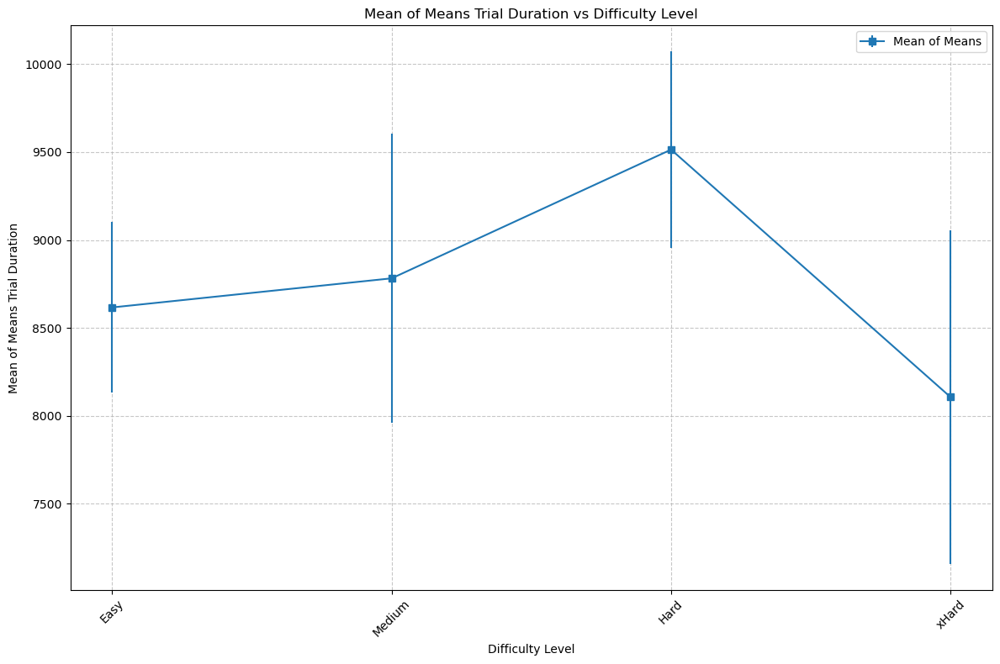

In [12]:
# Median of medians and mean of means across all sessions

overall_median_per_difficulty = total_trial_duration_per_trial.groupby('difficulty')['durPeriodTotal'].median().reindex(difficulty_order)
overall_mean_per_difficulty = total_trial_duration_per_trial.groupby('difficulty')['durPeriodTotal'].mean().reindex(difficulty_order)

def calculate_ci(data):
    n = len(data)
    mean = np.mean(data)
    se = stats.sem(data)
    ci = stats.t.interval(0.95, df=n-1, loc=mean, scale=se)
    return ci

median_ci = total_trial_duration_per_trial.groupby('difficulty')['durPeriodTotal'].apply(calculate_ci).apply(pd.Series)
mean_ci = total_trial_duration_per_trial.groupby('difficulty')['durPeriodTotal'].apply(calculate_ci).apply(pd.Series)

# Median of medians with confidence intervals
plt.figure(figsize=(12, 8))
plt.errorbar(overall_median_per_difficulty.index, overall_median_per_difficulty, 
             yerr=[np.abs(overall_median_per_difficulty - median_ci[0]), np.abs(median_ci[1] - overall_median_per_difficulty)],
             fmt='o', linestyle='-', label='Median of Medians')
plt.title('Median of Medians Trial Duration vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Median of Medians Trial Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

# Mean of means with confidence intervals
plt.figure(figsize=(12, 8))
plt.errorbar(overall_mean_per_difficulty.index, overall_mean_per_difficulty, 
             yerr=[np.abs(overall_mean_per_difficulty - mean_ci[0]), np.abs(mean_ci[1] - overall_mean_per_difficulty)],
             fmt='s', linestyle='-', label='Mean of Means')
plt.title('Mean of Means Trial Duration vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean of Means Trial Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

## Duration of exploration and decision periods vs. Difficulty Level

Shapiro-Wilk test for Easy: p-value = 2.9178972570534126e-24
Shapiro-Wilk test for Hard: p-value = 1.8307181863522315e-11
Shapiro-Wilk test for Medium: p-value = 3.198076735392095e-18
Shapiro-Wilk test for xHard: p-value = 5.7035672738566544e-11
Levene's test for homogeneity of variances: p-value = 0.23702754540940968
Kruskal-Wallis test:
H-statistic: 8.97766138241408
p-value: 0.029589369742263297
Shapiro-Wilk test for Easy: p-value = 1.8666521094080364e-26
Shapiro-Wilk test for Hard: p-value = 2.9312787623587787e-14
Shapiro-Wilk test for Medium: p-value = 1.5061519743592054e-22
Shapiro-Wilk test for xHard: p-value = 2.051996215992408e-11
Levene's test for homogeneity of variances: p-value = 0.9593512046687885
Kruskal-Wallis test:
H-statistic: 5.21361492506657
p-value: 0.15680703147864397
Exploration period duration
Means: 
difficulty
Easy      5742.665198
Hard      6540.969325
Medium    5922.818750
xHard     5242.774194
Name: durPeriodTotal, dtype: float64
Standard Errors of the Mean:

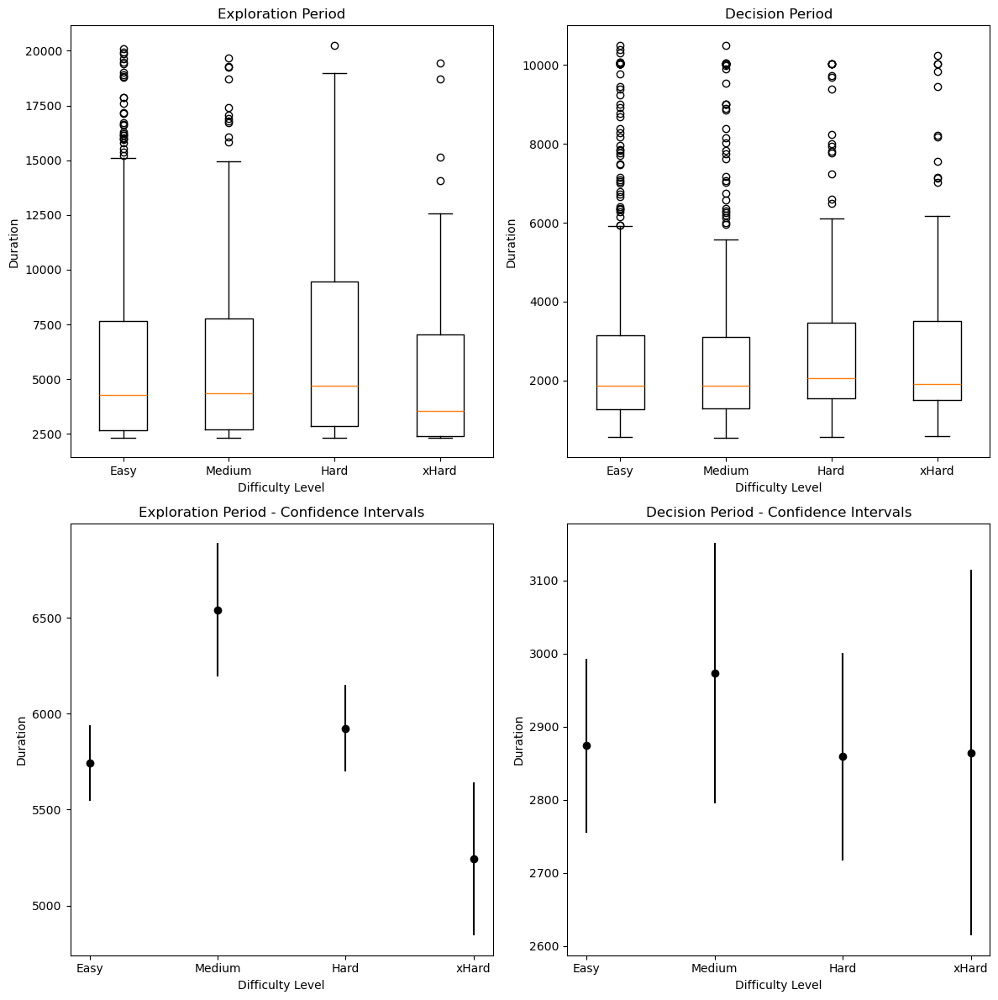

In [13]:
# Duration of both exploration and decision periods vs. difficulty level

exploration_grouped = data[data['period_in_trial'] == 'exploration'].groupby('difficulty')['durPeriodTotal']
decision_grouped = data[data['period_in_trial'] == 'decision'].groupby('difficulty')['durPeriodTotal']

# Means and standard errors of the mean for exploration and decision periods
exploration_means = exploration_grouped.mean()
exploration_sem = exploration_grouped.sem()
decision_means = decision_grouped.mean()
decision_sem = decision_grouped.sem()

# Shapiro-Wilk test for normality - Exploration period
for group_name, group_data in exploration_data.groupby('difficulty')['durPeriodTotal']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances - Exploration period
stat, p = levene(*[group_data for group_name, group_data in exploration_data.groupby('difficulty')['durPeriodTotal']])
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test - Exploration period
H, p = kruskal(*[group_data for group_name, group_data in exploration_data.groupby('difficulty')['durPeriodTotal']])
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Shapiro-Wilk test for normality - Decision period
for group_name, group_data in decision_data.groupby('difficulty')['durPeriodTotal']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances - Decision period
stat, p = levene(*[group_data for group_name, group_data in decision_data.groupby('difficulty')['durPeriodTotal']])
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test - Decision period
H, p = kruskal(*[group_data for group_name, group_data in decision_data.groupby('difficulty')['durPeriodTotal']])
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

print("Exploration period duration")
print("Means: ")
print(exploration_means)
print("Standard Errors of the Mean: ")
print(exploration_sem)
print("\nDecision period duration")
print("Means: ")
print(decision_means)
print("Standard Errors of the Mean: ")
print(decision_sem)

# Plots
difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))

# Exploration Period Boxplot
exploration_data_reordered = [exploration_grouped.get_group(difficulty_order[i]).values for i in range(len(difficulty_order))]
axs[0, 0].boxplot(exploration_data_reordered, positions=np.arange(len(difficulty_order)))
axs[0, 0].set_title('Exploration Period')
axs[0, 0].set_xlabel('Difficulty Level')
axs[0, 0].set_ylabel('Duration')
axs[0, 0].set_xticks(np.arange(len(difficulty_order)))
axs[0, 0].set_xticklabels(difficulty_order)

# Decision Period Boxplot
decision_data_reordered = [decision_grouped.get_group(difficulty_order[i]).values for i in range(len(difficulty_order))]
axs[0, 1].boxplot(decision_data_reordered, positions=np.arange(len(difficulty_order)))
axs[0, 1].set_title('Decision Period')
axs[0, 1].set_xlabel('Difficulty Level')
axs[0, 1].set_ylabel('Duration')
axs[0, 1].set_xticks(np.arange(len(difficulty_order)))
axs[0, 1].set_xticklabels(difficulty_order)

# Exploration Period Error Bars
axs[1, 0].errorbar(np.arange(len(difficulty_order)), exploration_means, yerr=exploration_sem, fmt='o', color='black')
axs[1, 0].set_title('Exploration Period - Confidence Intervals')
axs[1, 0].set_xlabel('Difficulty Level')
axs[1, 0].set_ylabel('Duration')
axs[1, 0].set_xticks(np.arange(len(difficulty_order)))
axs[1, 0].set_xticklabels(difficulty_order)

# Decision Period Error Bars
axs[1, 1].errorbar(np.arange(len(difficulty_order)), decision_means, yerr=decision_sem, fmt='o', color='black')
axs[1, 1].set_title('Decision Period - Confidence Intervals')
axs[1, 1].set_xlabel('Difficulty Level')
axs[1, 1].set_ylabel('Duration')
axs[1, 1].set_xticks(np.arange(len(difficulty_order)))
axs[1, 1].set_xticklabels(difficulty_order)

plt.tight_layout()
plt.show()

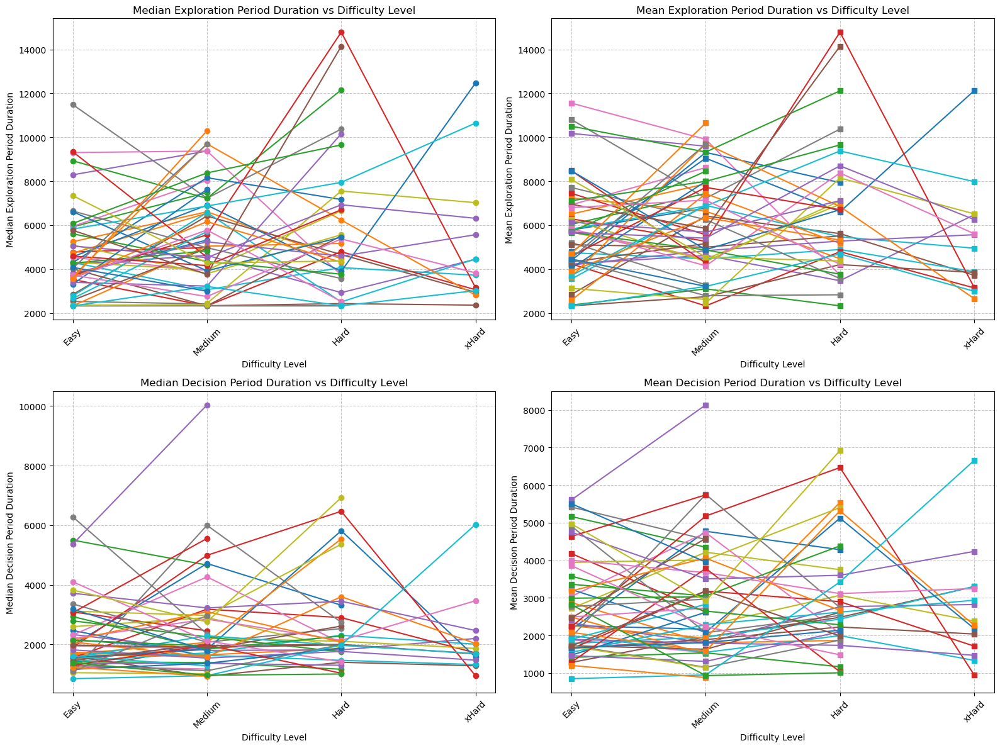

In [14]:
# Duration of both exploration and decision periods vs. difficulty level per session

exploration_grouped = data[data['period_in_trial'] == 'exploration'].groupby(['session', 'difficulty'])['durPeriodTotal'].median().unstack()
decision_grouped = data[data['period_in_trial'] == 'decision'].groupby(['session', 'difficulty'])['durPeriodTotal'].median().unstack()

exploration_mean_grouped = data[data['period_in_trial'] == 'exploration'].groupby(['session', 'difficulty'])['durPeriodTotal'].mean().unstack()
decision_mean_grouped = data[data['period_in_trial'] == 'decision'].groupby(['session', 'difficulty'])['durPeriodTotal'].mean().unstack()

plt.figure(figsize=(16, 12))

# Median duration for exploration period per session
plt.subplot(2, 2, 1)
for session in exploration_grouped.index.get_level_values('session').unique():
    available_difficulty_levels = exploration_grouped.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        duration_session_exploration = exploration_grouped.loc[session][difficulty_order]
        plt.plot(duration_session_exploration.index, duration_session_exploration, marker='o', linestyle='-', label=f'Session {session}')
plt.title('Median Exploration Period Duration vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Median Exploration Period Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()

# Mean duration for exploration period per session
plt.subplot(2, 2, 2)
for session in exploration_mean_grouped.index.get_level_values('session').unique():
    available_difficulty_levels = exploration_mean_grouped.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        duration_session_exploration = exploration_mean_grouped.loc[session][difficulty_order]
        plt.plot(duration_session_exploration.index, duration_session_exploration, marker='s', linestyle='-', label=f'Session {session}')
plt.title('Mean Exploration Period Duration vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Exploration Period Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()

# Median duration for decision period per session
plt.subplot(2, 2, 3)
for session in decision_grouped.index.get_level_values('session').unique():
    available_difficulty_levels = decision_grouped.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        duration_session_decision = decision_grouped.loc[session][difficulty_order]
        plt.plot(duration_session_decision.index, duration_session_decision, marker='o', linestyle='-', label=f'Session {session}')
plt.title('Median Decision Period Duration vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Median Decision Period Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()

# Mean duration for decision period per session
plt.subplot(2, 2, 4)
for session in decision_mean_grouped.index.get_level_values('session').unique():
    available_difficulty_levels = decision_mean_grouped.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        duration_session_decision = decision_mean_grouped.loc[session][difficulty_order]
        plt.plot(duration_session_decision.index, duration_session_decision, marker='s', linestyle='-', label=f'Session {session}')
plt.title('Mean Decision Period Duration vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Decision Period Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()

plt.tight_layout()
plt.show()

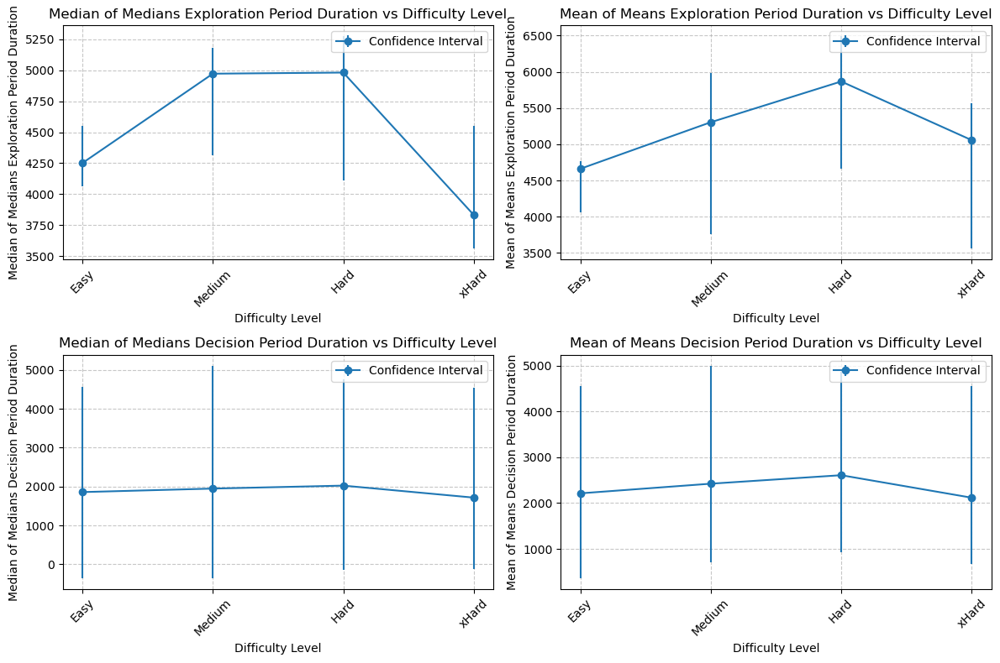

In [15]:
# Median of medians and mean of means acorss all sessions

def calculate_median_of_medians_and_mean_of_means(data):
    median_of_medians = data.median(axis=0)
    mean_of_means = data.mean(axis=0)
    return median_of_medians, mean_of_means

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

exploration_grouped = data[data['period_in_trial'] == 'exploration'].groupby(['session', 'difficulty'])['durPeriodTotal'].median().unstack()
decision_grouped = data[data['period_in_trial'] == 'decision'].groupby(['session', 'difficulty'])['durPeriodTotal'].median().unstack()
exploration_mean_grouped = data[data['period_in_trial'] == 'exploration'].groupby(['session', 'difficulty'])['durPeriodTotal'].mean().unstack()
decision_mean_grouped = data[data['period_in_trial'] == 'decision'].groupby(['session', 'difficulty'])['durPeriodTotal'].mean().unstack()

exploration_grouped = exploration_grouped.reindex(difficulty_order, axis=1)
decision_grouped = decision_grouped.reindex(difficulty_order, axis=1)
exploration_mean_grouped = exploration_mean_grouped.reindex(difficulty_order, axis=1)
decision_mean_grouped = decision_mean_grouped.reindex(difficulty_order, axis=1)

exploration_median_of_medians, exploration_mean_of_means = calculate_median_of_medians_and_mean_of_means(exploration_grouped)
decision_median_of_medians, decision_mean_of_means = calculate_median_of_medians_and_mean_of_means(decision_grouped)
exploration_mean_median_of_medians, exploration_mean_mean_of_means = calculate_median_of_medians_and_mean_of_means(exploration_mean_grouped)
decision_mean_median_of_medians, decision_mean_mean_of_means = calculate_median_of_medians_and_mean_of_means(decision_mean_grouped)

def calculate_ci(data):
    n = len(data)
    mean = np.mean(data)
    se = stats.sem(data)
    ci = stats.t.interval(0.95, df=n-1, loc=mean, scale=se)
    return ci

median_ci = data.groupby('difficulty')['durPeriodTotal'].apply(calculate_ci).apply(pd.Series)

mean_ci = data.groupby('difficulty')['durPeriodTotal'].apply(calculate_ci).apply(pd.Series)


# Median of medians for exploration period
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.errorbar(difficulty_order, exploration_median_of_medians, 
             yerr=[np.abs(exploration_median_of_medians - median_ci[0]), np.abs(median_ci[1] - exploration_median_of_medians)],
             fmt='o', linestyle='-', label='Confidence Interval')
plt.title('Median of Medians Exploration Period Duration vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Median of Medians Exploration Period Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.legend()

# Mean of means for exploration period
plt.subplot(2, 2, 2)
plt.errorbar(difficulty_order, exploration_mean_of_means, 
             yerr=[np.abs(exploration_mean_of_means - mean_ci[0]), np.abs(mean_ci[1] - exploration_mean_of_means)],
             fmt='o', linestyle='-', label='Confidence Interval')
plt.title('Mean of Means Exploration Period Duration vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean of Means Exploration Period Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.legend()

# Median of medians for decision period
plt.subplot(2, 2, 3)
plt.errorbar(difficulty_order, decision_median_of_medians, 
             yerr=[np.abs(decision_median_of_medians - median_ci[0]), np.abs(mean_ci[1] - decision_median_of_medians)],
             fmt='o', linestyle='-', label='Confidence Interval')
plt.title('Median of Medians Decision Period Duration vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Median of Medians Decision Period Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.legend()

# Mean of means for decision period
plt.subplot(2, 2, 4)
plt.errorbar(difficulty_order, decision_mean_of_means, 
             yerr=[np.abs(decision_mean_of_means - mean_ci[0]), np.abs(mean_ci[1] - decision_mean_of_means)],
             fmt='o', linestyle='-', label='Confidence Interval')
plt.title('Mean of Means Decision Period Duration vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean of Means Decision Period Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout()
plt.show()

## Look duration of bottom images (exploration period) vs. Difficulty Level
How long infants take to look at bottom cards before deiciding to look up and flip the top card for each difficulty level. 

Shapiro-Wilk test for Easy: p-value = 6.115145120810978e-19
Shapiro-Wilk test for Hard: p-value = 2.6859133949119092e-11
Shapiro-Wilk test for Medium: p-value = 4.876325208936565e-15
Shapiro-Wilk test for xHard: p-value = 3.60759459119217e-07
Levene's test for homogeneity of variances: p-value = 0.10247845466206298
Kruskal-Wallis test:
H-statistic: 7.948822916796224
p-value: 0.047081307575384236
Mean Duration of Exploration of bottom cards by Difficulty Level:
difficulty
Easy      3264.757709
Hard      3746.404908
Medium    3225.625000
xHard     2629.483871
Name: durLookBottom, dtype: float64
SEM Duration of Exploration of bottom cards by Difficulty Level:
difficulty
Easy      122.832924
Hard      252.918052
Medium    147.748049
xHard     232.108501
Name: durLookBottom, dtype: float64


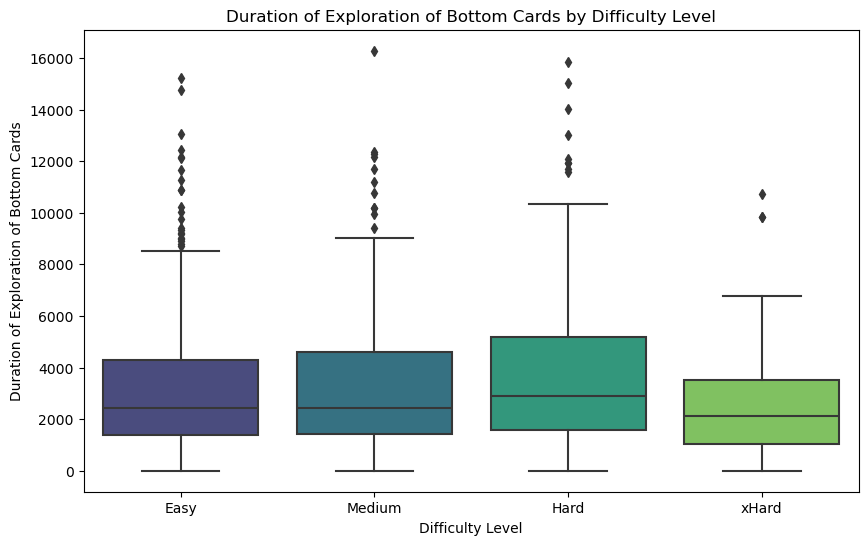

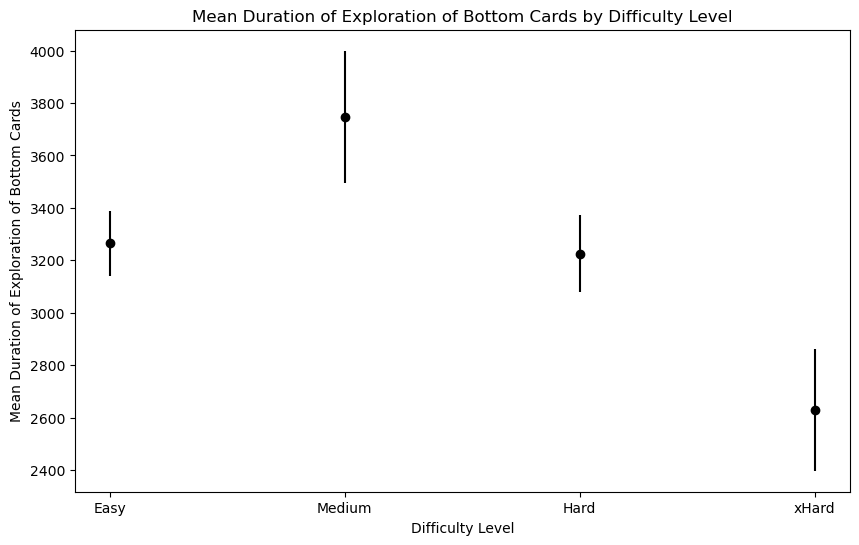

In [16]:
# durLookBottomExploration vs. difficulty
difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

durLookBottom_by_difficulty = [exploration_data[exploration_data['difficulty'] == level]['durLookBottom'] for level in exploration_data['difficulty'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in exploration_data.groupby('difficulty')['durLookBottom']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*durLookBottom_by_difficulty)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Based on this, I can't perform ANOVA test 

#Kruskal-Wallis test
H, p = kruskal(*durLookBottom_by_difficulty)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of duration of exploration of bottom cards by difficulty level
mean_gazeduration_by_difficulty = exploration_data.groupby('difficulty')['durLookBottom'].mean()
sem_gazeduration_by_difficulty = exploration_data.groupby('difficulty')['durLookBottom'].sem()

print("Mean Duration of Exploration of bottom cards by Difficulty Level:")
print(mean_gazeduration_by_difficulty)
print("SEM Duration of Exploration of bottom cards by Difficulty Level:")
print(sem_gazeduration_by_difficulty)

# Plots
plt.figure(figsize=(10, 6))
sns.boxplot(x='difficulty', y='durLookBottom', data=exploration_data, order=difficulty_order, palette='viridis')
plt.xlabel('Difficulty Level')
plt.ylabel('Duration of Exploration of Bottom Cards')
plt.title('Duration of Exploration of Bottom Cards by Difficulty Level')
plt.show()

plt.figure(figsize=(10, 6))
x_gaze_positions = np.arange(len(mean_gazeduration_by_difficulty))
plt.errorbar(x_gaze_positions, mean_gazeduration_by_difficulty, yerr=sem_gazeduration_by_difficulty, color='black', fmt='o')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Duration of Exploration of Bottom Cards')
plt.title('Mean Duration of Exploration of Bottom Cards by Difficulty Level')
plt.xticks(x_gaze_positions, difficulty_order)
plt.show()

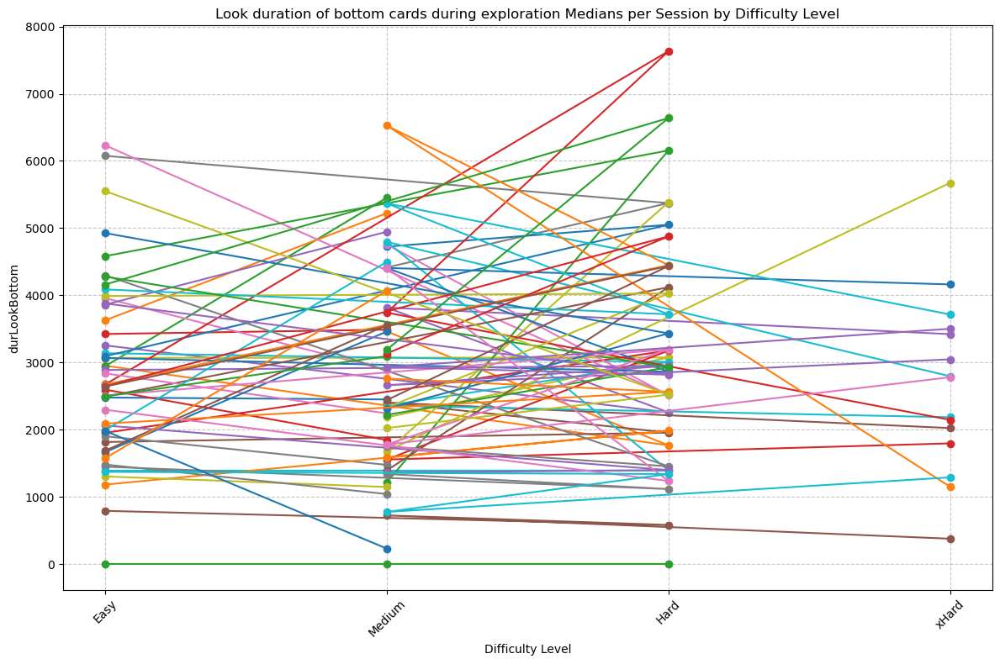

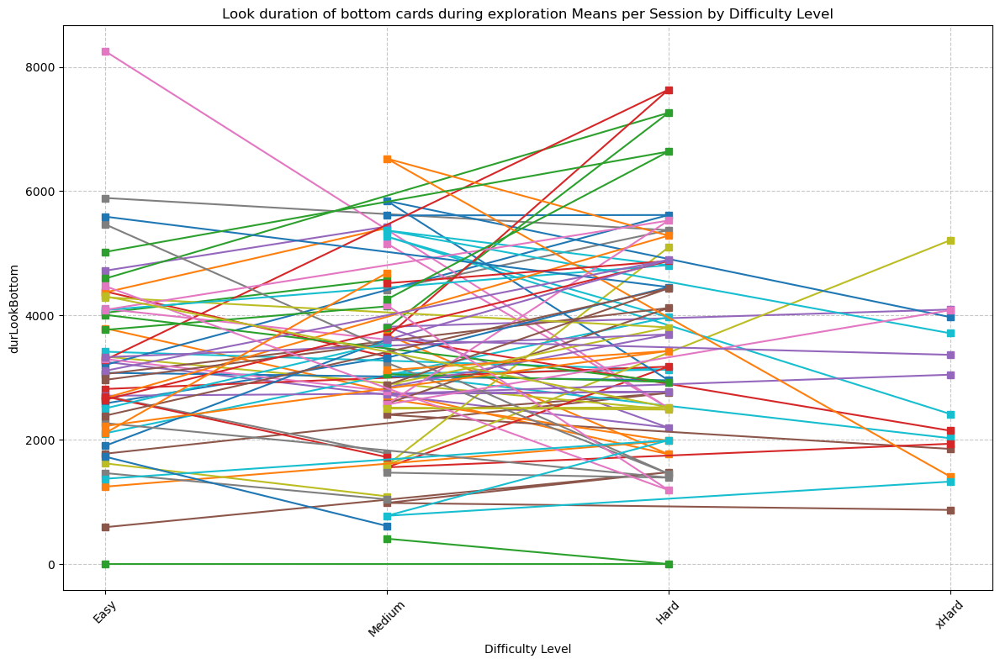

In [17]:
#look duration of bottom cards during exploration per session by difficulty level per session

#Medians
session_look_exploration = exploration_data.groupby(['session', 'difficulty'])['durLookBottom'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_look_exploration.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_durLookBottom_session = session_look_exploration.loc[session][available_difficulty_levels]
        plt.plot(median_durLookBottom_session.index, median_durLookBottom_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Look duration of bottom cards during exploration Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('durLookBottom')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_look_exploration_mean = exploration_data.groupby(['session', 'difficulty'])['durLookBottom'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_look_exploration_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_durLookBottom_session = session_look_exploration_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_durLookBottom_session.index, mean_durLookBottom_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Look duration of bottom cards during exploration Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('durLookBottom')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

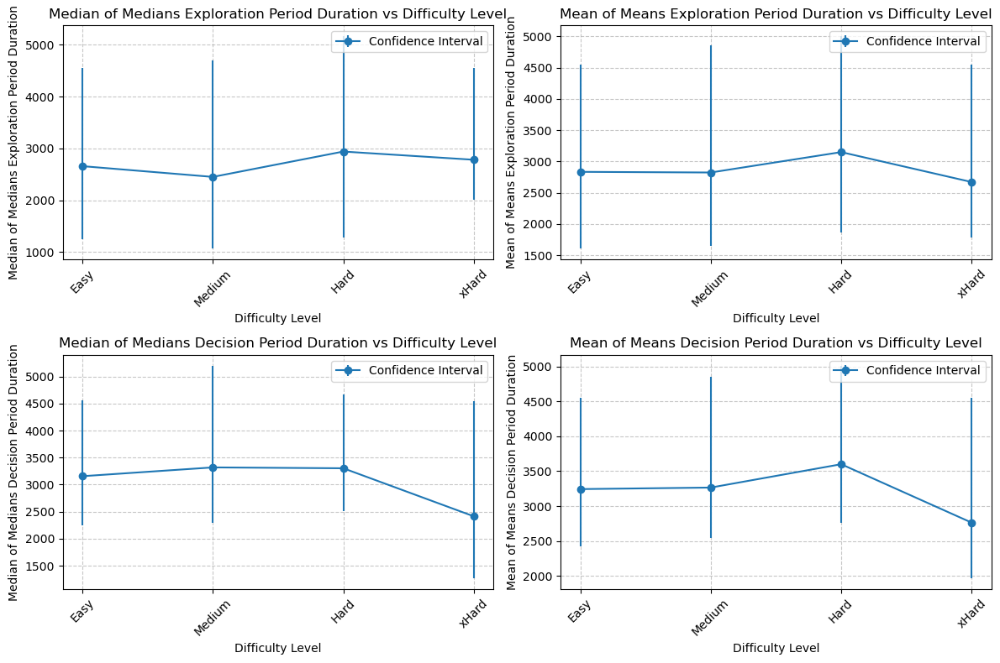

In [18]:
# Mean of means and median of medians across all sessions

def calculate_median_of_medians_and_mean_of_means(data):
    median_of_medians = data.median(axis=0)
    mean_of_means = data.mean(axis=0)
    return median_of_medians, mean_of_means

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

session_look_exploration_median = exploration_data.groupby(['session', 'difficulty'])['durLookBottom'].median().unstack()
session_look_exploration_mean = exploration_data.groupby(['session', 'difficulty'])['durLookBottom'].mean().unstack()

session_look_exploration_median = session_look_exploration_median.reindex(difficulty_order, axis=1)
session_look_exploration_mean = session_look_exploration_mean.reindex(difficulty_order, axis=1)

exploration_median_of_medians, exploration_mean_of_means = calculate_median_of_medians_and_mean_of_means(session_look_exploration_median)
decision_median_of_medians, decision_mean_of_means = calculate_median_of_medians_and_mean_of_means(session_look_exploration_mean)

def calculate_ci(data):
    n = len(data)
    mean = np.mean(data)
    se = stats.sem(data)
    ci = stats.t.interval(0.95, df=n-1, loc=mean, scale=se)
    return ci

median_ci = data.groupby('difficulty')['durPeriodTotal'].apply(calculate_ci).apply(pd.Series)

mean_ci = data.groupby('difficulty')['durPeriodTotal'].apply(calculate_ci).apply(pd.Series)


# Median of medians for exploration period
plt.figure(figsize=(12, 8))
plt.subplot(2, 2, 1)
plt.errorbar(difficulty_order, exploration_median_of_medians, 
             yerr=[np.abs(exploration_median_of_medians - median_ci[0]), np.abs(median_ci[1] - exploration_median_of_medians)],
             fmt='o', linestyle='-', label='Confidence Interval')
plt.title('Median of Medians Exploration Period Duration vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Median of Medians Exploration Period Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.legend()

# Mean of means for exploration period
plt.subplot(2, 2, 2)
plt.errorbar(difficulty_order, exploration_mean_of_means, 
             yerr=[np.abs(exploration_mean_of_means - mean_ci[0]), np.abs(mean_ci[1] - exploration_mean_of_means)],
             fmt='o', linestyle='-', label='Confidence Interval')
plt.title('Mean of Means Exploration Period Duration vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean of Means Exploration Period Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.legend()

# Median of medians for decision period
plt.subplot(2, 2, 3)
plt.errorbar(difficulty_order, decision_median_of_medians, 
             yerr=[np.abs(decision_median_of_medians - median_ci[0]), np.abs(mean_ci[1] - decision_median_of_medians)],
             fmt='o', linestyle='-', label='Confidence Interval')
plt.title('Median of Medians Decision Period Duration vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Median of Medians Decision Period Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.legend()

# Mean of means for decision period
plt.subplot(2, 2, 4)
plt.errorbar(difficulty_order, decision_mean_of_means, 
             yerr=[np.abs(decision_mean_of_means - mean_ci[0]), np.abs(mean_ci[1] - decision_mean_of_means)],
             fmt='o', linestyle='-', label='Confidence Interval')
plt.title('Mean of Means Decision Period Duration vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean of Means Decision Period Duration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.legend()

plt.tight_layout()
plt.show()

## Look duration of bottom images (both periods) vs. Difficulty Level
How long infants take to look at bottom cards for each difficulty level

Shapiro-Wilk test for Easy: p-value = 3.095516838770787e-18
Shapiro-Wilk test for Hard: p-value = 2.7812365750070507e-11
Shapiro-Wilk test for Medium: p-value = 9.77161084510629e-15
Shapiro-Wilk test for xHard: p-value = 1.3344788738562754e-06
Levene's test for homogeneity of variances: p-value = 0.12972286056178614
Kruskal-Wallis test:
H-statistic: 7.334819156090553
p-value: 0.06195805765318944
Mean Look duration of bottom cards by Difficulty Level:
difficulty
Easy      3689.735683
Medium    3644.850000
Hard      4163.914110
xHard     3073.075269
Name: durLookBottom, dtype: float64
SEM Look duration of bottom cards by Difficulty Level:
difficulty
Easy      123.442614
Medium    149.246532
Hard      252.174652
xHard     231.165918
Name: durLookBottom, dtype: float64


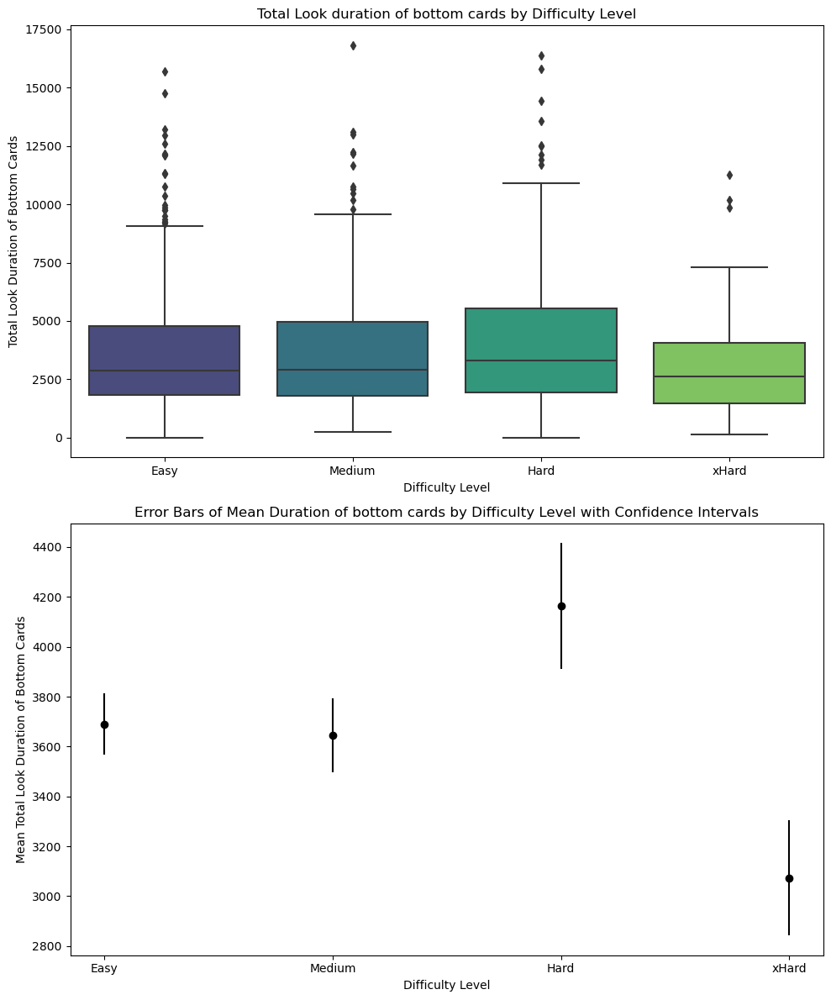

In [19]:
# Look Duration of bottom cards during both periods vs. difficulty level

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

durLookBottom_total_by_difficulty = data.groupby(['session', 'trialno', 'difficulty'])['durLookBottom'].sum().reset_index()

# Shapiro-Wilk test for normality
for group_name, group_data in durLookBottom_total_by_difficulty.groupby('difficulty')['durLookBottom']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*[group_data['durLookBottom'] for group_name, group_data in durLookBottom_total_by_difficulty.groupby('difficulty')])
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*[group_data['durLookBottom'] for group_name, group_data in durLookBottom_total_by_difficulty.groupby('difficulty')])
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of total duration of gaze of bottom cards by difficulty level
mean_totalgazeduration_by_difficulty = durLookBottom_total_by_difficulty.groupby('difficulty')['durLookBottom'].mean().reindex(difficulty_order)
sem_totalgazeduration_by_difficulty = durLookBottom_total_by_difficulty.groupby('difficulty')['durLookBottom'].sem().reindex(difficulty_order)
print("Mean Look duration of bottom cards by Difficulty Level:")
print(mean_totalgazeduration_by_difficulty)
print("SEM Look duration of bottom cards by Difficulty Level:")
print(sem_totalgazeduration_by_difficulty)

#Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='difficulty', y='durLookBottom', data=durLookBottom_total_by_difficulty, order=difficulty_order, palette='viridis', ax=ax1)
ax1.set_xlabel('Difficulty Level')
ax1.set_ylabel('Total Look Duration of Bottom Cards')
ax1.set_title('Total Look duration of bottom cards by Difficulty Level')

ax2.errorbar(np.arange(len(mean_totalgazeduration_by_difficulty)), mean_totalgazeduration_by_difficulty, yerr=sem_totalgazeduration_by_difficulty, fmt='o', color='black')
ax2.set_xlabel('Difficulty Level')
ax2.set_ylabel('Mean Total Look Duration of Bottom Cards')
ax2.set_title('Error Bars of Mean Duration of bottom cards by Difficulty Level with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_totalgazeduration_by_difficulty)))
ax2.set_xticklabels(mean_totalgazeduration_by_difficulty.index)

plt.tight_layout()
plt.show()

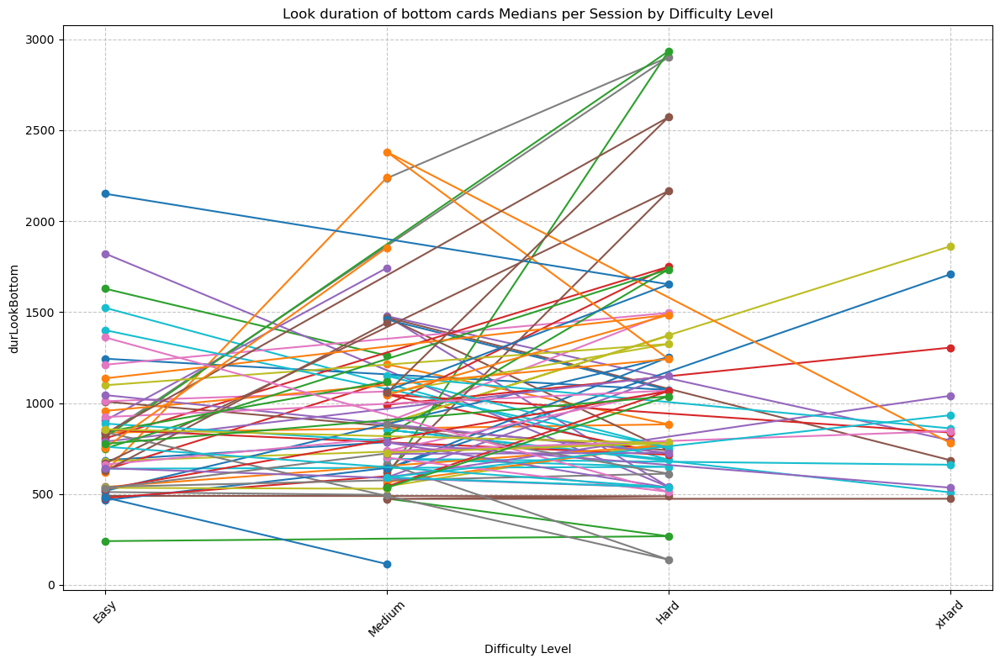

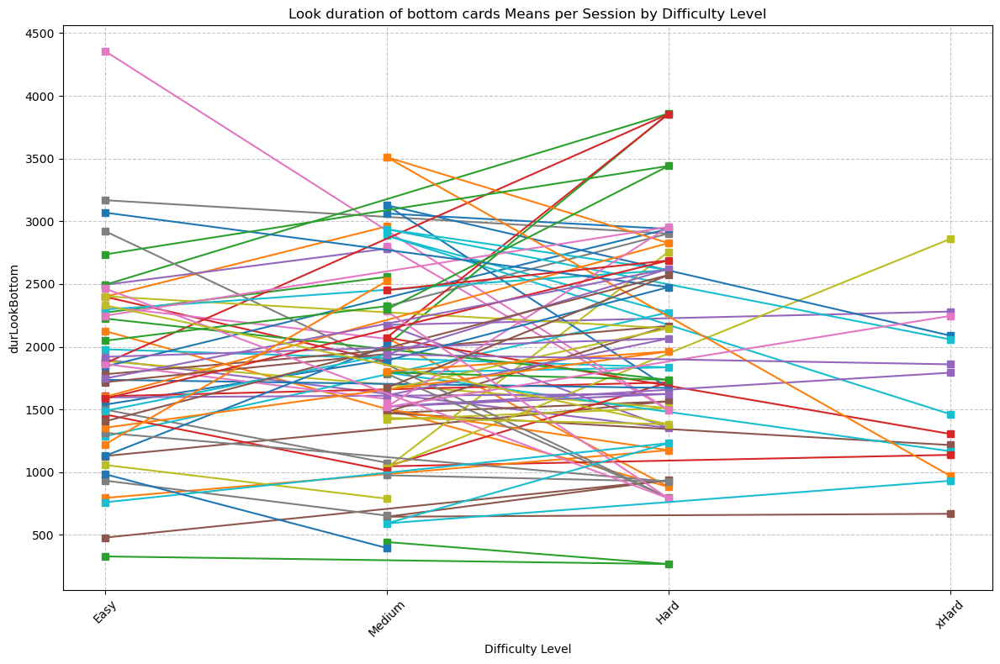

In [20]:
# Look Duration of bottom cards during both periods vs. difficulty level per session

#Medians
session_look_exploration = data.groupby(['session', 'difficulty'])['durLookBottom'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_look_exploration.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_durLookBottom_session = session_look_exploration.loc[session][available_difficulty_levels]
        plt.plot(median_durLookBottom_session.index, median_durLookBottom_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Look duration of bottom cards Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('durLookBottom')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_look_exploration_mean = data.groupby(['session', 'difficulty'])['durLookBottom'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_look_exploration_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_durLookBottom_session = session_look_exploration_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_durLookBottom_session.index, mean_durLookBottom_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Look duration of bottom cards Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('durLookBottom')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

## Look Duration of Top card (decision period) vs. difficulty level

Shapiro-Wilk test for Easy: p-value = 2.4936864554606906e-23
Shapiro-Wilk test for Hard: p-value = 6.152749243902459e-11
Shapiro-Wilk test for Medium: p-value = 4.356622668381656e-19
Shapiro-Wilk test for xHard: p-value = 6.241215107518201e-10
Levene's test for homogeneity of variances: p-value = 0.7139761274105348
Kruskal-Wallis test:
H-statistic: 3.2804650901879002
p-value: 0.3503708080897381
Mean LookTotDurInT (decision) by Difficulty Level:
difficulty
Easy      1527.325991
Hard      1601.042945
Medium    1434.368750
xHard     1418.430108
Name: LookTotDurInT, dtype: float64
SEM LookTotDurInT (decision) by Difficulty Level:
difficulty
Easy       69.578898
Hard      108.887590
Medium     76.458334
xHard     138.334918
Name: LookTotDurInT, dtype: float64


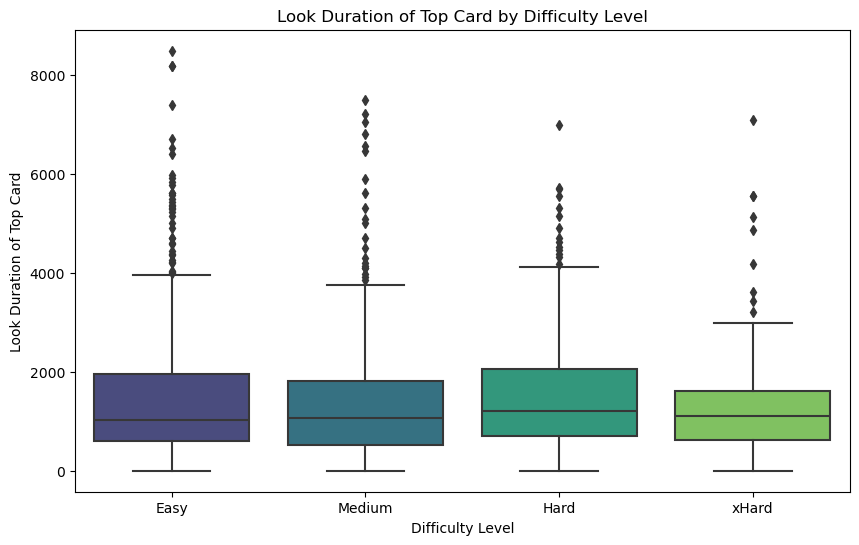

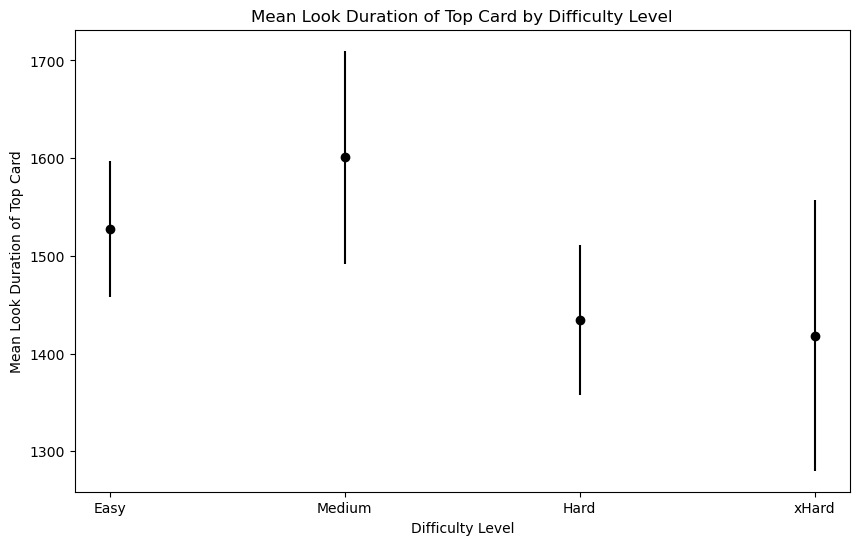

In [21]:
# Look duration of top card (decision period) vs. difficulty levels

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

LookTotDurInT_by_difficulty = [decision_data[decision_data['difficulty'] == level]['LookTotDurInT'] for level in decision_data['difficulty'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in decision_data.groupby('difficulty')['LookTotDurInT']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*LookTotDurInT_by_difficulty)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Based on this, I can't perform ANOVA test 

#Kruskal-Wallis test
H, p = kruskal(*LookTotDurInT_by_difficulty)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of duration of exploration of bottom cards by difficulty level
mean_LookTotDurInT_by_difficulty = decision_data.groupby('difficulty')['LookTotDurInT'].mean()
sem_LookTotDurInT_by_difficulty = decision_data.groupby('difficulty')['LookTotDurInT'].sem()

print("Mean LookTotDurInT (decision) by Difficulty Level:")
print(mean_LookTotDurInT_by_difficulty)
print("SEM LookTotDurInT (decision) by Difficulty Level:")
print(sem_LookTotDurInT_by_difficulty)

# Plots
plt.figure(figsize=(10, 6))
sns.boxplot(x='difficulty', y='LookTotDurInT', data=decision_data, order=difficulty_order, palette='viridis')
plt.xlabel('Difficulty Level')
plt.ylabel('Look Duration of Top Card')
plt.title('Look Duration of Top Card by Difficulty Level')
plt.show()

plt.figure(figsize=(10, 6))
x_gaze_positions = np.arange(len(mean_LookTotDurInT_by_difficulty))
plt.errorbar(x_gaze_positions, mean_LookTotDurInT_by_difficulty, yerr=sem_LookTotDurInT_by_difficulty, color='black', fmt='o')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Look Duration of Top Card')
plt.title('Mean Look Duration of Top Card by Difficulty Level')
plt.xticks(x_gaze_positions, difficulty_order)
plt.show()

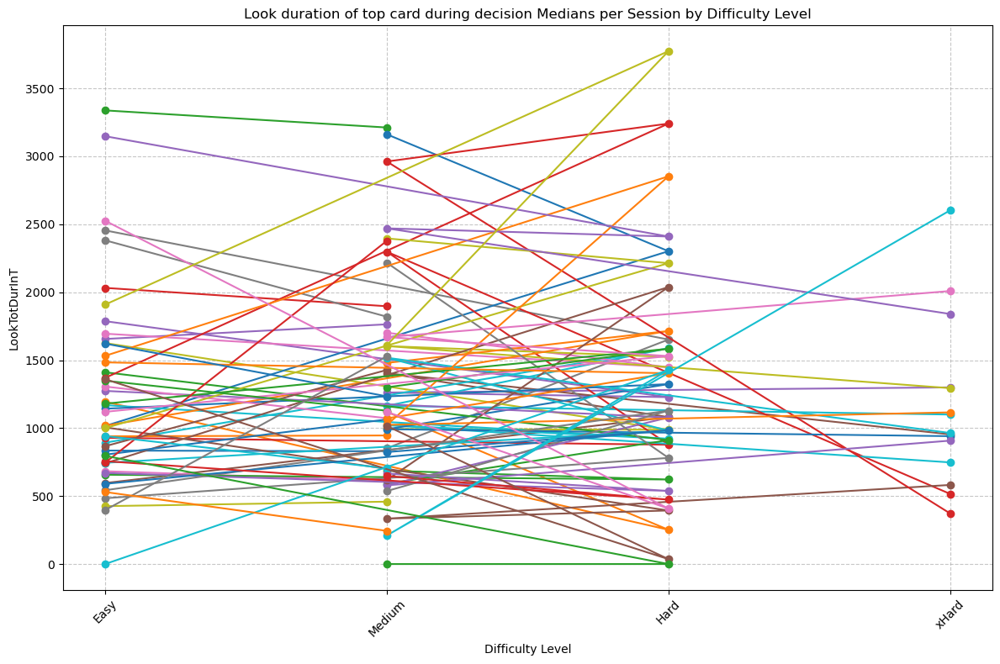

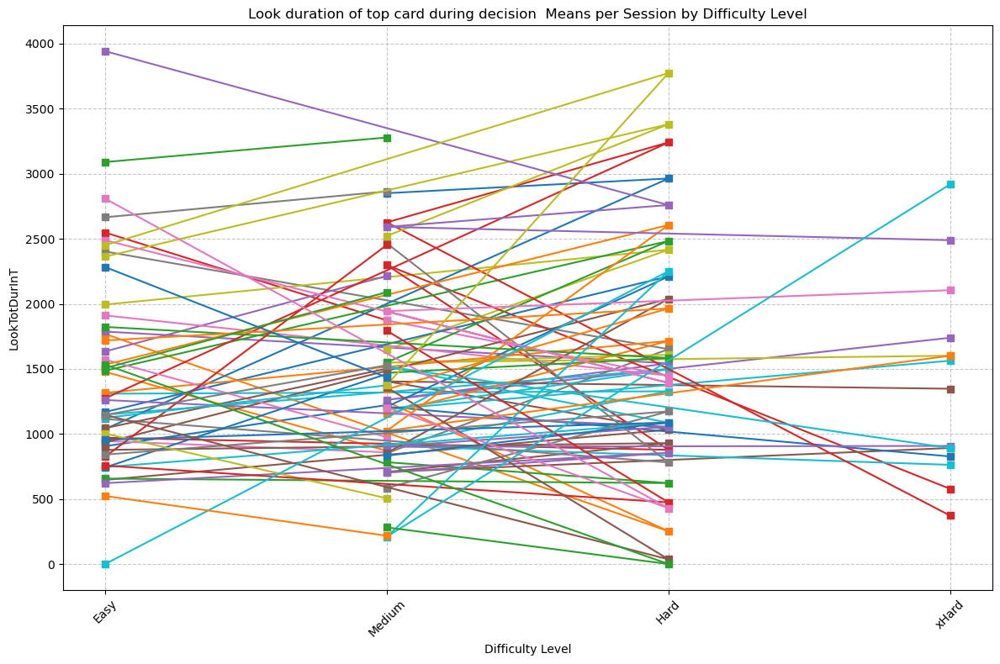

In [22]:
# Look duration of top card (decision period) vs. difficulty levels per session

#Medians
session_durlookT_decision = decision_data.groupby(['session', 'difficulty'])['LookTotDurInT'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_durlookT_decision.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_durlookT_session = session_durlookT_decision.loc[session][available_difficulty_levels]
        plt.plot(median_durlookT_session.index,median_durlookT_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Look duration of top card during decision Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('LookTotDurInT')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_durlookT_decision_mean = decision_data.groupby(['session', 'difficulty'])['LookTotDurInT'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_durlookT_decision_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_durlookT_session = session_durlookT_decision_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_durlookT_session.index, mean_durlookT_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Look duration of top card during decision  Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('LookTotDurInT')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

## Number of fixations of bottom cards during exploration vs. Difficulty level

Shapiro-Wilk test for Easy: p-value = 1.7131809466218468e-19
Shapiro-Wilk test for Hard: p-value = 3.0448330001842977e-09
Shapiro-Wilk test for Medium: p-value = 1.4994592983143136e-16
Shapiro-Wilk test for xHard: p-value = 1.4817875354392727e-06
Levene's test for homogeneity of variances: p-value = 0.22565246075484177
Kruskal-Wallis test:
H-statistic: 8.871453629556337
p-value: 0.031049715002661453
Mean FixNb of bottom cards during exploration by Difficulty Level:
difficulty
Easy       8.680617
Hard      10.067485
Medium     8.878125
xHard      7.419355
Name: FixNbInBottom, dtype: float64
SEM FixNb of bottom cards during exploration by Difficulty Level:
difficulty
Easy      0.314906
Hard      0.611444
Medium    0.407563
xHard     0.627841
Name: FixNbInBottom, dtype: float64


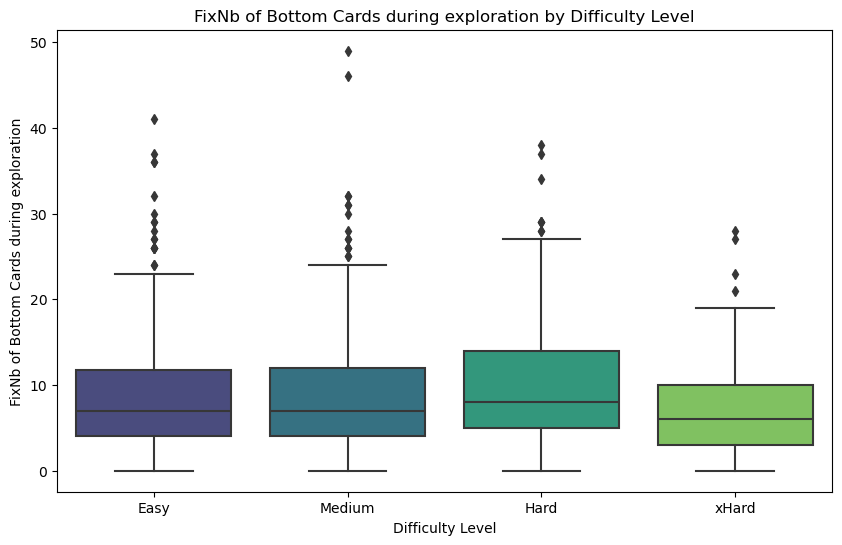

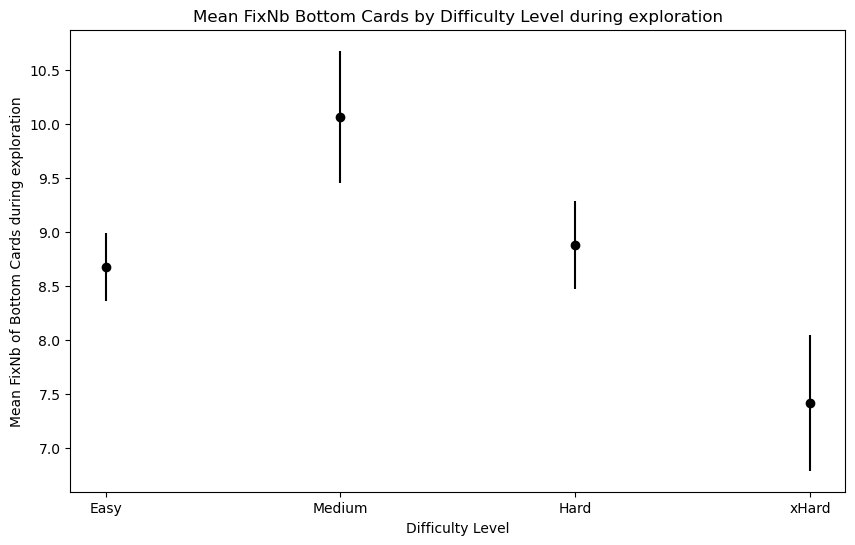

In [23]:
# Fix Number of bottom cards (exploration period) vs. difficulty level

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

FixNbInBottom_by_difficulty = [exploration_data[exploration_data['difficulty'] == level]['FixNbInBottom'] for level in exploration_data['difficulty'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in exploration_data.groupby('difficulty')['FixNbInBottom']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*FixNbInBottom_by_difficulty)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Based on this, I can't perform ANOVA test 

#Kruskal-Wallis test
H, p = kruskal(*FixNbInBottom_by_difficulty)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Median and SEM of duration of exploration of bottom cards by difficulty level
mean_FixNbB_by_difficulty = exploration_data.groupby('difficulty')['FixNbInBottom'].mean()
sem_FixNbB_by_difficulty = exploration_data.groupby('difficulty')['FixNbInBottom'].sem()

print("Mean FixNb of bottom cards during exploration by Difficulty Level:")
print(mean_FixNbB_by_difficulty)
print("SEM FixNb of bottom cards during exploration by Difficulty Level:")
print(sem_FixNbB_by_difficulty)

# Plots
plt.figure(figsize=(10, 6))
sns.boxplot(x='difficulty', y='FixNbInBottom', data=exploration_data, order=difficulty_order, palette='viridis')
plt.xlabel('Difficulty Level')
plt.ylabel('FixNb of Bottom Cards during exploration')
plt.title('FixNb of Bottom Cards during exploration by Difficulty Level')
plt.show()

plt.figure(figsize=(10, 6))
x_fix_positions = np.arange(len(mean_FixNbB_by_difficulty))
plt.errorbar(x_gaze_positions, mean_FixNbB_by_difficulty, yerr=sem_FixNbB_by_difficulty, color='black', fmt='o')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean FixNb of Bottom Cards during exploration')
plt.title('Mean FixNb Bottom Cards by Difficulty Level during exploration')
plt.xticks(x_fix_positions, difficulty_order)
plt.show()

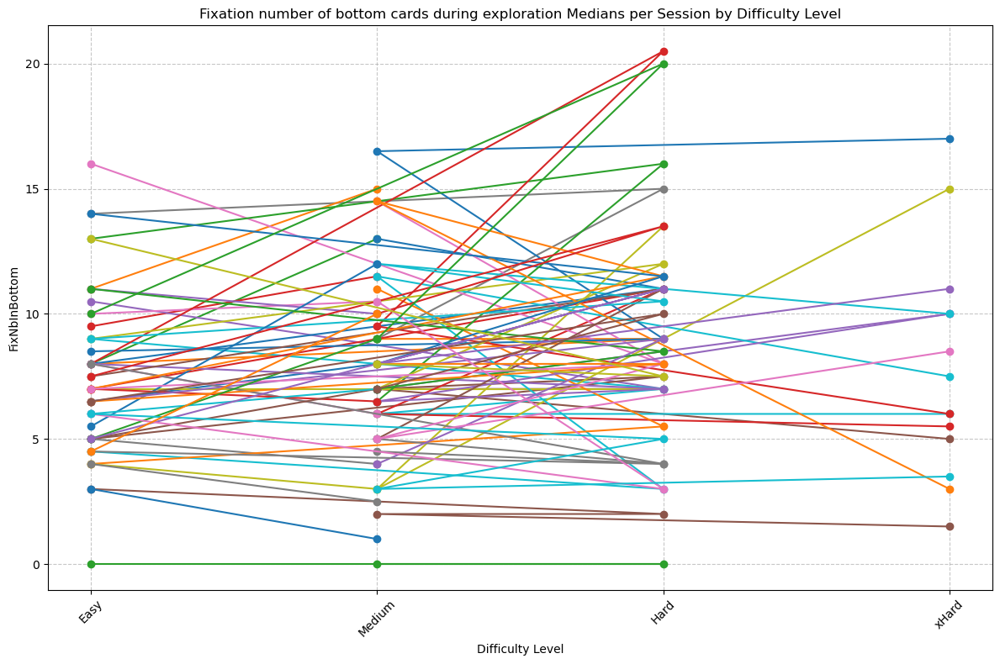

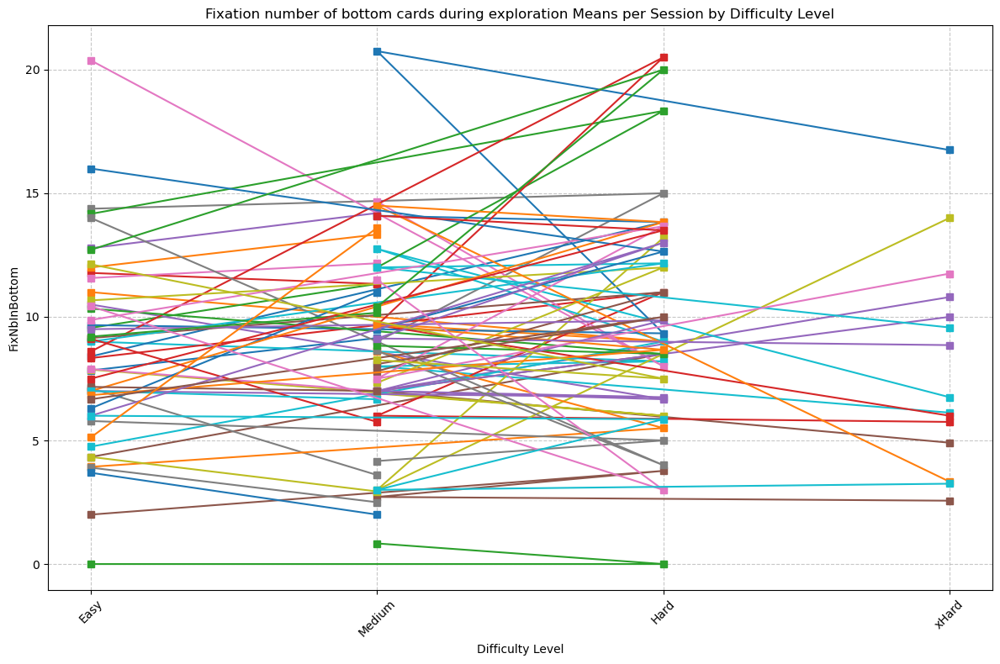

In [24]:
# Fix Number of bottom cards (exploration period) vs. difficulty level per session

#Medians
session_fix_nb_exploration = exploration_data.groupby(['session', 'difficulty'])['FixNbInBottom'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_fix_nb_exploration.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_fixnbBottom_session = session_fix_nb_exploration.loc[session][available_difficulty_levels]
        plt.plot(median_fixnbBottom_session.index, median_fixnbBottom_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Fixation number of bottom cards during exploration Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('FixNbInBottom')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_fix_nb_exploration_mean = exploration_data.groupby(['session', 'difficulty'])['FixNbInBottom'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_fix_nb_exploration_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_fixnbBottom_session = session_fix_nb_exploration_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_fixnbBottom_session.index, mean_fixnbBottom_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Fixation number of bottom cards during exploration Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('FixNbInBottom')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

## Number of fixations of bottom cards (both periods) vs. Difficulty level

Shapiro-Wilk test for Easy: p-value = 5.671099770400566e-19
Shapiro-Wilk test for Hard: p-value = 5.246578566441293e-09
Shapiro-Wilk test for Medium: p-value = 2.883541532374853e-16
Shapiro-Wilk test for xHard: p-value = 4.233474278771004e-06
Levene's test for homogeneity of variances: p-value = 0.18016397583693677
Kruskal-Wallis test:
H-statistic: 8.431382627011718
p-value: 0.03788893366066824
Mean FixNb of bottom cards by Difficulty Level:
difficulty
Easy       9.964758
Medium    10.103125
Hard      11.306748
xHard      8.655914
Name: FixNbInBottom, dtype: float64
SEM FixNb of bottom cards by Difficulty Level:
difficulty
Easy      0.315668
Medium    0.410668
Hard      0.612076
xHard     0.620006
Name: FixNbInBottom, dtype: float64


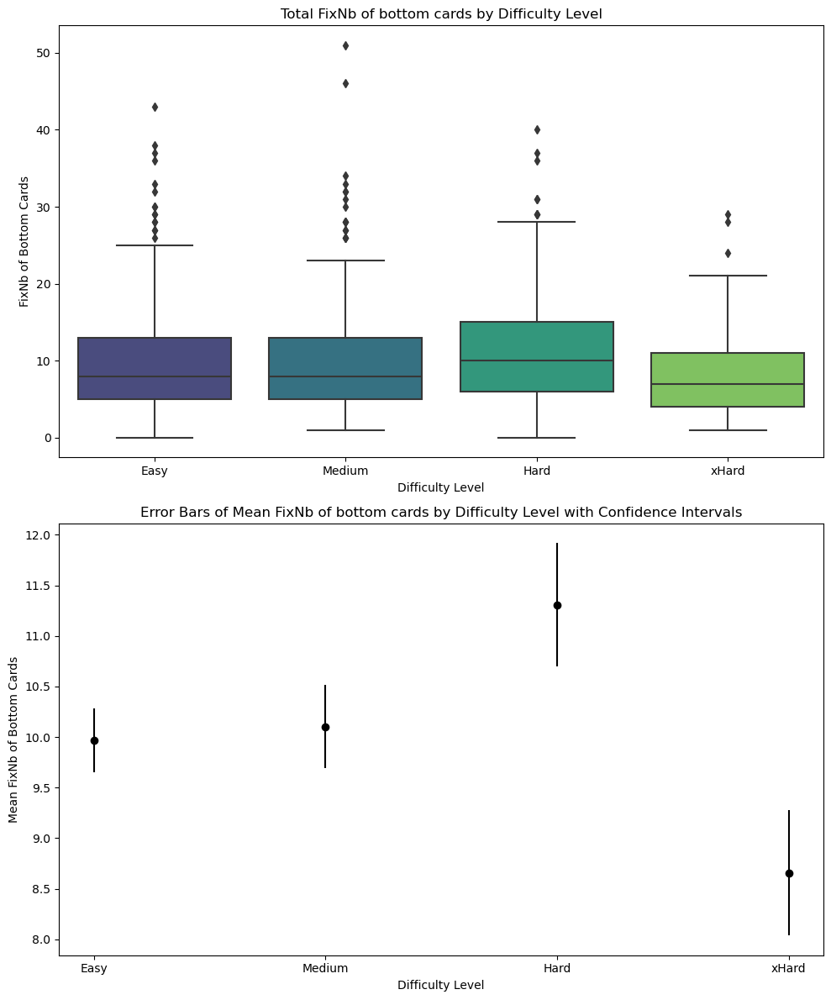

In [25]:
# Fix Number of bottom cards (both periods) vs. difficulty level

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

FixNbInBottom_total_by_difficulty = data.groupby(['session', 'trialno', 'difficulty'])['FixNbInBottom'].sum().reset_index()

# Shapiro-Wilk test for normality
for group_name, group_data in FixNbInBottom_total_by_difficulty.groupby('difficulty')['FixNbInBottom']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*[group_data['FixNbInBottom'] for group_name, group_data in FixNbInBottom_total_by_difficulty.groupby('difficulty')])
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*[group_data['FixNbInBottom'] for group_name, group_data in FixNbInBottom_total_by_difficulty.groupby('difficulty')])
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of total duration of gaze of bottom cards by difficulty level
mean_FixNbInBottom_by_difficulty = FixNbInBottom_total_by_difficulty.groupby('difficulty')['FixNbInBottom'].mean().reindex(difficulty_order)
sem_FixNbInBottom_by_difficulty = FixNbInBottom_total_by_difficulty.groupby('difficulty')['FixNbInBottom'].sem().reindex(difficulty_order)
print("Mean FixNb of bottom cards by Difficulty Level:")
print(mean_FixNbInBottom_by_difficulty)
print("SEM FixNb of bottom cards by Difficulty Level:")
print(sem_FixNbInBottom_by_difficulty)

#Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='difficulty', y='FixNbInBottom', data=FixNbInBottom_total_by_difficulty, order=difficulty_order, palette='viridis', ax=ax1)
ax1.set_xlabel('Difficulty Level')
ax1.set_ylabel('FixNb of Bottom Cards')
ax1.set_title('Total FixNb of bottom cards by Difficulty Level')

ax2.errorbar(np.arange(len(mean_FixNbInBottom_by_difficulty)), mean_FixNbInBottom_by_difficulty, yerr=sem_FixNbInBottom_by_difficulty, fmt='o', color='black')
ax2.set_xlabel('Difficulty Level')
ax2.set_ylabel('Mean FixNb of Bottom Cards')
ax2.set_title('Error Bars of Mean FixNb of bottom cards by Difficulty Level with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_FixNbInBottom_by_difficulty)))
ax2.set_xticklabels(mean_FixNbInBottom_by_difficulty.index)

plt.tight_layout()
plt.show()

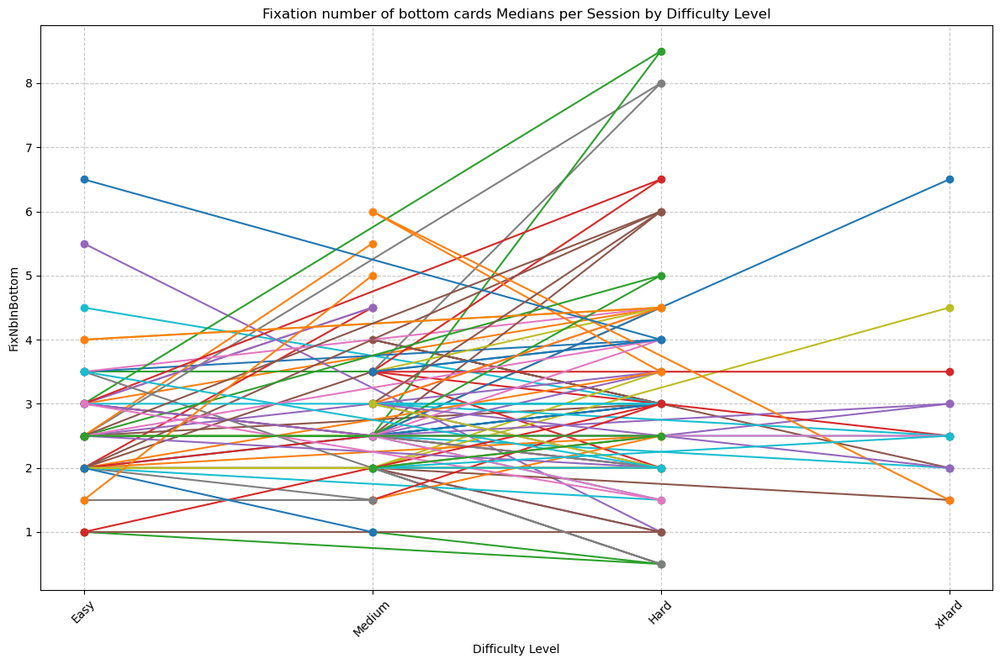

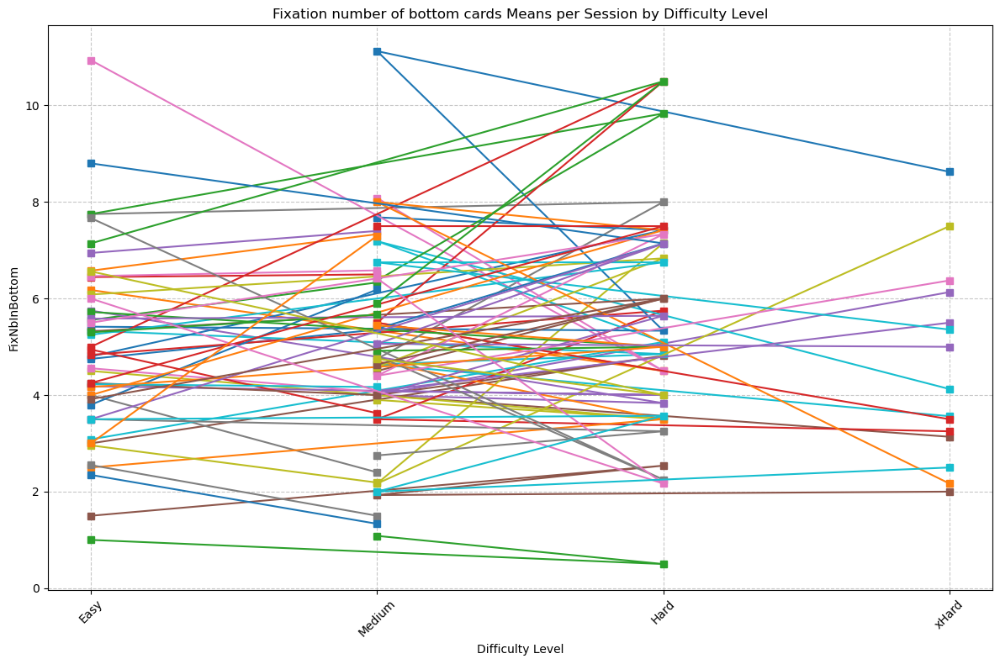

In [26]:
# Fix Number of bottom cards (both periods) vs. difficulty level per session

#Medians
session_fix_nb = data.groupby(['session', 'difficulty'])['FixNbInBottom'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_fix_nb.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_fixnbBottom_session = session_fix_nb.loc[session][available_difficulty_levels]
        plt.plot(median_fixnbBottom_session.index, median_fixnbBottom_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Fixation number of bottom cards Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('FixNbInBottom')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_fix_nb_mean = data.groupby(['session', 'difficulty'])['FixNbInBottom'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_fix_nb_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_fixnbBottom_session = session_fix_nb_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_fixnbBottom_session.index, mean_fixnbBottom_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Fixation number of bottom cards Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('FixNbInBottom')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

## Number of fixations (both periods) vs. Difficulty level

Shapiro-Wilk test for Easy: p-value = 8.464338519785012e-16
Shapiro-Wilk test for Hard: p-value = 1.0136970585682806e-05
Shapiro-Wilk test for Medium: p-value = 5.6125597031260845e-15
Shapiro-Wilk test for xHard: p-value = 1.4455213298317546e-05
Levene's test for homogeneity of variances: p-value = 0.17777256175481518
Kruskal-Wallis test:
H-statistic: 8.370987751827881
p-value: 0.03893557669452082
Mean Fixation Number by Difficulty Level:
difficulty
Easy      15.581498
Medium    15.612500
Hard      17.092025
xHard     14.225806
Name: FixNb, dtype: float64
SEM Fixation Number by Difficulty Level:
difficulty
Easy      0.371111
Medium    0.492458
Hard      0.679819
xHard     0.701986
Name: FixNb, dtype: float64


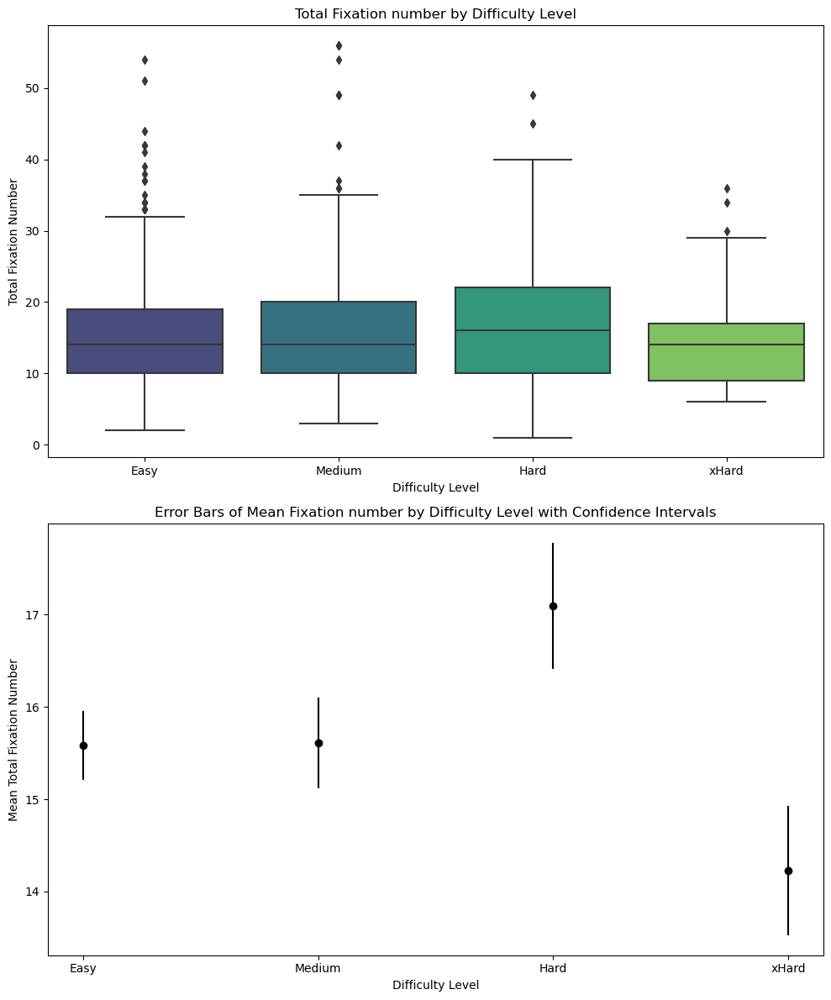

In [27]:
# Fixation  number for both periods vs. difficulty level

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

Fixnb_total_by_difficulty = data.groupby(['session', 'trialno', 'difficulty'])['FixNb'].sum().reset_index()

# Shapiro-Wilk test for normality
for group_name, group_data in Fixnb_total_by_difficulty.groupby('difficulty')['FixNb']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*[group_data['FixNb'] for group_name, group_data in Fixnb_total_by_difficulty.groupby('difficulty')])
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*[group_data['FixNb'] for group_name, group_data in Fixnb_total_by_difficulty.groupby('difficulty')])
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of total duration of gaze of bottom cards by difficulty level
mean_totalfixnb_by_difficulty = Fixnb_total_by_difficulty.groupby('difficulty')['FixNb'].mean().reindex(difficulty_order)
sem_totalfixnb_by_difficulty = Fixnb_total_by_difficulty.groupby('difficulty')['FixNb'].sem().reindex(difficulty_order)
print("Mean Fixation Number by Difficulty Level:")
print(mean_totalfixnb_by_difficulty)
print("SEM Fixation Number by Difficulty Level:")
print(sem_totalfixnb_by_difficulty)

#Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='difficulty', y='FixNb', data=Fixnb_total_by_difficulty, order=difficulty_order, palette='viridis', ax=ax1)
ax1.set_xlabel('Difficulty Level')
ax1.set_ylabel('Total Fixation Number')
ax1.set_title('Total Fixation number by Difficulty Level')

ax2.errorbar(np.arange(len(mean_totalfixnb_by_difficulty)), mean_totalfixnb_by_difficulty, yerr=sem_totalfixnb_by_difficulty, fmt='o', color='black')
ax2.set_xlabel('Difficulty Level')
ax2.set_ylabel('Mean Total Fixation Number')
ax2.set_title('Error Bars of Mean Fixation number by Difficulty Level with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_totalfixnb_by_difficulty)))
ax2.set_xticklabels(mean_totalfixnb_by_difficulty.index)

plt.tight_layout()
plt.show()

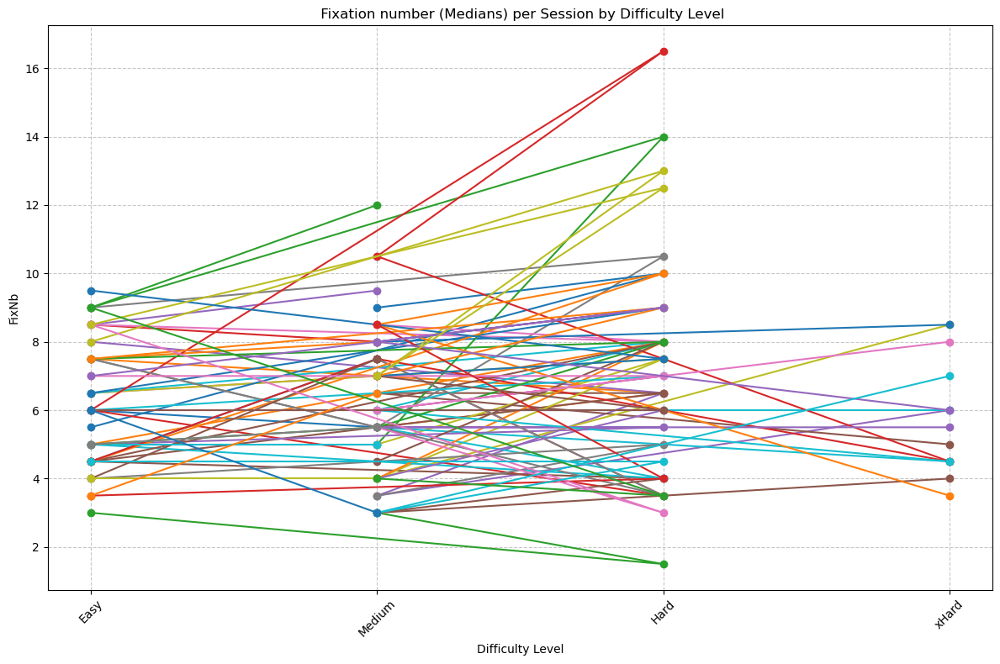

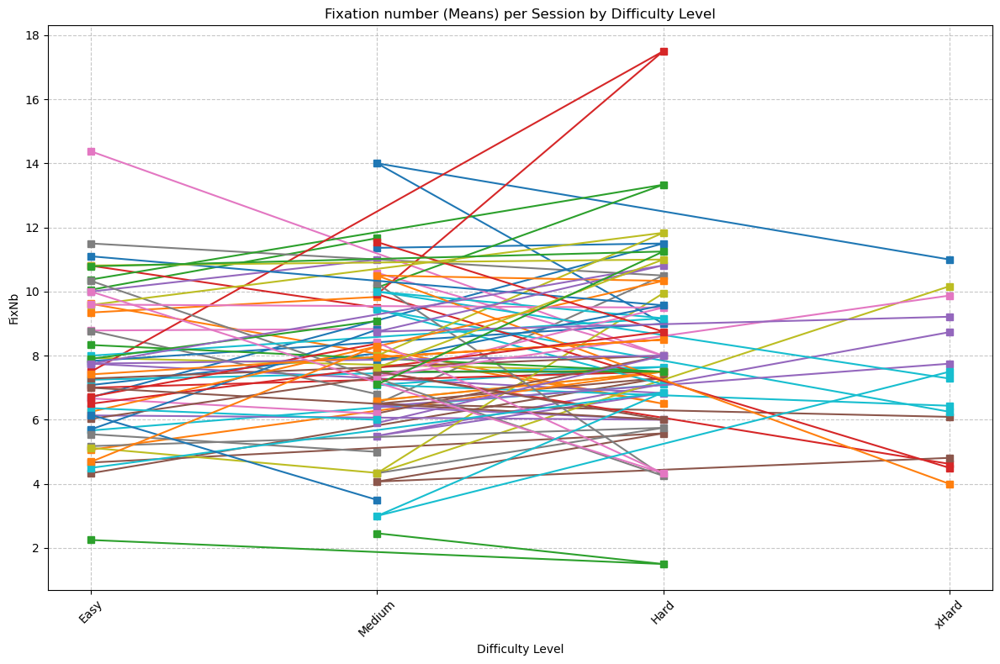

In [28]:
# Total fixation number during both periods vs. difficulty level per session

#Medians
session_fixnb = data.groupby(['session', 'difficulty'])['FixNb'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_fixnb.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_fixnb_session = session_fixnb.loc[session][available_difficulty_levels]
        plt.plot(median_fixnb_session.index, median_fixnb_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title(' Fixation number (Medians) per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('FixNb')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_fixnb_mean = data.groupby(['session', 'difficulty'])['FixNb'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_fixnb_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_fixnb_session = session_fixnb_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_fixnb_session.index, mean_fixnb_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Fixation number (Means) per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('FixNb')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

## Number of fixations of top card (decision period) vs. Difficulty level

Shapiro-Wilk test for Easy: p-value = 4.7059790515259286e-23
Shapiro-Wilk test for Hard: p-value = 7.861580275993182e-12
Shapiro-Wilk test for Medium: p-value = 3.7005114360093e-21
Shapiro-Wilk test for xHard: p-value = 2.258521615700087e-10
Levene's test for homogeneity of variances: p-value = 0.7564362237448998
Kruskal-Wallis test:
H-statistic: 1.9914753352652865
p-value: 0.5741779146084256
Mean Fixation number of Top card (decision) by Difficulty Level:
difficulty
Easy      3.792952
Hard      3.834356
Medium    3.631250
xHard     3.430108
Name: FixNbInT, dtype: float64
SEM Fixation number of Top card (decision) by Difficulty Level:
difficulty
Easy      0.158896
Hard      0.250163
Medium    0.191883
xHard     0.313853
Name: FixNbInT, dtype: float64


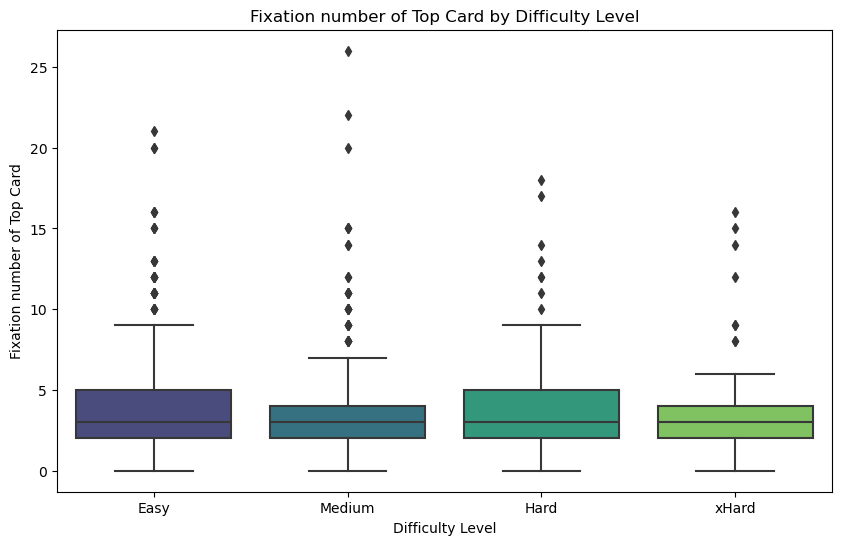

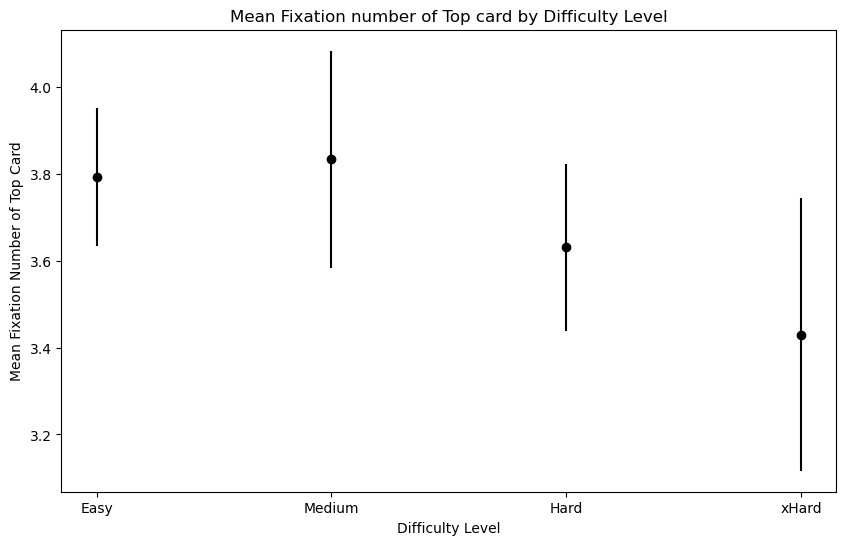

In [29]:
# Top card fixation number (decision period) vs. difficulty levels

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

FixNbInt_by_difficulty = [decision_data[decision_data['difficulty'] == level]['FixNbInT'] for level in decision_data['difficulty'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in decision_data.groupby('difficulty')['FixNbInT']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*FixNbInt_by_difficulty)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Based on this, I can't perform ANOVA test 

#Kruskal-Wallis test
H, p = kruskal(*FixNbInt_by_difficulty)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of fixation number of top card by difficulty level
mean_FixNbInt_by_difficulty = decision_data.groupby('difficulty')['FixNbInT'].mean()
sem_FixNbInt_by_difficulty = decision_data.groupby('difficulty')['FixNbInT'].sem()

print("Mean Fixation number of Top card (decision) by Difficulty Level:")
print(mean_FixNbInt_by_difficulty)
print("SEM Fixation number of Top card (decision) by Difficulty Level:")
print(sem_FixNbInt_by_difficulty)

# Plots
plt.figure(figsize=(10, 6))
sns.boxplot(x='difficulty', y='FixNbInT', data=decision_data, order=difficulty_order, palette='viridis')
plt.xlabel('Difficulty Level')
plt.ylabel('Fixation number of Top Card')
plt.title('Fixation number of Top Card by Difficulty Level')
plt.show()

plt.figure(figsize=(10, 6))
x_gaze_positions = np.arange(len(mean_FixNbInt_by_difficulty))
plt.errorbar(x_gaze_positions, mean_FixNbInt_by_difficulty, yerr=sem_FixNbInt_by_difficulty, color='black', fmt='o')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Fixation Number of Top Card')
plt.title('Mean Fixation number of Top card by Difficulty Level')
plt.xticks(x_gaze_positions, difficulty_order)
plt.show()

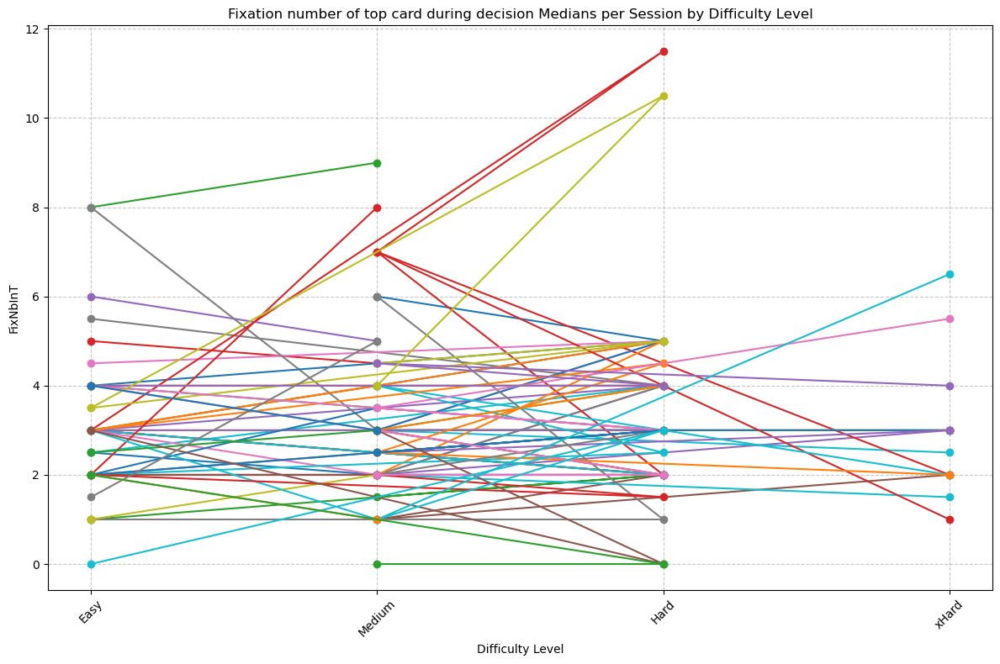

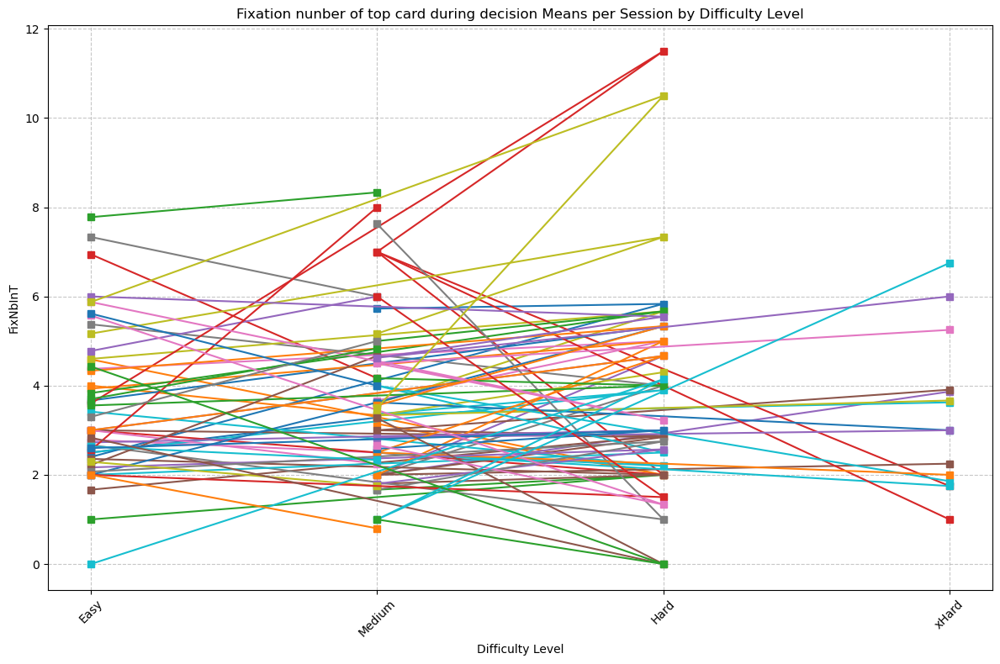

In [30]:
# Fixation number of top card (decision period) vs. difficulty levels per session

#Medians
session_FixNbInT_decision = decision_data.groupby(['session', 'difficulty'])['FixNbInT'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_FixNbInT_decision.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_FixNbInT_session = session_FixNbInT_decision.loc[session][available_difficulty_levels]
        plt.plot(median_FixNbInT_session.index,median_FixNbInT_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Fixation number of top card during decision Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('FixNbInT')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_FixNbInT_decision_mean = decision_data.groupby(['session', 'difficulty'])['FixNbInT'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_FixNbInT_decision_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_FixNbInT_session = session_FixNbInT_decision_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_FixNbInT_session.index, mean_FixNbInT_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Fixation nunber of top card during decision Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('FixNbInT')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

## Number of fixations in exploration and decision periods vs. Difficulty Level

Shapiro-Wilk test for Easy: p-value = 2.500588925689916e-19
Shapiro-Wilk test for Hard: p-value = 8.923506040484495e-09
Shapiro-Wilk test for Medium: p-value = 2.673131478063995e-16
Shapiro-Wilk test for xHard: p-value = 1.9134579352484543e-07
Levene's test for homogeneity of variances: p-value = 0.18753888619140205
Kruskal-Wallis test:
H-statistic: 9.208493994087329
p-value: 0.02664351691532505
Shapiro-Wilk test for Easy: p-value = 1.0361206190378001e-22
Shapiro-Wilk test for Hard: p-value = 1.357789333929136e-10
Shapiro-Wilk test for Medium: p-value = 1.4846435376590337e-19
Shapiro-Wilk test for xHard: p-value = 1.060864169103688e-09
Levene's test for homogeneity of variances: p-value = 0.8367121175513262
Kruskal-Wallis test:
H-statistic: 2.1373375714193923
p-value: 0.5443961271075408
Exploration Fixation Number
Means: 
difficulty
Easy      10.374449
Hard      11.865031
Medium    10.643750
xHard      9.376344
Name: FixNb, dtype: float64
Standard Errors of the Mean: 
difficulty
Easy  

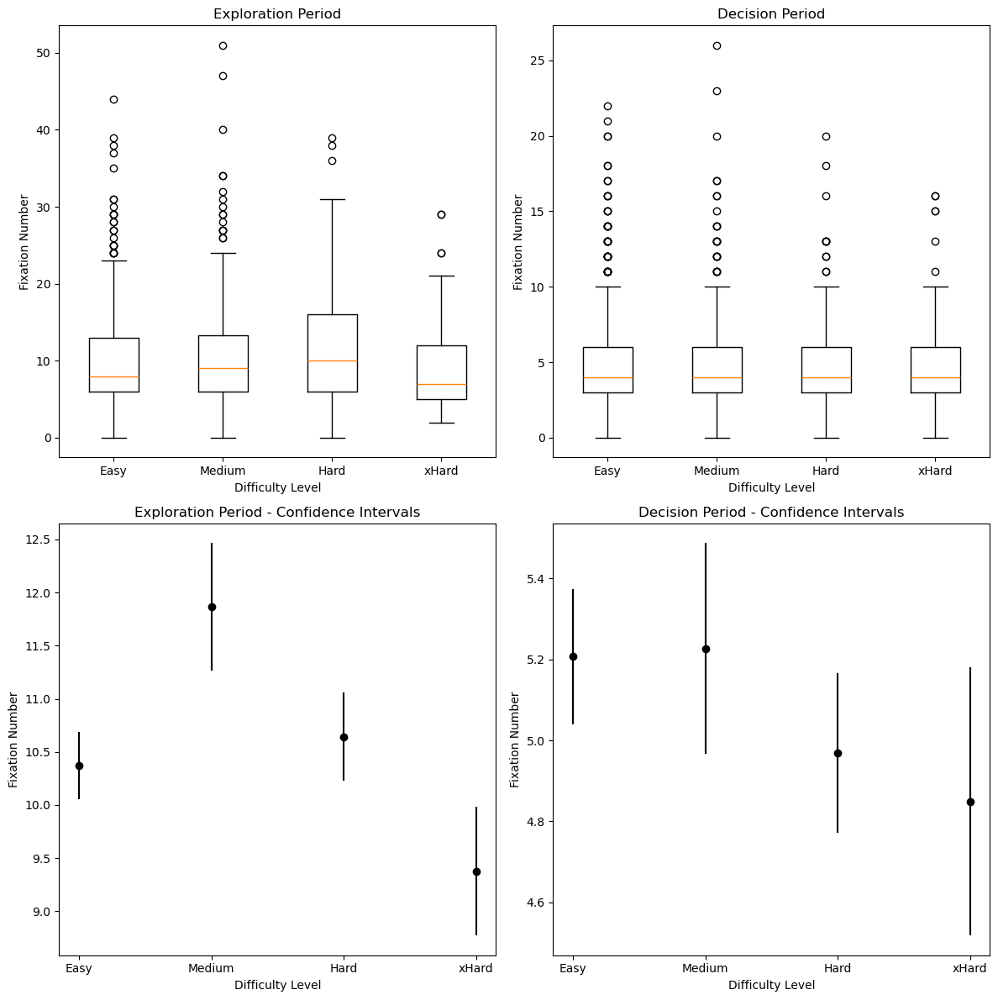

In [31]:
# Fixation number of both exploration and decision periods vs. difficulty level

exploration_fixnb = data[data['period_in_trial'] == 'exploration'].groupby('difficulty')['FixNb']
decision_fixnb = data[data['period_in_trial'] == 'decision'].groupby('difficulty')['FixNb']

# Means and standard errors of the mean for exploration and decision periods
exploration_means = exploration_fixnb.mean()
exploration_sem = exploration_fixnb.sem()
decision_means = decision_fixnb.mean()
decision_sem = decision_fixnb.sem()

# Shapiro-Wilk test for normality - Exploration period
for group_name, group_data in exploration_data.groupby('difficulty')['FixNb']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances - Exploration period
stat, p = levene(*[group_data for group_name, group_data in exploration_data.groupby('difficulty')['FixNb']])
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test - Exploration period
H, p = kruskal(*[group_data for group_name, group_data in exploration_data.groupby('difficulty')['FixNb']])
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Shapiro-Wilk test for normality - Decision period
for group_name, group_data in decision_data.groupby('difficulty')['FixNb']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances - Decision period
stat, p = levene(*[group_data for group_name, group_data in decision_data.groupby('difficulty')['FixNb']])
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test - Decision period
H, p = kruskal(*[group_data for group_name, group_data in decision_data.groupby('difficulty')['FixNb']])
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

print("Exploration Fixation Number")
print("Means: ")
print(exploration_means)
print("Standard Errors of the Mean: ")
print(exploration_sem)
print("\nDecision Fixation Number")
print("Means: ")
print(decision_means)
print("Standard Errors of the Mean: ")
print(decision_sem)

# Plots
difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))

# Exploration Period Boxplot
exploration_data_reordered = [exploration_fixnb.get_group(difficulty_order[i]).values for i in range(len(difficulty_order))]
axs[0, 0].boxplot(exploration_data_reordered, positions=np.arange(len(difficulty_order)))
axs[0, 0].set_title('Exploration Period')
axs[0, 0].set_xlabel('Difficulty Level')
axs[0, 0].set_ylabel('Fixation Number')
axs[0, 0].set_xticks(np.arange(len(difficulty_order)))
axs[0, 0].set_xticklabels(difficulty_order)

# Decision Period Boxplot
decision_data_reordered = [decision_fixnb.get_group(difficulty_order[i]).values for i in range(len(difficulty_order))]
axs[0, 1].boxplot(decision_data_reordered, positions=np.arange(len(difficulty_order)))
axs[0, 1].set_title('Decision Period')
axs[0, 1].set_xlabel('Difficulty Level')
axs[0, 1].set_ylabel('Fixation Number')
axs[0, 1].set_xticks(np.arange(len(difficulty_order)))
axs[0, 1].set_xticklabels(difficulty_order)

# Exploration Period Error Bars
axs[1, 0].errorbar(np.arange(len(difficulty_order)), exploration_means, yerr=exploration_sem, fmt='o', color='black')
axs[1, 0].set_title('Exploration Period - Confidence Intervals')
axs[1, 0].set_xlabel('Difficulty Level')
axs[1, 0].set_ylabel('Fixation Number')
axs[1, 0].set_xticks(np.arange(len(difficulty_order)))
axs[1, 0].set_xticklabels(difficulty_order)

# Decision Period Error Bars
axs[1, 1].errorbar(np.arange(len(difficulty_order)), decision_means, yerr=decision_sem, fmt='o', color='black')
axs[1, 1].set_title('Decision Period - Confidence Intervals')
axs[1, 1].set_xlabel('Difficulty Level')
axs[1, 1].set_ylabel('Fixation Number')
axs[1, 1].set_xticks(np.arange(len(difficulty_order)))
axs[1, 1].set_xticklabels(difficulty_order)

plt.tight_layout()
plt.show()

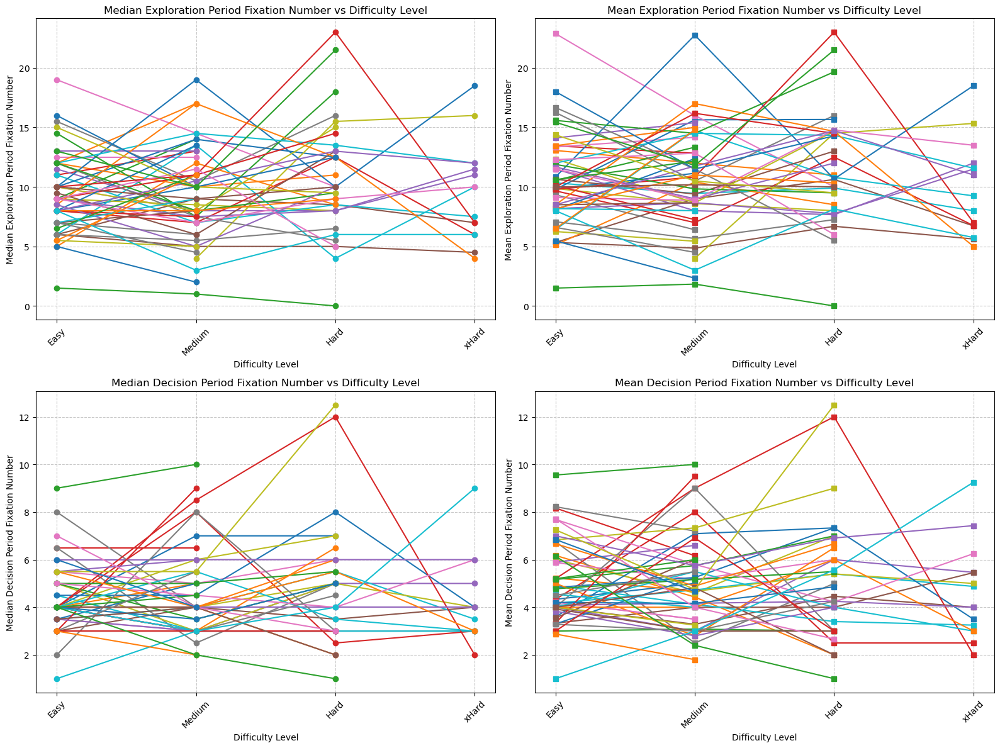

In [32]:
# Fixation number of both exploration and decision periods vs. difficulty level per session

exploration_FixNb = data[data['period_in_trial'] == 'exploration'].groupby(['session', 'difficulty'])['FixNb'].median().unstack()
decision_FixNb = data[data['period_in_trial'] == 'decision'].groupby(['session', 'difficulty'])['FixNb'].median().unstack()

exploration_mean_FixNb = data[data['period_in_trial'] == 'exploration'].groupby(['session', 'difficulty'])['FixNb'].mean().unstack()
decision_mean_FixNb = data[data['period_in_trial'] == 'decision'].groupby(['session', 'difficulty'])['FixNb'].mean().unstack()

plt.figure(figsize=(16, 12))

# Median fixation number for exploration period per session
plt.subplot(2, 2, 1)
for session in exploration_FixNb.index.get_level_values('session').unique():
    available_difficulty_levels = exploration_FixNb.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        duration_session_exploration = exploration_FixNb.loc[session][difficulty_order]
        plt.plot(duration_session_exploration.index, duration_session_exploration, marker='o', linestyle='-', label=f'Session {session}')
plt.title('Median Exploration Period Fixation Number vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Median Exploration Period Fixation Number')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()

# Mean Fixation Number for exploration period per session
plt.subplot(2, 2, 2)
for session in exploration_mean_FixNb.index.get_level_values('session').unique():
    available_difficulty_levels = exploration_mean_FixNb.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        duration_session_exploration = exploration_mean_FixNb.loc[session][difficulty_order]
        plt.plot(duration_session_exploration.index, duration_session_exploration, marker='s', linestyle='-', label=f'Session {session}')
plt.title('Mean Exploration Period Fixation Number vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Exploration Period Fixation Number')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()

# Median Fixation Number for decision period per session
plt.subplot(2, 2, 3)
for session in decision_FixNb.index.get_level_values('session').unique():
    available_difficulty_levels = decision_FixNb.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        duration_session_decision = decision_FixNb.loc[session][difficulty_order]
        plt.plot(duration_session_decision.index, duration_session_decision, marker='o', linestyle='-', label=f'Session {session}')
plt.title('Median Decision Period Fixation Number vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Median Decision Period Fixation Number')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()

# Mean Fixation Number for decision period per session
plt.subplot(2, 2, 4)
for session in decision_mean_FixNb.index.get_level_values('session').unique():
    available_difficulty_levels = decision_mean_FixNb.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        duration_session_decision = decision_mean_FixNb.loc[session][difficulty_order]
        plt.plot(duration_session_decision.index, duration_session_decision, marker='s', linestyle='-', label=f'Session {session}')
plt.title('Mean Decision Period Fixation Number vs Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Decision Period Fixation Number')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()

plt.tight_layout()
plt.show()

## Fixation Duration of Top Card (Decision Period) vs. Difficulty Level

Shapiro-Wilk test for Easy: p-value = 2.6090504692147061e-23
Shapiro-Wilk test for Hard: p-value = 4.2755695421181193e-11
Shapiro-Wilk test for Medium: p-value = 5.300051585912577e-19
Shapiro-Wilk test for xHard: p-value = 7.675484493652583e-10
Levene's test for homogeneity of variances: p-value = 0.7453991101290953
Kruskal-Wallis test:
H-statistic: 3.29251816368831
p-value: 0.3486853353101833
Mean FixTotDurInT (decision) by Difficulty Level:
difficulty
Easy      1360.189427
Hard      1431.926380
Medium    1273.500000
xHard     1282.709677
Name: FixTotDurInT, dtype: float64
SEM FixTotDurInT (decision) by Difficulty Level:
difficulty
Easy       61.427834
Hard       97.393180
Medium     67.000125
xHard     124.137652
Name: FixTotDurInT, dtype: float64


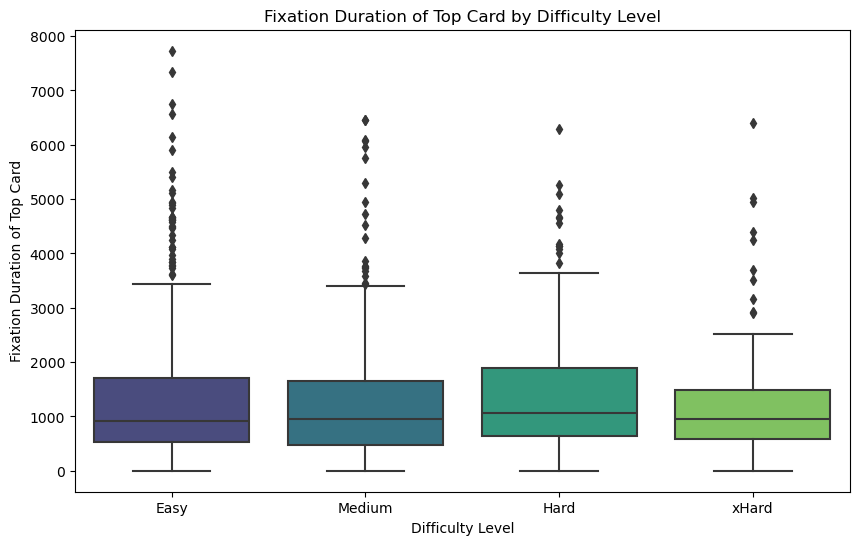

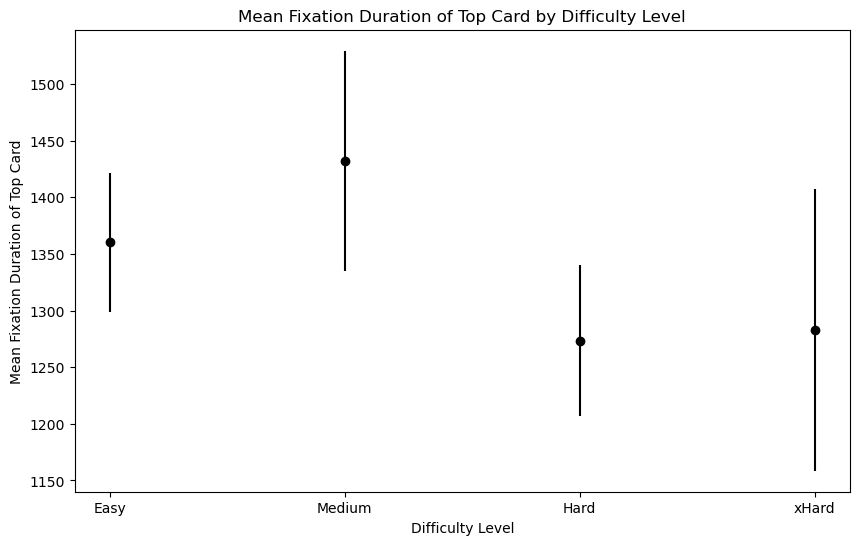

In [33]:
# Fixation duration of top card (decision period) vs. difficulty levels

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

FixTotDurInT_by_difficulty = [decision_data[decision_data['difficulty'] == level]['FixTotDurInT'] for level in decision_data['difficulty'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in decision_data.groupby('difficulty')['FixTotDurInT']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*FixTotDurInT_by_difficulty)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Based on this, I can't perform ANOVA test 

#Kruskal-Wallis test
H, p = kruskal(*FixTotDurInT_by_difficulty)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of fixation duration of decision of top card by difficulty level
mean_FixTotDurInT_by_difficulty = decision_data.groupby('difficulty')['FixTotDurInT'].mean()
sem_FixTotDurInT_by_difficulty = decision_data.groupby('difficulty')['FixTotDurInT'].sem()

print("Mean FixTotDurInT (decision) by Difficulty Level:")
print(mean_FixTotDurInT_by_difficulty)
print("SEM FixTotDurInT (decision) by Difficulty Level:")
print(sem_FixTotDurInT_by_difficulty)

# Plots
plt.figure(figsize=(10, 6))
sns.boxplot(x='difficulty', y='FixTotDurInT', data=decision_data, order=difficulty_order, palette='viridis')
plt.xlabel('Difficulty Level')
plt.ylabel('Fixation Duration of Top Card')
plt.title('Fixation Duration of Top Card by Difficulty Level')
plt.show()

plt.figure(figsize=(10, 6))
x_gaze_positions = np.arange(len(mean_FixTotDurInT_by_difficulty))
plt.errorbar(x_gaze_positions, mean_FixTotDurInT_by_difficulty, yerr=sem_FixTotDurInT_by_difficulty, color='black', fmt='o')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Fixation Duration of Top Card')
plt.title('Mean Fixation Duration of Top Card by Difficulty Level')
plt.xticks(x_gaze_positions, difficulty_order)
plt.show()

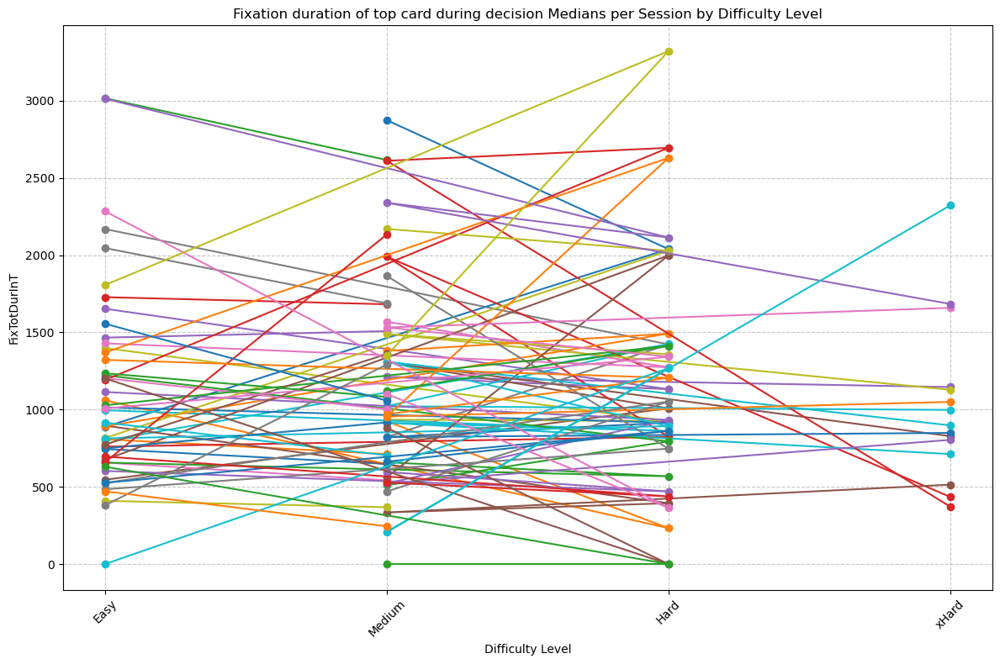

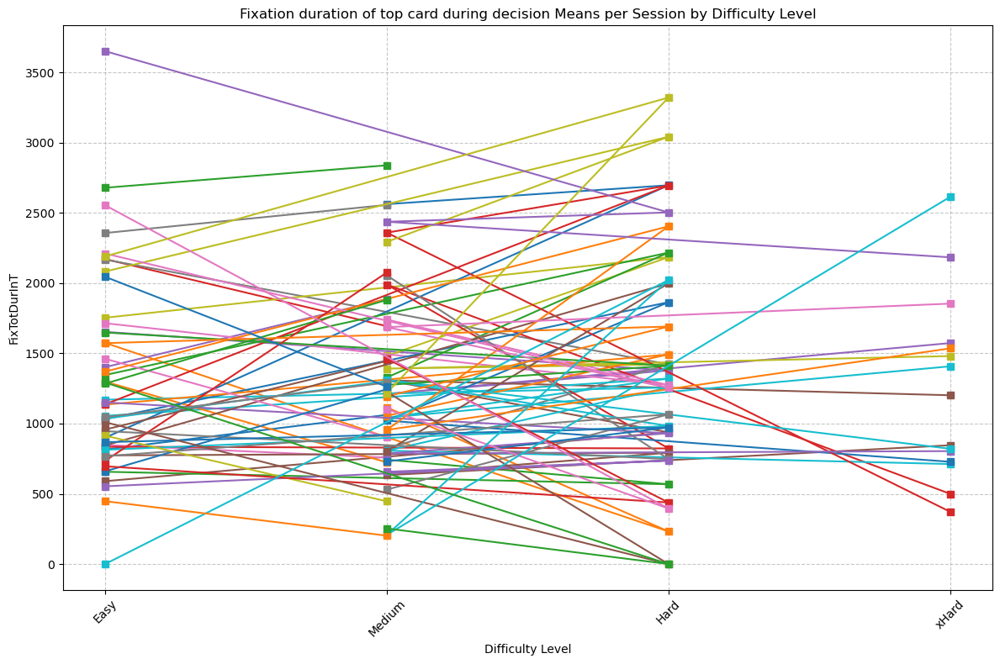

In [34]:
# Fixation duration of top card (decision period) vs. difficulty levels per session

#Medians
session_FixTotDurInT_decision = decision_data.groupby(['session', 'difficulty'])['FixTotDurInT'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_FixTotDurInT_decision.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_FixTotDurInT_session = session_FixTotDurInT_decision.loc[session][available_difficulty_levels]
        plt.plot(median_FixTotDurInT_session.index,median_FixTotDurInT_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Fixation duration of top card during decision Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('FixTotDurInT')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_FixTotDurInT_decision_mean = decision_data.groupby(['session', 'difficulty'])['FixTotDurInT'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_FixTotDurInT_decision_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_FixTotDurInT_session = session_FixTotDurInT_decision_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_FixTotDurInT_session.index, mean_FixTotDurInT_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Fixation duration of top card during decision Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('FixTotDurInT')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

## Fixation Duration of Bottom Cards (Exploration Period) vs. Difficulty Level

Shapiro-Wilk test for Easy: p-value = 6.393705535059798e-19
Shapiro-Wilk test for Hard: p-value = 2.4924376601446964e-11
Shapiro-Wilk test for Medium: p-value = 9.460139798489742e-15
Shapiro-Wilk test for xHard: p-value = 4.982938217561036e-07
Levene's test for homogeneity of variances: p-value = 0.07500738238354769
Kruskal-Wallis test:
H-statistic: 8.340848127951306
p-value: 0.03946840037489772
Mean Fixation Duration of Exploration of bottom cards by Difficulty Level:
difficulty
Easy      2955.612335
Hard      3400.699387
Medium    2916.181250
xHard     2357.870968
Name: durfixBottom, dtype: float64
SEM Fixation Duration of Exploration of bottom cards by Difficulty Level:
difficulty
Easy      111.354820
Hard      230.754390
Medium    133.181094
xHard     207.468952
Name: durfixBottom, dtype: float64


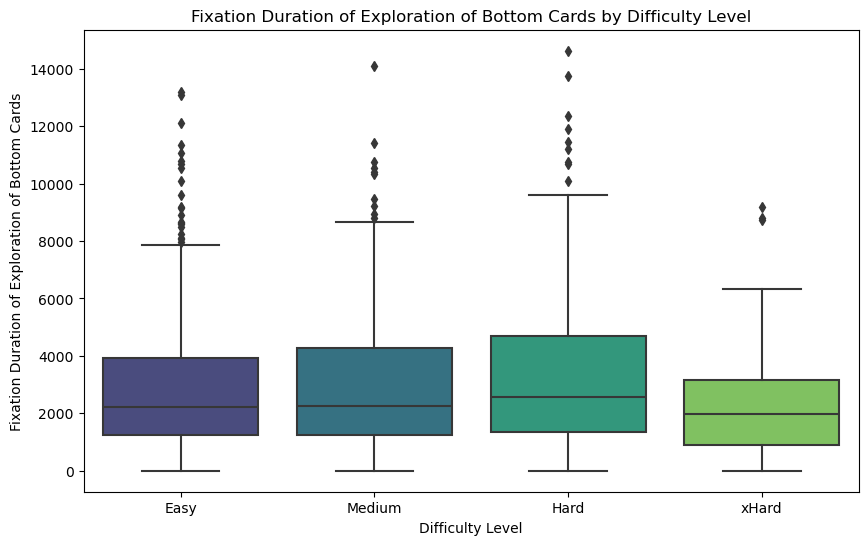

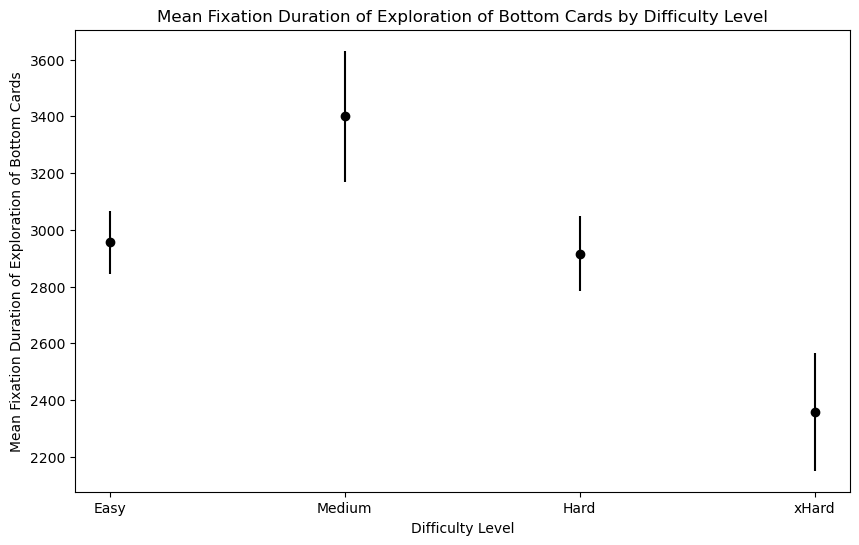

In [35]:
# durLookBottomExploration vs. difficulty
difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

durfixBottom_by_difficulty = [exploration_data[exploration_data['difficulty'] == level]['durfixBottom'] for level in exploration_data['difficulty'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in exploration_data.groupby('difficulty')['durfixBottom']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*durfixBottom_by_difficulty)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Based on this, I can't perform ANOVA test 

#Kruskal-Wallis test
H, p = kruskal(*durfixBottom_by_difficulty)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of Fixation duration of exploration of bottom cards by difficulty level
mean_fixationduration_by_difficulty = exploration_data.groupby('difficulty')['durfixBottom'].mean()
sem_fixationduration_by_difficulty = exploration_data.groupby('difficulty')['durfixBottom'].sem()

print("Mean Fixation Duration of Exploration of bottom cards by Difficulty Level:")
print(mean_fixationduration_by_difficulty)
print("SEM Fixation Duration of Exploration of bottom cards by Difficulty Level:")
print(sem_fixationduration_by_difficulty)

# Plots
plt.figure(figsize=(10, 6))
sns.boxplot(x='difficulty', y='durfixBottom', data=exploration_data, order=difficulty_order, palette='viridis')
plt.xlabel('Difficulty Level')
plt.ylabel('Fixation Duration of Exploration of Bottom Cards')
plt.title('Fixation Duration of Exploration of Bottom Cards by Difficulty Level')
plt.show()

plt.figure(figsize=(10, 6))
x_gaze_positions = np.arange(len(mean_fixationduration_by_difficulty))
plt.errorbar(x_gaze_positions, mean_fixationduration_by_difficulty, yerr=sem_fixationduration_by_difficulty, color='black', fmt='o')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean Fixation Duration of Exploration of Bottom Cards')
plt.title('Mean Fixation Duration of Exploration of Bottom Cards by Difficulty Level')
plt.xticks(x_gaze_positions, difficulty_order)
plt.show()

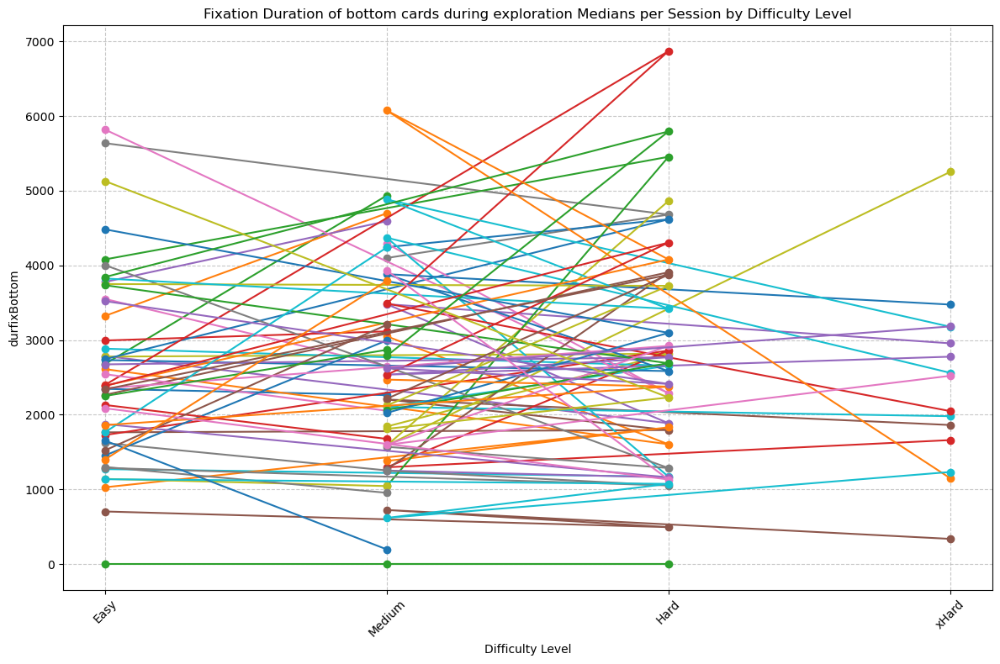

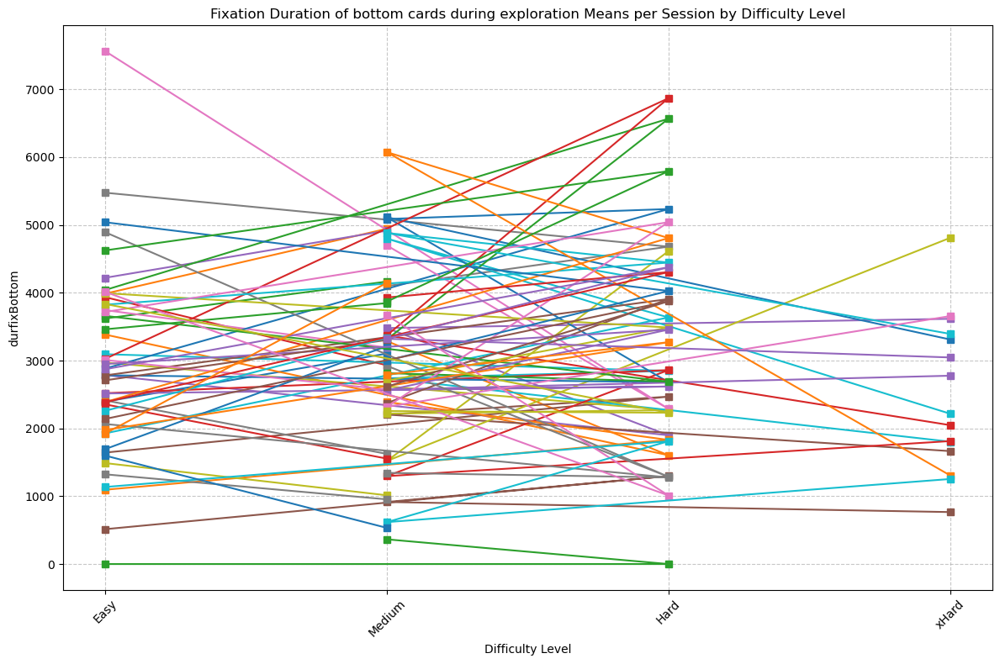

In [36]:
# durLookBottomExploration vs. difficulty per session

#Medians
session_fix_dur_exploration = exploration_data.groupby(['session', 'difficulty'])['durfixBottom'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_fix_dur_exploration.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_fixdurBottom_session = session_fix_dur_exploration.loc[session][available_difficulty_levels]
        plt.plot(median_fixdurBottom_session.index, median_fixdurBottom_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Fixation Duration of bottom cards during exploration Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('durfixBottom')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_fix_dur_exploration_mean = exploration_data.groupby(['session', 'difficulty'])['durfixBottom'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_fix_dur_exploration_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_fixdurBottom_session = session_fix_dur_exploration_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_fixdurBottom_session.index, mean_fixdurBottom_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Fixation Duration of bottom cards during exploration Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('durfixBottom')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

## Number of Switches between bottom cards (exploration period) vs. Difficulty Level

Shapiro-Wilk test for Easy: p-value = 1.3652075796705874e-20
Shapiro-Wilk test for Hard: p-value = 3.3575260997094043e-08
Shapiro-Wilk test for Medium: p-value = 1.3560817785586575e-15
Shapiro-Wilk test for xHard: p-value = 8.208907073026806e-09
Levene's test for homogeneity of variances: p-value = 0.0455813793625484
Kruskal-Wallis test:
H-statistic: 9.087467066600466
p-value: 0.028150286831524967
Mean NbSwitches during exploration by Difficulty Level:
difficulty
Easy      2.202643
Hard      2.490798
Medium    2.253125
xHard     1.989247
Name: NbSwitches, dtype: float64
SEM NbSwitches during exploration by Difficulty Level:
difficulty
Easy      0.060039
Hard      0.119127
Medium    0.078840
xHard     0.127455
Name: NbSwitches, dtype: float64


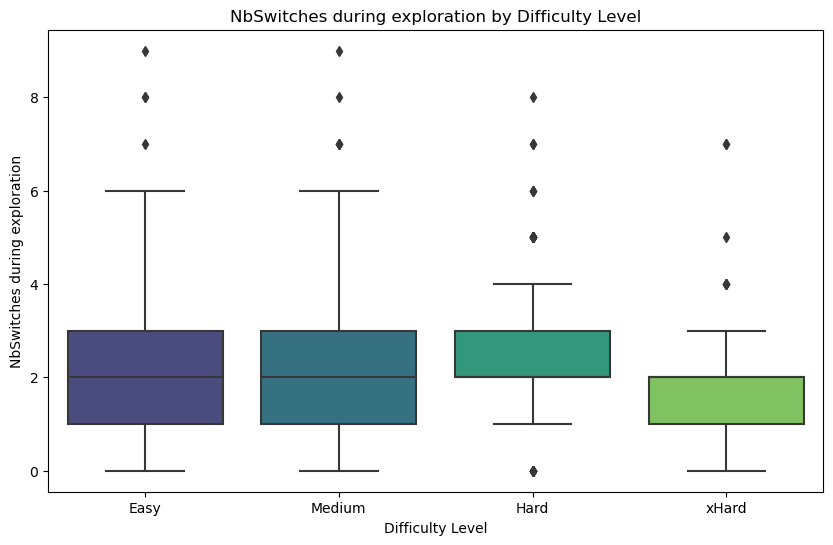

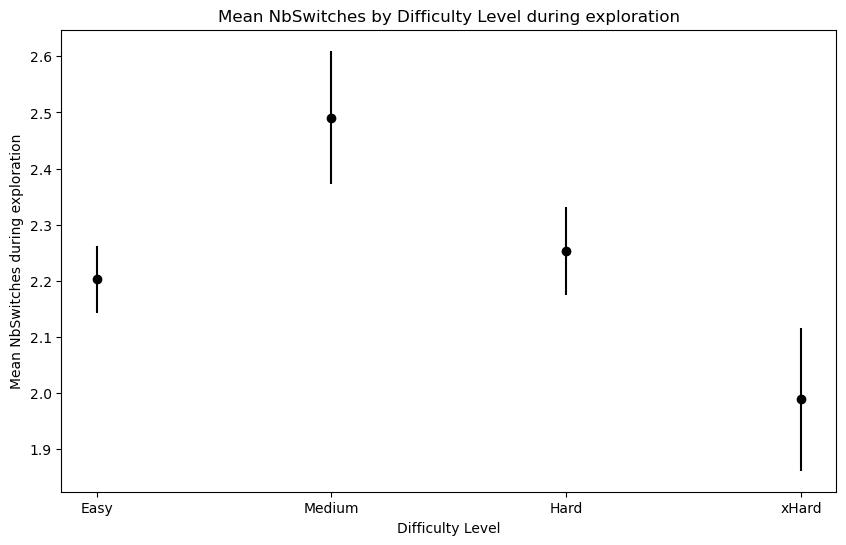

In [37]:
# Number of Switches between bottom cards (exploration) vs. difficulty level

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

NbSwitches_by_difficulty = [exploration_data[exploration_data['difficulty'] == level]['NbSwitches'] for level in exploration_data['difficulty'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in exploration_data.groupby('difficulty')['NbSwitches']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*NbSwitches_by_difficulty)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Based on this, I can't perform ANOVA test 

#Kruskal-Wallis test
H, p = kruskal(*NbSwitches_by_difficulty)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of duration of exploration of bottom cards by difficulty level
mean_NbSwitches_by_difficulty = exploration_data.groupby('difficulty')['NbSwitches'].mean()
sem_NbSwitches_by_difficulty = exploration_data.groupby('difficulty')['NbSwitches'].sem()

print("Mean NbSwitches during exploration by Difficulty Level:")
print(mean_NbSwitches_by_difficulty)
print("SEM NbSwitches during exploration by Difficulty Level:")
print(sem_NbSwitches_by_difficulty)

# Plots
plt.figure(figsize=(10, 6))
sns.boxplot(x='difficulty', y='NbSwitches', data=exploration_data, order=difficulty_order, palette='viridis')
plt.xlabel('Difficulty Level')
plt.ylabel('NbSwitches during exploration')
plt.title('NbSwitches during exploration by Difficulty Level')
plt.show()

plt.figure(figsize=(10, 6))
x_sw_positions = np.arange(len(mean_NbSwitches_by_difficulty))
plt.errorbar(x_sw_positions, mean_NbSwitches_by_difficulty, yerr=sem_NbSwitches_by_difficulty, color='black', fmt='o')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean NbSwitches during exploration')
plt.title('Mean NbSwitches by Difficulty Level during exploration')
plt.xticks(x_sw_positions, difficulty_order)
plt.show()

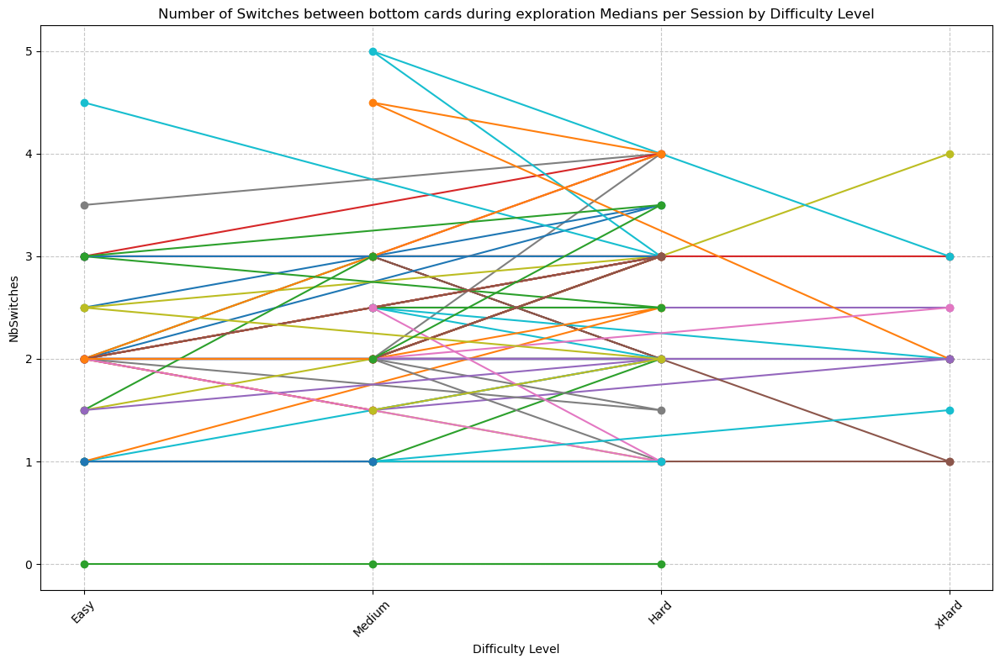

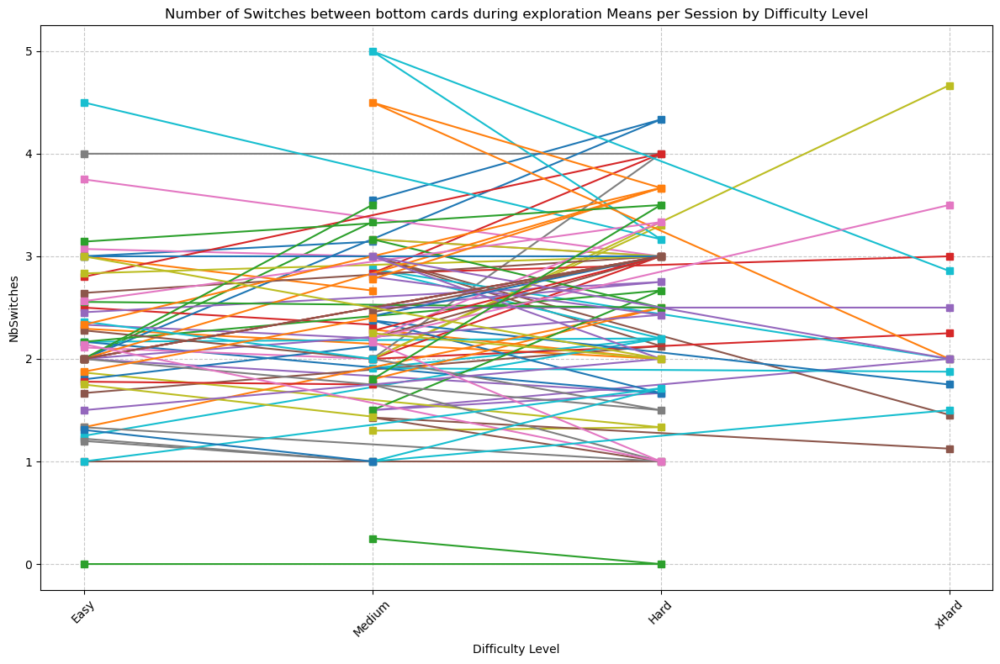

In [38]:
# Number of Switches between bottom cards (exploration) vs. difficulty level per session

#Medians
session_switches_exploration = exploration_data.groupby(['session', 'difficulty'])['NbSwitches'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_switches_exploration.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_switches_session = session_switches_exploration.loc[session][available_difficulty_levels]
        plt.plot(median_switches_session.index, median_switches_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Number of Switches between bottom cards during exploration Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('NbSwitches')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_switches_exploration_mean = exploration_data.groupby(['session', 'difficulty'])['NbSwitches'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_switches_exploration_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_switches_session = session_switches_exploration_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_switches_session.index, mean_switches_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Number of Switches between bottom cards during exploration Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('NbSwitches')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

## Total number of Switches (both periods) vs. Difficulty Level

Shapiro-Wilk test for Easy: p-value = 1.798133386075524e-29
Shapiro-Wilk test for Hard: p-value = 1.0701636790254585e-17
Shapiro-Wilk test for Medium: p-value = 8.612378706802517e-26
Shapiro-Wilk test for xHard: p-value = 6.430551670615763e-14
Levene's test for homogeneity of variances: p-value = 0.012961787568935219
Kruskal-Wallis test:
H-statistic: 2.6976872522602395
p-value: 0.4406204646998817
Mean NbSwitches by Difficulty Level:
difficulty
Easy      1.354626
Hard      1.481595
Medium    1.339063
xHard     1.220430
Name: NbSwitches, dtype: float64
SEM NbSwitches by Difficulty Level:
difficulty
Easy      0.043324
Hard      0.084549
Medium    0.055670
xHard     0.089877
Name: NbSwitches, dtype: float64


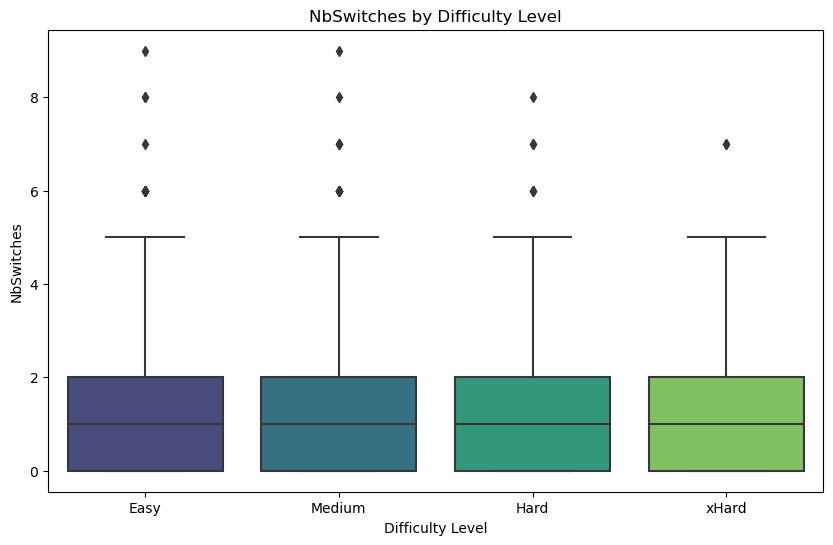

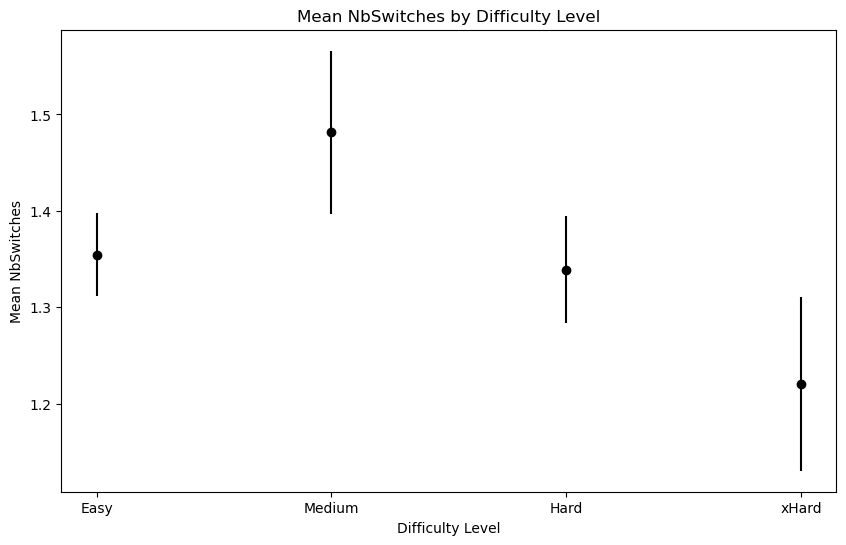

In [39]:
# Number of Switches between bottom cards (total - both periods) vs. difficulty level

difficulty_order = ['Easy', 'Medium', 'Hard', 'xHard']

NbSwitches_by_difficulty = [data[data['difficulty'] == level]['NbSwitches'] for level in data['difficulty'].unique()]

# Shapiro-Wilk test for normality
for group_name, group_data in data.groupby('difficulty')['NbSwitches']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*NbSwitches_by_difficulty)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Based on this, I can't perform ANOVA test 

#Kruskal-Wallis test
H, p = kruskal(*NbSwitches_by_difficulty)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of total switches between bottom cards by difficulty level
mean_NbSwitches_by_difficulty = data.groupby('difficulty')['NbSwitches'].mean()
sem_NbSwitches_by_difficulty = data.groupby('difficulty')['NbSwitches'].sem()

print("Mean NbSwitches by Difficulty Level:")
print(mean_NbSwitches_by_difficulty)
print("SEM NbSwitches by Difficulty Level:")
print(sem_NbSwitches_by_difficulty)

# Plots
plt.figure(figsize=(10, 6))
sns.boxplot(x='difficulty', y='NbSwitches', data=data, order=difficulty_order, palette='viridis')
plt.xlabel('Difficulty Level')
plt.ylabel('NbSwitches')
plt.title('NbSwitches by Difficulty Level')
plt.show()

plt.figure(figsize=(10, 6))
x_sw_positions = np.arange(len(mean_NbSwitches_by_difficulty))
plt.errorbar(x_sw_positions, mean_NbSwitches_by_difficulty, yerr=sem_NbSwitches_by_difficulty, color='black', fmt='o')
plt.xlabel('Difficulty Level')
plt.ylabel('Mean NbSwitches')
plt.title('Mean NbSwitches by Difficulty Level')
plt.xticks(x_sw_positions, difficulty_order)
plt.show()

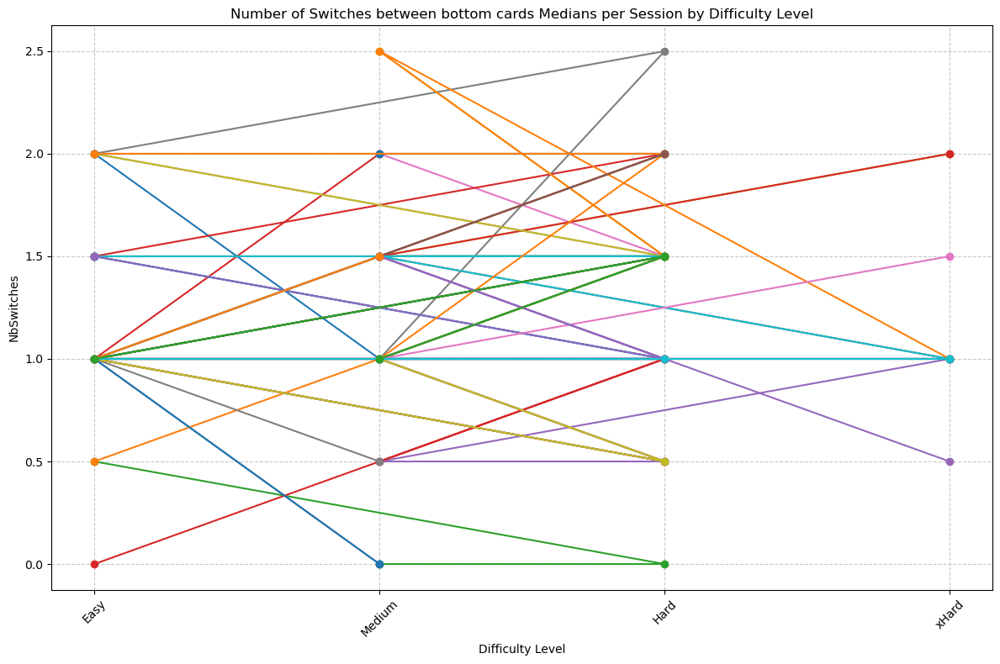

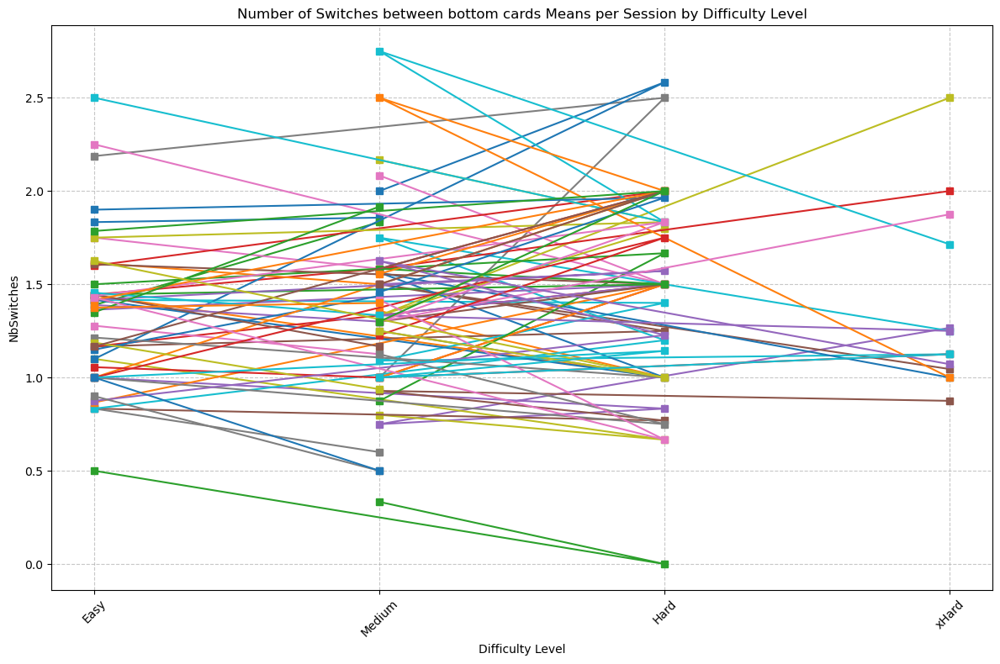

In [40]:
# Number of Switches between bottom cards (both periods) vs. difficulty level per session

#Medians
session_switches = data.groupby(['session', 'difficulty'])['NbSwitches'].median().unstack()

sessions = decision_data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_difficulty_levels = session_switches.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        median_switches_session = session_switches.loc[session][available_difficulty_levels]
        plt.plot(median_switches_session.index, median_switches_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Number of Switches between bottom cards Medians per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('NbSwitches')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
plt.tight_layout()
#plt.legend()
plt.show()

session_switches_mean = data.groupby(['session', 'difficulty'])['NbSwitches'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_difficulty_levels = session_switches_mean.loc[session].dropna().index.tolist()
    if available_difficulty_levels:
        mean_switches_session = session_switches_mean.loc[session][available_difficulty_levels]
        plt.plot(mean_switches_session.index, mean_switches_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Number of Switches between bottom cards Means per Session by Difficulty Level')
plt.xlabel('Difficulty Level')
plt.ylabel('NbSwitches')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(rotation=45)
#plt.legend()
plt.tight_layout()
plt.show()

## Side chosen

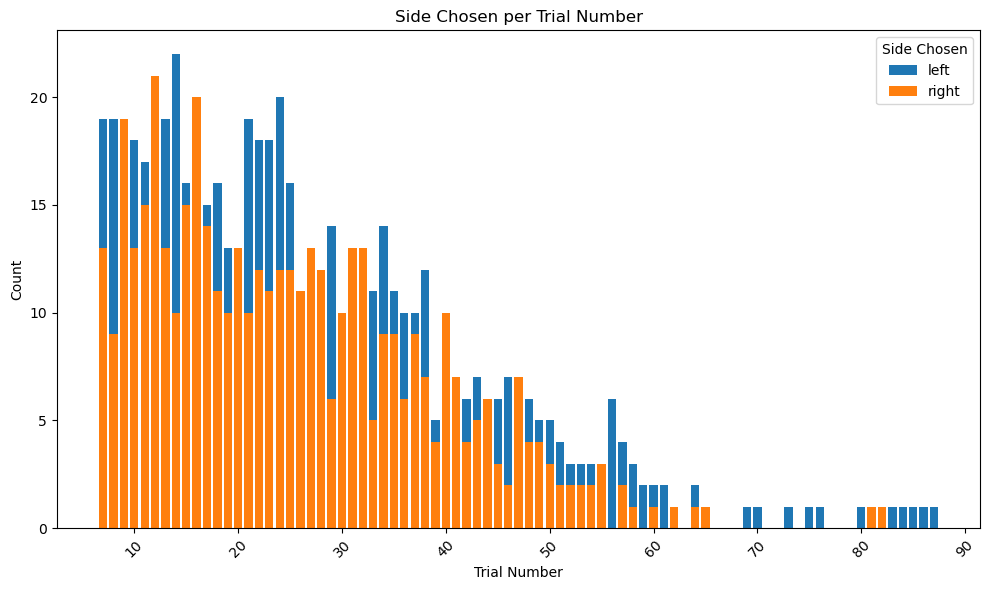

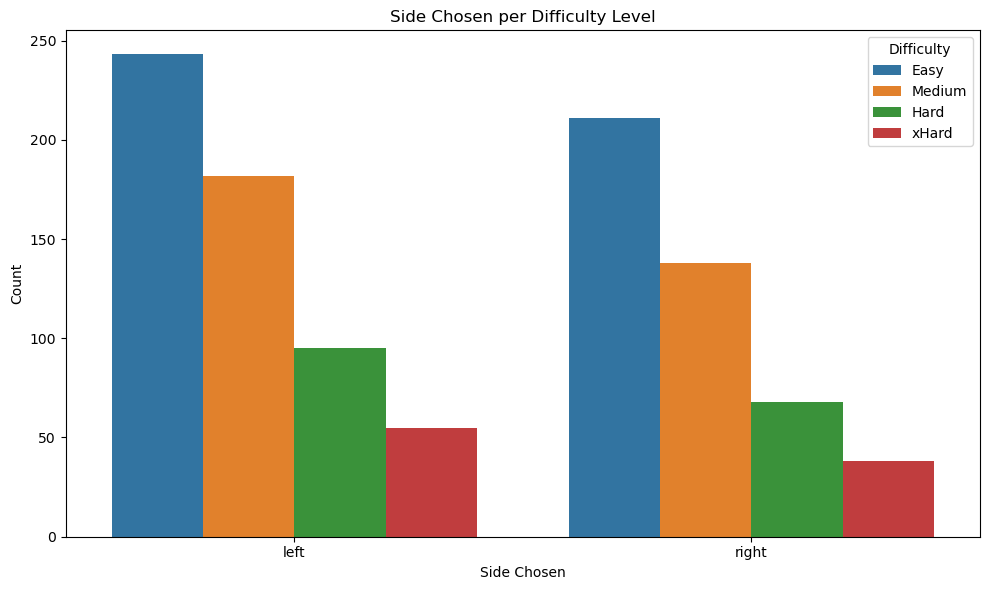

In [41]:
# Is there a tendency to choose a side?

# Plot: side chosen per trial number

agg_data = decision_data.groupby(['trialno', 'sideChosen']).size().unstack(fill_value=0).reset_index()

plt.figure(figsize=(10, 6))
for side in ['left', 'right']:
    plt.bar(agg_data['trialno'], agg_data[side], label=side)
    
plt.title('Side Chosen per Trial Number')
plt.xlabel('Trial Number')
plt.ylabel('Count')
plt.legend(title='Side Chosen', loc='upper right')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot: side chosen per difficulty level
plt.figure(figsize=(10, 6))
sns.countplot(data=decision_data, x='sideChosen', hue='difficulty')
plt.title('Side Chosen per Difficulty Level')
plt.xlabel('Side Chosen')
plt.ylabel('Count')
plt.legend(title='Difficulty')
plt.tight_layout()
plt.show()

# Distributions

## Accuracy vs. Difficulty Level

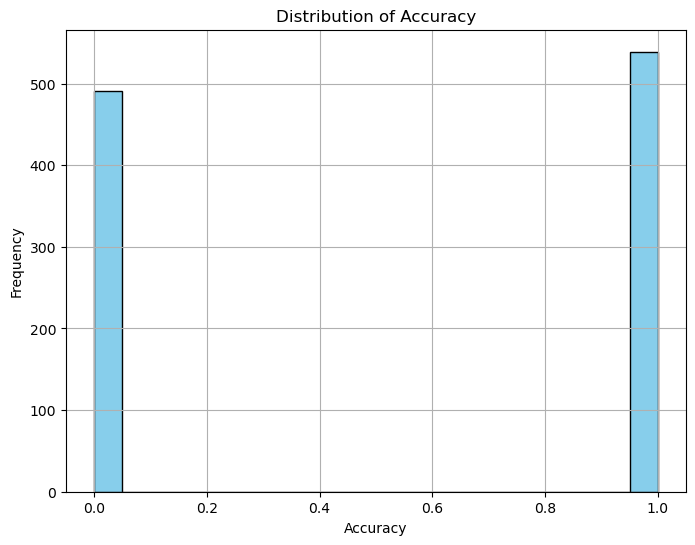

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:723: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: lognorm


In [98]:
# Distribution of Accuracy

accuracy_data = decision_data['accuracy']

plt.figure(figsize=(8, 6))
plt.hist(accuracy_data, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Accuracy')
plt.xlabel('Accuracy')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


# Check distribution
stat, p = shapiro(accuracy_data)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(accuracy_data)
    kstest_stat, _ = stats.kstest(accuracy_data, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Total trial duration vs. Difficulty Level

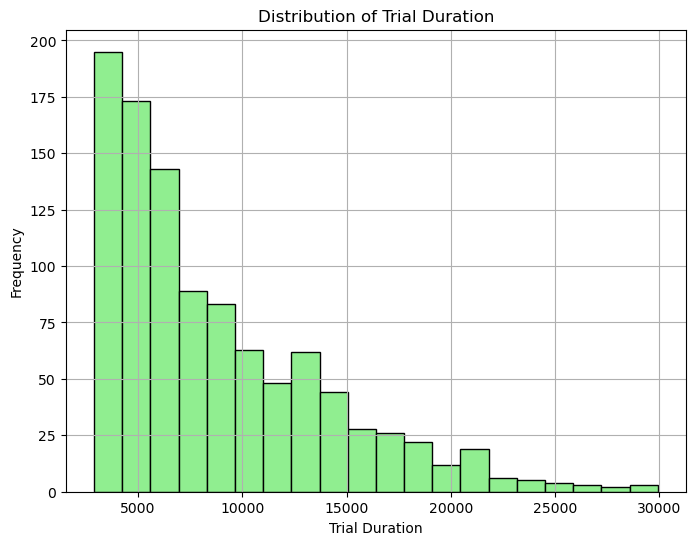

Data does not look approximately normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)


Best fit distribution: weibull_min


C:\Users\I587504\AppData\Local\Temp\ipykernel_41852\3688109884.py:32: RuntimeWarning: divide by zero encountered in log
  metric = -2 * np.log(p)


In [196]:
# Distribution of trial duration

trial_duration_data = trial_duration.groupby(['session', 'trialno'])['durPeriodTotal'].sum()

plt.figure(figsize=(8, 6))
plt.hist(trial_duration_data, bins=20, color='lightgreen', edgecolor='black')
plt.title('Distribution of Trial Duration')
plt.xlabel('Trial Duration')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Check distribution using Kruskal-Wallis test
stat, p = kruskal(*[group.values for _, group in trial_duration_data.groupby(level=0)])

alpha = 0.05
if p > alpha:
    print("Data looks like it could be approximately normally distributed (fail to reject H0)")
else:
    print("Data does not look approximately normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']

best_fit_name = None
best_fit_params = {}
best_fit_metric = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(trial_duration_data)
    _, p = stats.kstest(trial_duration_data, distribution_name, args=params)
    metric = -2 * np.log(p) 
    if metric < best_fit_metric:
        best_fit_name = distribution_name
        best_fit_params = params
        best_fit_metric = metric

print(f"Best fit distribution: {best_fit_name}")

## Duration of exploration and decision periods vs. Difficulty Level

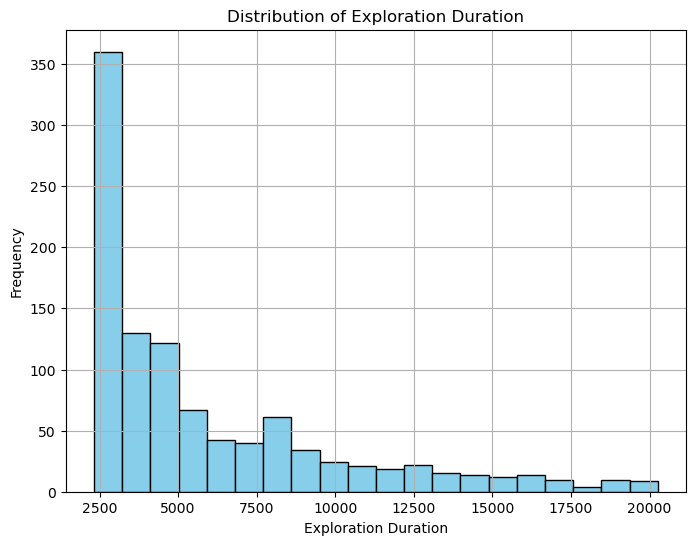

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)


Best fit distribution: beta


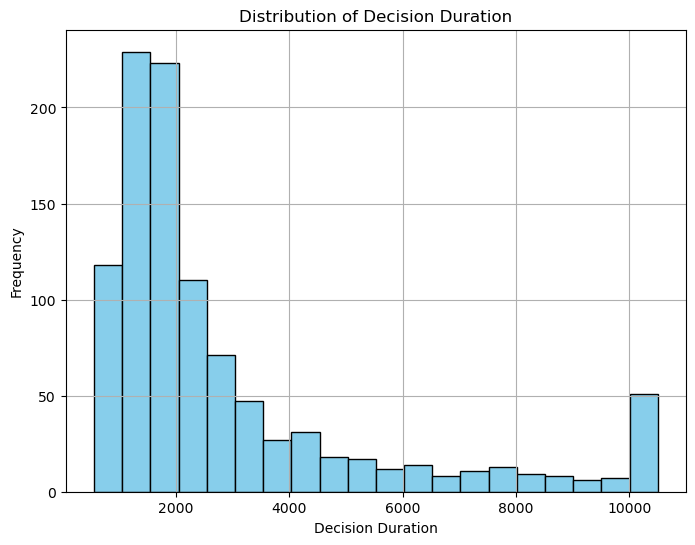

Data does not look normally distributed (reject H0)
Best fit distribution: lognorm


In [96]:
# Distribution of Exploration Duration

data_exploration = exploration_data['durPeriodTotal']

plt.figure(figsize=(8, 6))
plt.hist(data_exploration, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Exploration Duration')
plt.xlabel('Exploration Duration')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_exploration)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_exploration)
    kstest_stat, _ = stats.kstest(data_exploration, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

# Distribution of Decision Duration

data_Decision = decision_data['durPeriodTotal']

plt.figure(figsize=(8, 6))
plt.hist(data_Decision, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Decision Duration')
plt.xlabel('Decision Duration')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_Decision)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_Decision)
    kstest_stat, _ = stats.kstest(data_Decision, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Look duration of bottom images (exploration period)

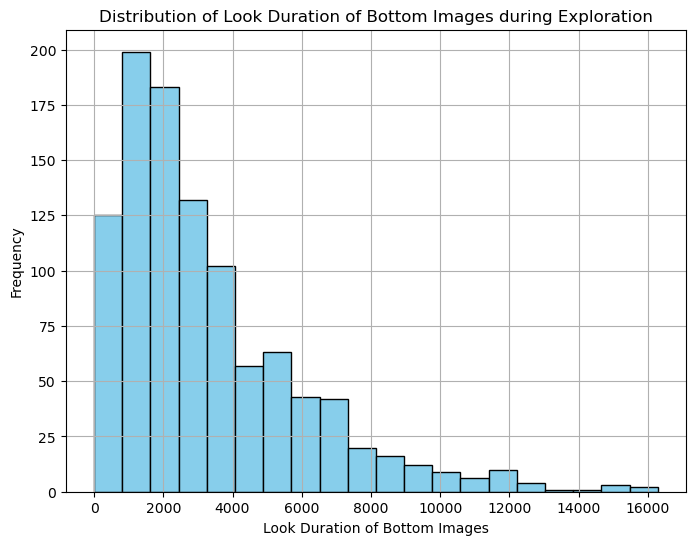

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: gamma


In [99]:
# Distribution of Look duration of bottom images during exploration period

data_look_exploration = exploration_data['durLookBottom']

plt.figure(figsize=(8, 6))
plt.hist(data_look_exploration, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Look Duration of Bottom Images during Exploration')
plt.xlabel('Look Duration of Bottom Images')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_look_exploration)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_look_exploration)
    kstest_stat, _ = stats.kstest(data_look_exploration, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Look Duration of Top card (decision period)

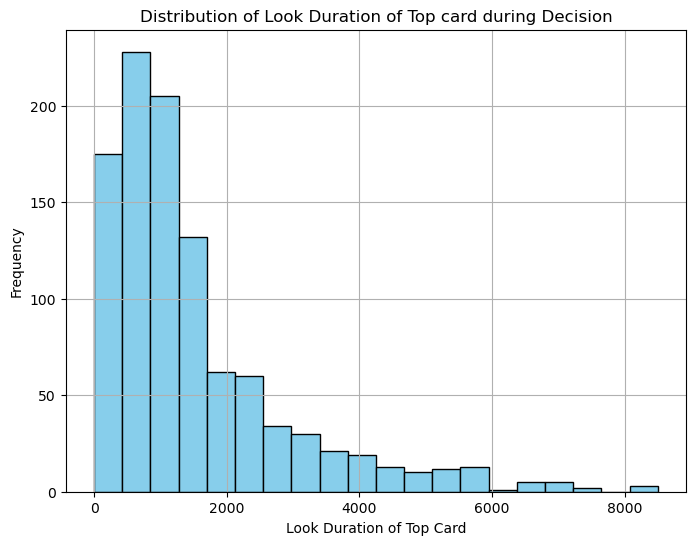

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:723: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: weibull_min


In [100]:
# Distribution of Look duration of top card during decision period

data_look_decision = decision_data['LookTotDurInT']

plt.figure(figsize=(8, 6))
plt.hist(data_look_decision, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Look Duration of Top card during Decision')
plt.xlabel('Look Duration of Top Card')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_look_decision)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_look_decision)
    kstest_stat, _ = stats.kstest(data_look_decision, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Fixation Duration of Bottom Cards (Exploration Period)

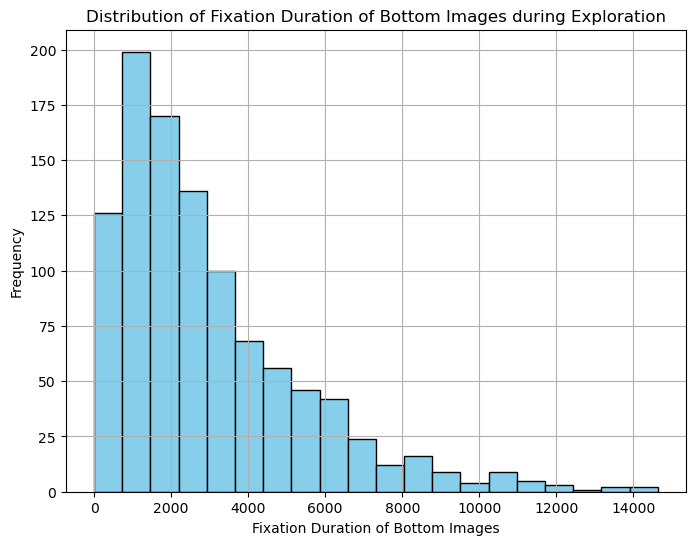

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: gamma


In [101]:
# Distribution of Fixation duration of bottom images during exploration period

data_fix_exploration = exploration_data['durfixBottom']

plt.figure(figsize=(8, 6))
plt.hist(data_fix_exploration, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Fixation Duration of Bottom Images during Exploration')
plt.xlabel('Fixation Duration of Bottom Images')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_fix_exploration)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_fix_exploration)
    kstest_stat, _ = stats.kstest(data_fix_exploration, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Fixation Duration of Top card (Decision Period)

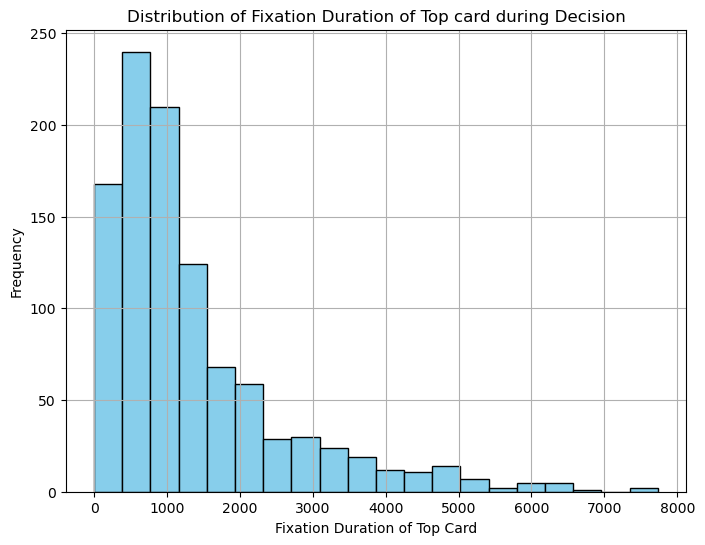

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:723: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: weibull_min


In [102]:
# Distribution of Fixation duration of top card during decision period

data_fix_decision = decision_data['FixTotDurInT']

plt.figure(figsize=(8, 6))
plt.hist(data_fix_decision, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Fixation Duration of Top card during Decision')
plt.xlabel('Fixation Duration of Top Card')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_fix_decision)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_fix_decision)
    kstest_stat, _ = stats.kstest(data_fix_decision, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Total Number of fixations

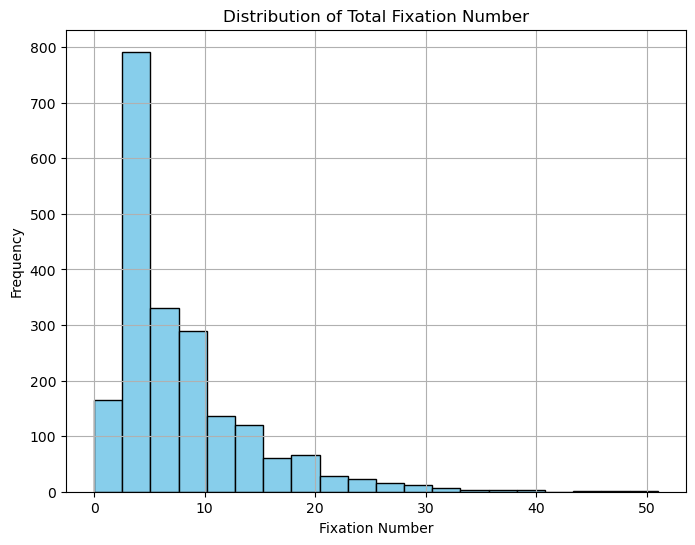

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:723: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: beta


In [103]:
# Distribution of Total Fixation Number

data_fixation = data['FixNb']

plt.figure(figsize=(8, 6))
plt.hist(data_fixation, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Total Fixation Number')
plt.xlabel('Fixation Number')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_fixation)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_fixation)
    kstest_stat, _ = stats.kstest(data_fixation, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Number of fixations for exploration and decision periods

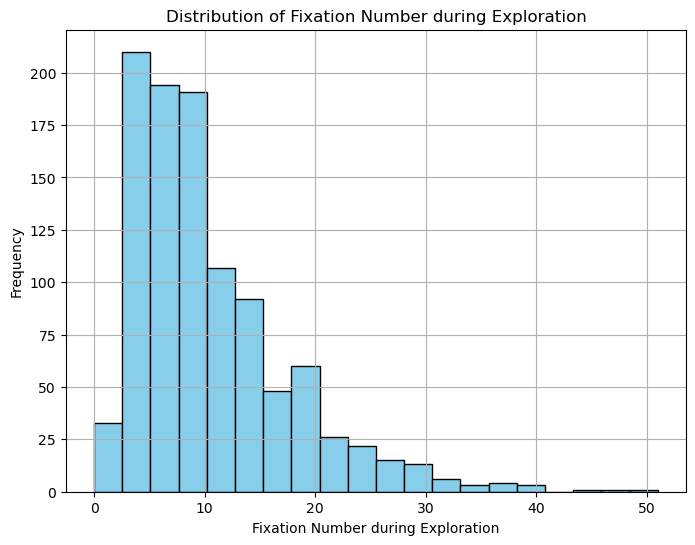

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:723: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: weibull_min


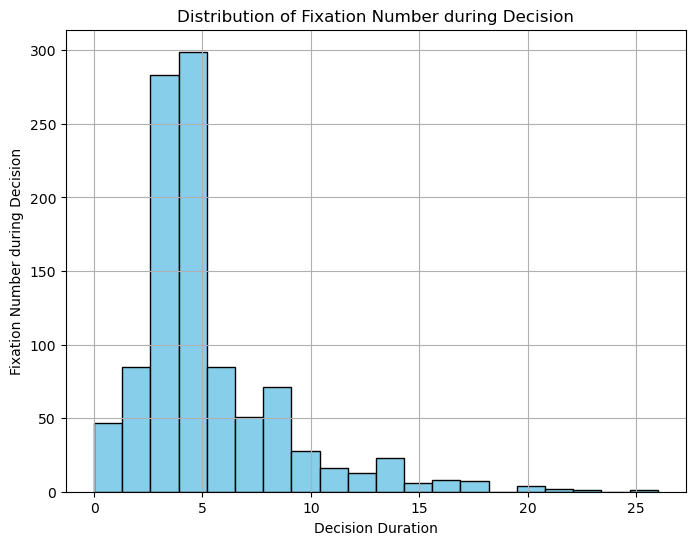

Data does not look normally distributed (reject H0)
Best fit distribution: gamma


In [104]:
# Distribution of Fixation Number for the exploration period

data_exploration = exploration_data['FixNb']

plt.figure(figsize=(8, 6))
plt.hist(data_exploration, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Fixation Number during Exploration')
plt.xlabel('Fixation Number during Exploration')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_exploration)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_exploration)
    kstest_stat, _ = stats.kstest(data_exploration, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

# Distribution of Fixation Number for the decision period

data_Decision = decision_data['FixNb']

plt.figure(figsize=(8, 6))
plt.hist(data_Decision, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Fixation Number during Decision')
plt.xlabel('Decision Duration')
plt.ylabel('Fixation Number during Decision')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_Decision)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_Decision)
    kstest_stat, _ = stats.kstest(data_Decision, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Number of fixations of bottom cards during exploration

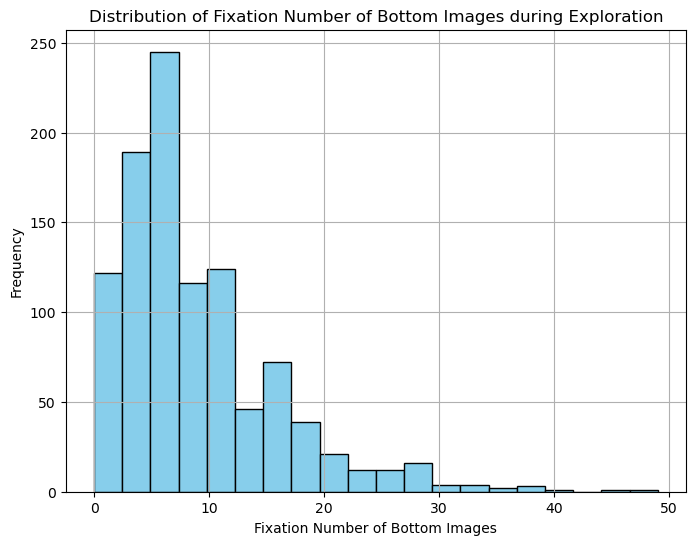

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:723: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: weibull_min


In [105]:
# Distribution of Fixation duration of bottom images during exploration period

data_fix_exploration = exploration_data['FixNbInBottom']

plt.figure(figsize=(8, 6))
plt.hist(data_fix_exploration, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Fixation Number of Bottom Images during Exploration')
plt.xlabel('Fixation Number of Bottom Images')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_fix_exploration)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_fix_exploration)
    kstest_stat, _ = stats.kstest(data_fix_exploration, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Number of fixations of top card during decision

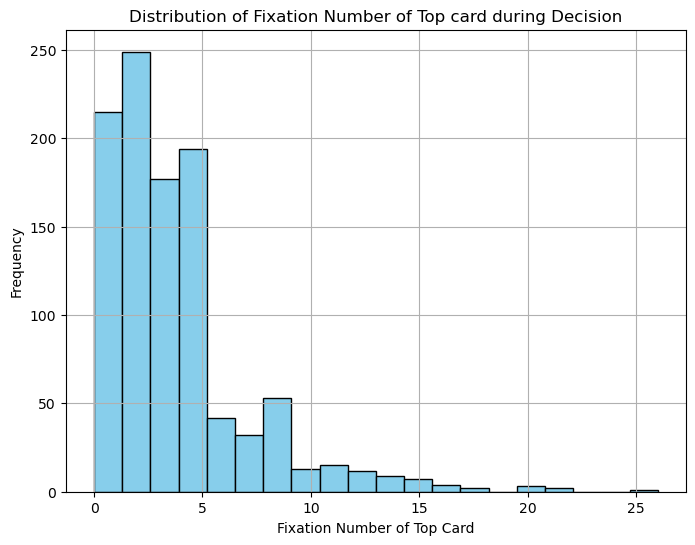

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:723: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: gamma


In [106]:
# Distribution of Fixation Number of top card during decision period

data_fix_decision = decision_data['FixNbInT']

plt.figure(figsize=(8, 6))
plt.hist(data_fix_decision, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Fixation Number of Top card during Decision')
plt.xlabel('Fixation Number of Top Card')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_fix_decision)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_fix_decision)
    kstest_stat, _ = stats.kstest(data_fix_decision, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Total Number of Switches

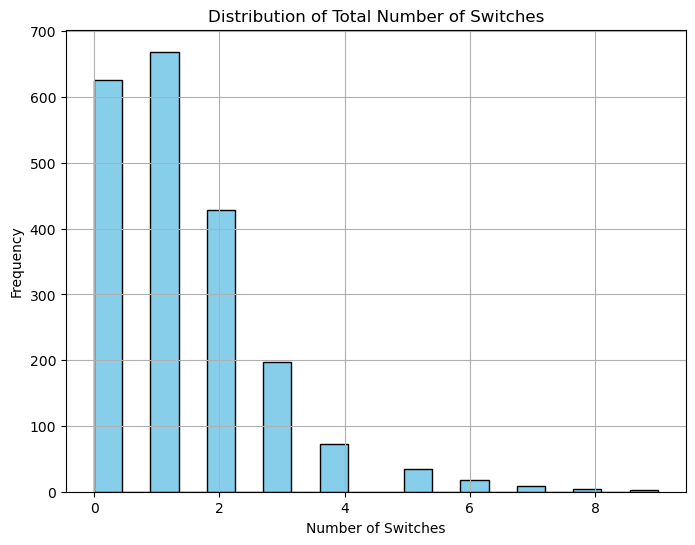

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: expon


In [107]:
# Distribution of Total Number of Switches

data_switches = data['NbSwitches']

plt.figure(figsize=(8, 6))
plt.hist(data_switches, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Total Number of Switches')
plt.xlabel('Number of Switches')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_switches)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_switches)
    kstest_stat, _ = stats.kstest(data_switches, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Number of Switches (Exploration period)

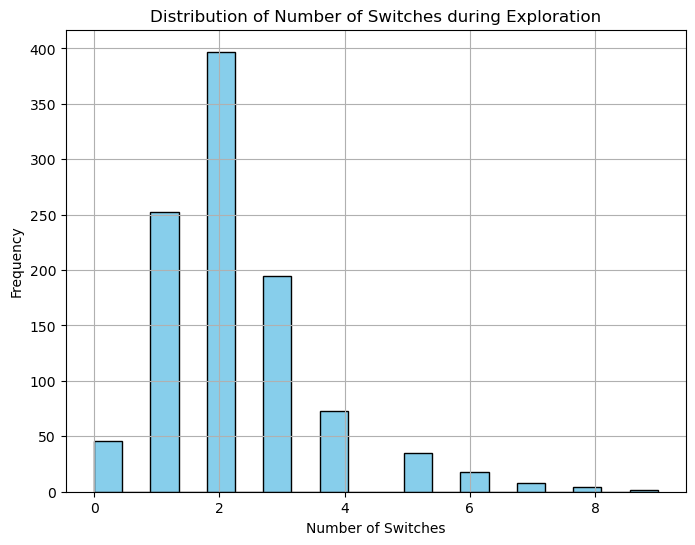

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:723: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: gamma


In [108]:
# Distribution of Fixation duration of bottom images during exploration period

data_switches_exploration = exploration_data['NbSwitches']

plt.figure(figsize=(8, 6))
plt.hist(data_switches_exploration, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Number of Switches during Exploration')
plt.xlabel('Number of Switches')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

#Check distribution
stat, p = shapiro(data_switches_exploration)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_switches_exploration)
    kstest_stat, _ = stats.kstest(data_switches_exploration, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

## Side Chosen

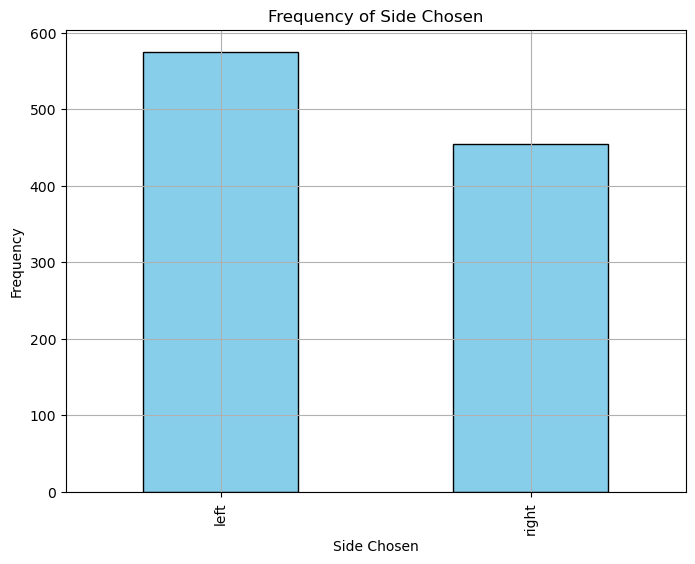

Data does not look normally distributed (reject H0)


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:718: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:723: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\scipy\stats\_continuous_distns.py:6480: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:88: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


Best fit distribution: lognorm


In [111]:
# Distribution of Side Chosen

data_side = decision_data['sideChosen']

plt.figure(figsize=(8, 6))
data_side.value_counts().plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Frequency of Side Chosen')
plt.xlabel('Side Chosen')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

data_side_numeric = data_side.map({'left': 0, 'right': 1})

#Check distribution
stat, p = shapiro(data_side_numeric)

alpha = 0.05
if p > alpha:
    print("Data looks normally distributed (fail to reject H0)")
else:
    print("Data does not look normally distributed (reject H0)")

distribution_names = ['gamma', 'beta', 'expon', 'lognorm', 'pareto', 'weibull_min', 'weibull_max']
best_fit_name = None
best_fit_params = {}
best_kstest_stat = np.inf

for distribution_name in distribution_names:
    distribution = getattr(stats, distribution_name)
    params = distribution.fit(data_side_numeric)
    kstest_stat, _ = stats.kstest(data_side_numeric, distribution_name, args=params)
    if kstest_stat < best_kstest_stat:
        best_fit_name = distribution_name
        best_fit_params = params
        best_kstest_stat = kstest_stat
print(f"Best fit distribution: {best_fit_name}")

# Modeling 

## Dataset per trial (not per period)

In [3]:
# DF DATA PER TRIAL

# Exploration period duration
exploration_df = data[data['period_in_trial'] == 'exploration']
durExplorationTotal_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['durPeriodTotal'].sum().reset_index()
durExplorationTotal_df.rename(columns={'durPeriodTotal': 'durExplorationPeriod'}, inplace=True)                                              

# Decision period duration
decision_df = data[data['period_in_trial'] == 'decision']
durDecisionTotal_df = decision_df.groupby(['session', 'trialno', 'difficulty']) ['durPeriodTotal'].sum().reset_index()
durDecisionTotal_df.rename(columns={'durPeriodTotal': 'durDecisionPeriod'}, inplace=True)

# Trial duration
trialduration_df = data.groupby(['session', 'trialno', 'difficulty'])['durPeriodTotal'].sum().reset_index()

# Accuracy
decision_df = data[data['period_in_trial'] == 'decision']
accuracy_df = decision_df.groupby(['session', 'trialno', 'difficulty']) ['accuracy'].sum().reset_index()

# Side Chosen
decision_df = data[data['period_in_trial'] == 'decision']
sideChosen_df = decision_df.groupby(['session', 'trialno', 'difficulty']) ['sideChosen'].sum().reset_index()

#Number of switches during exploration period
exploration_df = data[data['period_in_trial'] == 'exploration']
SwitchesExploration_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['NbSwitches'].sum().reset_index()
SwitchesExploration_df.rename(columns={'NbSwitches': 'SwitchesExplorationPeriod'}, inplace=True)   

#Number of switches during decision period
decision_df = data[data['period_in_trial'] == 'decision']
SwitchesDecision_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['NbSwitches'].sum().reset_index()
SwitchesDecision_df.rename(columns={'NbSwitches': 'SwitchesDecisionPeriod'}, inplace=True)   

#Number of switches in total
SwitchesTotal_df = data.groupby(['session', 'trialno', 'difficulty'])['NbSwitches'].sum().reset_index()

#Fixation number during exploration period
exploration_df = data[data['period_in_trial'] == 'exploration']
FixNbExploration_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['FixNb'].sum().reset_index()
FixNbExploration_df.rename(columns={'FixNb': 'FixNbExplorationPeriod'}, inplace=True)   

#Fixation number during decision period
decision_df = data[data['period_in_trial'] == 'decision']
FixNbDecision_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['FixNb'].sum().reset_index()
FixNbDecision_df.rename(columns={'FixNb': 'FixNbDecisionPeriod'}, inplace=True)   

#Fixation number in total
FixNbTotal_df = data.groupby(['session', 'trialno', 'difficulty'])['FixNb'].sum().reset_index()

#Fixation number in top card during decision period
decision_df = data[data['period_in_trial'] == 'decision']
FixNbTD_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['FixNbInT'].sum().reset_index()
FixNbTD_df.rename(columns={'FixNbInT': 'FixNbInTDecision'}, inplace=True)   

#Fixation number in top card during exploration period
exploration_df = data[data['period_in_trial'] == 'exploration']
FixNbTE_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['FixNbInT'].sum().reset_index()
FixNbTE_df.rename(columns={'FixNbInT': 'FixNbInTExploration'}, inplace=True) 

#Fixation number in Bottom cards during exploration period
exploration_df = data[data['period_in_trial'] == 'exploration']
FixNbBottom_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['FixNbInBottom'].sum().reset_index()
FixNbBottom_df.rename(columns={'FixNbInBottom': 'FixNbInBottomExploration'}, inplace=True)

#Fixation number in Bottom during both periods
FixNbBottomTotal_df = data.groupby(['session', 'trialno', 'difficulty'])['FixNbInBottom'].sum().reset_index()

#Fixation number in Top during both periods
FixNbInTTotal_df = data.groupby(['session', 'trialno', 'difficulty'])['FixNbInT'].sum().reset_index()

# Look total duration in top card during decision period
decision_df = data[data['period_in_trial'] == 'decision']
LookDurTDecision_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['LookTotDurInT'].sum().reset_index()
LookDurTDecision_df.rename(columns={'LookTotDurInT': 'LookDurInTDecision'}, inplace=True)   

# Look total duration in top card during exploration period
exploration_df = data[data['period_in_trial'] == 'decision']
LookDurTExploration_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['LookTotDurInT'].sum().reset_index()
LookDurTExploration_df.rename(columns={'LookTotDurInT': 'LookDurInTExploration'}, inplace=True)  

# Look total duration in bottom cards during exploration period
exploration_df = data[data['period_in_trial'] == 'exploration']
LookDurBE_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['durLookBottom'].sum().reset_index()
LookDurBE_df.rename(columns={'durLookBottom': 'durLookBottomExploration'}, inplace=True)

# Look total duration in bottom cards during decision period
decision_df = data[data['period_in_trial'] == 'decision']
LookDurBD_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['durLookBottom'].sum().reset_index()
LookDurBD_df.rename(columns={'durLookBottom': 'durLookBottomDecision'}, inplace=True)

# Look total duration in Bottom cards during both periods
LookDurBottomTotal_df = data.groupby(['session', 'trialno', 'difficulty'])['durLookBottom'].sum().reset_index()

# Look total duration in Top Card during both periods
LookDurTopTotal_df = data.groupby(['session', 'trialno', 'difficulty'])['LookTotDurInT'].sum().reset_index()

# Fixation duration of top card during decision period
decision_df = data[data['period_in_trial'] == 'decision']
FixDurTDecision_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['FixTotDurInT'].sum().reset_index()
FixDurTDecision_df.rename(columns={'FixTotDurInT': 'FixDurInTDecision'}, inplace=True)   

# Fixation duration of top card during exploration period
exploration_df = data[data['period_in_trial'] == 'decision']
FixDurTExploration_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['FixTotDurInT'].sum().reset_index()
FixDurTExploration_df.rename(columns={'FixTotDurInT': 'FixDurInTExploration'}, inplace=True)  

# Fixation duration of bottom cards during exploration period
exploration_df = data[data['period_in_trial'] == 'exploration']
FixDurBE_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['durfixBottom'].sum().reset_index()
FixDurBE_df.rename(columns={'durfixBottom': 'durfixBottomExploration'}, inplace=True)

# Fixation duration of bottom cards during decision period
decision_df = data[data['period_in_trial'] == 'decision']
FixDurBD_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['durfixBottom'].sum().reset_index()
FixDurBD_df.rename(columns={'durfixBottom': 'durfixBottomDecision'}, inplace=True)

# Fixation duration of Bottom cards during both periods
FixDurBottomTotal_df = data.groupby(['session', 'trialno', 'difficulty'])['durfixBottom'].sum().reset_index()

# Fixation duration of Top card during both periods
FixDurTopTotal_df = data.groupby(['session', 'trialno', 'difficulty'])['FixTotDurInT'].sum().reset_index()

merged_filtered_data = accuracy_df.merge(sideChosen_df, on=['session', 'trialno', 'difficulty'], how='outer')

merged_filtered_data = merged_filtered_data.merge(trialduration_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(durExplorationTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(durDecisionTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')

merged_filtered_data = merged_filtered_data.merge(SwitchesTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(SwitchesExploration_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(SwitchesDecision_df, on=['session', 'trialno', 'difficulty'], how='outer')

merged_filtered_data = merged_filtered_data.merge(FixNbExploration_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbDecision_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbTE_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbTD_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbBottom_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbBottomTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbInTTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')

merged_filtered_data = merged_filtered_data.merge(LookDurTDecision_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(LookDurTExploration_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(LookDurBE_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(LookDurBD_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(LookDurBottomTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(LookDurTopTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')


merged_filtered_data = merged_filtered_data.merge(FixDurTDecision_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixDurTExploration_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixDurBE_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixDurBD_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixDurBottomTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixDurTopTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')

merged_filtered_data

,session,trialno,difficulty,accuracy,sideChosen,durPeriodTotal,durExplorationPeriod,durDecisionPeriod,NbSwitches,SwitchesExplorationPeriod,...,durLookBottomExploration,durLookBottomDecision,durLookBottom,LookTotDurInT,FixDurInTDecision,FixDurInTExploration,durfixBottomExploration,durfixBottomDecision,durfixBottom,FixTotDurInT
0,curE002a,8,Easy,0.0,left,12194,11270,924,6,6,...,5480,536,6016,1208,298,298,4952,536,5488,1148
1,curE002a,9,Easy,1.0,left,4680,2498,2182,2,2,...,1670,530,2200,2176,1466,1466,1468,470,1938,1942
2,curE002a,10,Easy,1.0,right,12826,9912,2914,4,3,...,2658,106,2764,2020,798,798,2546,364,2910,1774
3,curE002a,11,Medium,1.0,right,3910,2328,1582,3,2,...,994,470,1464,1780,646,646,960,420,1380,1540
4,curE002a,12,Medium,0.0,left,15256,14272,984,6,5,...,7554,476,8030,1296,406,406,7048,476,7524,1210
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1025,curE122a,27,Medium,1.0,left,14690,13092,1598,2,2,...,9398,394,9792,1484,876,876,8682,308,8990,1244
1026,curE122a,28,Medium,1.0,right,14362,13796,566,4,3,...,6946,474,7420,288,0,0,6152,474,6626,212
1027,curE122a,35,Hard,1.0,left,18326,16894,1432,5,5,...,11690,0,11690,118,0,0,10078,0,10078,114
1028,curE122a,38,Hard,1.0,left,2996,2414,582,3,2,...,1586,488,2074,502,0,0,1510,488,1998,442


## Accuracy vs. Difficulty Level 
Check if the difficulty level predicts accuracy

In [55]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: accuracy
# Distribution: Log-normal

scaler = StandardScaler()
log_accuracy = np.log(merged_filtered_data['accuracy'] + 0.001)  #accuracy follows a log-normal distribution
log_accuracy_reshaped = scaler.fit_transform(log_accuracy.values.reshape(-1, 1))

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['log_accuracy'] = log_accuracy_reshaped

formula = 'log_accuracy ~ difficulty + np.power(difficulty, 2) + (difficulty | session)'  # Random intercept and random slope for difficulty within session #also accounting for non-linear trend

mixed_model = smf.mixedlm(formula, merged_filtered_data, groups=merged_filtered_data['session'])
result = mixed_model.fit()

print(result.summary())

# Leave-One-Out Cross-Validation (LOO-CV)

#actual_values = []
#predicted_values = []

#for idx, row in merged_filtered_data.iterrows():
#    leave_one_out_data = merged_filtered_data.drop(index=idx)
    
#    mixed_model = sm.MixedLM.from_formula(formula, data=leave_one_out_data, groups=leave_one_out_data['session'])
#    result = mixed_model.fit()
    

#    prediction_data = pd.DataFrame([row], columns=merged_filtered_data.columns)
    
#    predicted_value = result.predict(prediction_data)

#    actual_values.append(row['log_accuracy'])
#    predicted_values.append(predicted_value)

# Mean Absolute Error (MAE)
#mae = mean_absolute_error(actual_values, predicted_values)
#print("\nMean Absolute Error:", mae)

# Mean Squared Error (MSE)
#mse = mean_squared_error(actual_values, predicted_values)
#print("Mean Squared Error:", mse)

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


              Mixed Linear Model Regression Results
Model:                MixedLM   Dependent Variable:   log_accuracy
No. Observations:     1030      Method:               REML        
No. Groups:           53        Scale:                0.9986      
Min. group size:      11        Log-Likelihood:       -1473.4251  
Max. group size:      40        Converged:            Yes         
Mean group size:      19.4                                        
------------------------------------------------------------------
                        Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------------
Intercept                0.068    0.074  0.924 0.355 -0.076  0.213
difficulty              -0.038    0.098 -0.391 0.696 -0.231  0.154
np.power(difficulty, 2) -0.002    0.038 -0.042 0.967 -0.076  0.072
difficulty | session    -0.001    0.002 -0.420 0.674 -0.005  0.003
Group Var                0.004    0.012                           



## Total Trial Duration vs. Difficulty Level
Check if the difficulty level predicts total trial duration

In [56]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durPeriodTotal
# Distribution: Weibull 

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['transformed_durPeriodTotal'] = np.log(merged_filtered_data['durPeriodTotal'] + 0.001) # Transform trial duration to fit a Weibull distribution

formula = 'transformed_durPeriodTotal ~ difficulty + np.power(difficulty, 2) + (difficulty | session)' # Quadratic term for difficulty (non-linearity) #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

print(result.summary())

# Leave-One-Out Cross-Validation (LOO-CV)

actual_values = []
predicted_values = []

for idx, row in merged_filtered_data.iterrows():
    leave_one_out_data = merged_filtered_data.drop(index=idx)

    mixed_model = sm.MixedLM.from_formula(formula, data=leave_one_out_data, groups=leave_one_out_data['session'])
    result = mixed_model.fit()

    prediction_data = pd.DataFrame([row], columns=merged_filtered_data.columns)

    predicted_value = result.predict(prediction_data)

    actual_values.append(row['transformed_durPeriodTotal'])
    predicted_values.append(predicted_value)

# Mean Absolute Error (MAE)
mae = mean_absolute_error(actual_values, predicted_values)
print("\nMean Absolute Error:", mae)

# Mean Squared Error (MSE)
mse = mean_squared_error(actual_values, predicted_values)
print("Mean Squared Error:", mse)

                 Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: transformed_durPeriodTotal
No. Observations: 1030    Method:             REML                      
No. Groups:       53      Scale:              0.2413                    
Min. group size:  11      Log-Likelihood:     -786.3270                 
Max. group size:  40      Converged:          Yes                       
Mean group size:  19.4                                                  
-------------------------------------------------------------------------
                         Coef.   Std.Err.     z     P>|z|  [0.025  0.975]
-------------------------------------------------------------------------
Intercept                 8.991     0.075  119.801  0.000   8.844   9.138
difficulty                0.098     0.050    1.938  0.053  -0.001   0.197
np.power(difficulty, 2)  -0.033     0.019   -1.691  0.091  -0.071   0.005
difficulty | session     -0.003     0.002   -1.052  0.293  -0.0

KeyboardInterrupt: 

## Exploration Period Duration vs. Difficulty Level

In [57]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durExplorationPeriod
# Distribution: beta

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

scaler = MinMaxScaler(feature_range=(0, 1))
merged_filtered_data['scaled_durExplorationPeriod'] = scaler.fit_transform(merged_filtered_data[['durExplorationPeriod']]) #transforming durExplorationPeriod to fit into (0, 1) range (gamma distribution is followed-

formula = 'scaled_durExplorationPeriod ~ difficulty + np.power(difficulty, 2)' #accounting for non-linear trend here

mixed_model = sm.MixedLM.from_formula(
    formula, 
    data=merged_filtered_data, 
    groups=merged_filtered_data['session'], 
    re_formula='1 + difficulty',  # random intercept and slope 
)
result = mixed_model.fit()

print(result.summary())

# Leave-One-Out Cross-Validation (LOO-CV)

actual_values = []
predicted_values = []

for idx, row in merged_filtered_data.iterrows():
    leave_one_out_data = merged_filtered_data.drop(index=idx)

    mixed_model = sm.MixedLM.from_formula(formula, data=leave_one_out_data, groups=leave_one_out_data['session'])
    result = mixed_model.fit()

    prediction_data = pd.DataFrame([row], columns=merged_filtered_data.columns)

    predicted_value = result.predict(prediction_data)

    actual_values.append(row['scaled_durExplorationPeriod'])
    predicted_values.append(predicted_value)

# Mean Absolute Error (MAE)
mae = mean_absolute_error(actual_values, predicted_values)
print("\nMean Absolute Error:", mae)

# Mean Squared Error (MSE)
mse = mean_squared_error(actual_values, predicted_values)
print("Mean Squared Error:", mse)

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


                  Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_durExplorationPeriod
No. Observations: 1030    Method:             REML                       
No. Groups:       53      Scale:              0.0462                     
Min. group size:  11      Log-Likelihood:     67.9610                    
Max. group size:  40      Converged:          Yes                        
Mean group size:  19.4                                                   
--------------------------------------------------------------------------
                           Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
--------------------------------------------------------------------------
Intercept                   0.197     0.017  11.860  0.000   0.165   0.230
difficulty                  0.048     0.024   1.954  0.051  -0.000   0.095
np.power(difficulty, 2)    -0.019     0.010  -1.989  0.047  -0.038  -0.000
Group Var                   0.008     0.013       

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_m


Mean Absolute Error: 0.18491109703975592
Mean Squared Error: 0.054225530389425944


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


## Decision Period Duration vs. Difficulty Level BAD RESULTS

In [59]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durDecisionPeriod
# Distribution: Log-normal

merged_filtered_data['log_durDecisionPeriod'] = np.log(merged_filtered_data['durDecisionPeriod'])
merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

scaler = StandardScaler() 
merged_filtered_data[['log_durDecisionPeriod']] = scaler.fit_transform(merged_filtered_data[['log_durDecisionPeriod']]) # Decision period duration follows a log-normal distribution

formula = 'log_durDecisionPeriod ~ difficulty + np.power(difficulty, 2) + (difficulty | session)' #Random intercept and random slope #Also accounting for non-linear trend

mixed_model = smf.mixedlm(formula, merged_filtered_data, groups=merged_filtered_data['session'])
result = mixed_model.fit()

print(result.summary())

# Leave-One-Out Cross-Validation (LOO-CV)

#actual_values = []
#predicted_values = []

#for idx, row in merged_filtered_data.iterrows():
#    leave_one_out_data = merged_filtered_data.drop(index=idx)
    
#    mixed_model = sm.MixedLM.from_formula(formula, data=leave_one_out_data, groups=leave_one_out_data['session'])
#    result = mixed_model.fit()
    

#    prediction_data = pd.DataFrame([row], columns=merged_filtered_data.columns)
    
#    predicted_value = result.predict(prediction_data)

#    actual_values.append(row['log_durDecisionPeriod'])
#    predicted_values.append(predicted_value)

# Mean Absolute Error (MAE)
#mae = mean_absolute_error(actual_values, predicted_values)
#print("\nMean Absolute Error:", mae)

# Mean Squared Error (MSE)
#mse = mean_squared_error(actual_values, predicted_values)
#print("Mean Squared Error:", mse)

               Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: log_durDecisionPeriod
No. Observations: 1030    Method:             REML                 
No. Groups:       53      Scale:              0.8288               
Min. group size:  11      Log-Likelihood:     -1417.0298           
Max. group size:  40      Converged:          Yes                  
Mean group size:  19.4                                             
-------------------------------------------------------------------
                         Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------------
Intercept                 0.130    0.134  0.971 0.331 -0.132  0.391
difficulty                0.052    0.093  0.555 0.579 -0.131  0.235
np.power(difficulty, 2)  -0.016    0.036 -0.457 0.648 -0.087  0.054
difficulty | session     -0.004    0.004 -0.958 0.338 -0.013  0.004
Group Var                 0.181    0.051                       

## Look duration of bottom images (exploration period) vs. Difficulty Level BAD RESULTS

In [31]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durLookBottomExploration
# Distribution: gamma

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['transformed_durLookBottomExploration'] = np.log(merged_filtered_data['durLookBottomExploration'] + 0.001) # Transform durLookBottomExploration to fit a Gamma distribution

formula = 'transformed_durLookBottomExploration ~ difficulty + np.power(difficulty, 2) + (difficulty | session)' # Quadratic term for difficulty (non-linearity) #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

print(result.summary())

# Leave-One-Out Cross-Validation (LOO-CV)

#actual_values = []
#predicted_values = []

#for idx, row in merged_filtered_data.iterrows():
#    leave_one_out_data = merged_filtered_data.drop(index=idx)

#    mixed_model = sm.MixedLM.from_formula(formula, data=leave_one_out_data, groups=leave_one_out_data['session'])
#    result = mixed_model.fit()

#    prediction_data = pd.DataFrame([row], columns=merged_filtered_data.columns)

#    predicted_value = result.predict(prediction_data)

#    actual_values.append(row['transformed_durLookBottomExploration'])
#    predicted_values.append(predicted_value)

# Mean Absolute Error (MAE)
#mae = mean_absolute_error(actual_values, predicted_values)
#print("\nMean Absolute Error:", mae)

# Mean Squared Error (MSE)
#mse = mean_squared_error(actual_values, predicted_values)
#print("Mean Squared Error:", mse)

                      Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: transformed_durLookBottomExploration
No. Observations: 1030    Method:             REML                                
No. Groups:       53      Scale:              6.2993                              
Min. group size:  11      Log-Likelihood:     -2472.9518                          
Max. group size:  40      Converged:          Yes                                 
Mean group size:  19.4                                                            
-------------------------------------------------------------------------------------
                            Coef.     Std.Err.      z       P>|z|    [0.025    0.975]
-------------------------------------------------------------------------------------
Intercept                    7.338       0.491    14.959    0.000     6.376     8.299
difficulty                  -0.108       0.259    -0.418    0.676    -0.617     0.400
np.power(dif

## Look Duration of Top card (decision period) BAD RESULTS

In [32]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: LookDurInTDecision
# Distribution: Weibull 

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['transformed_LookDurInTDecision'] = np.log(merged_filtered_data['LookDurInTDecision'] + 0.001) # Transform LookDurInTDecision to fit a Weibull distribution

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

formula = 'transformed_LookDurInTDecision ~ difficulty + np.power(difficulty, 2) + (difficulty | session)' # Quadratic term for difficulty (non-linearity) #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

print(result.summary())

# Leave-One-Out Cross-Validation (LOO-CV)

#actual_values = []
#predicted_values = []

#for idx, row in merged_filtered_data.iterrows():
#    leave_one_out_data = merged_filtered_data.drop(index=idx)

#    mixed_model = sm.MixedLM.from_formula(formula, data=leave_one_out_data, groups=leave_one_out_data['session'])
#    result = mixed_model.fit()

#    prediction_data = pd.DataFrame([row], columns=merged_filtered_data.columns)

#    predicted_value = result.predict(prediction_data)

#    actual_values.append(row['transformed_LookDurInTDecision'])
#    predicted_values.append(predicted_value)

# Mean Absolute Error (MAE)
#mae = mean_absolute_error(actual_values, predicted_values)
#print("\nMean Absolute Error:", mae)

# Mean Squared Error (MSE)
#mse = mean_squared_error(actual_values, predicted_values)
#print("Mean Squared Error:", mse)

                   Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: transformed_LookDurInTDecision
No. Observations: 1030    Method:             REML                          
No. Groups:       53      Scale:              12.1306                       
Min. group size:  11      Log-Likelihood:     -2767.4555                    
Max. group size:  40      Converged:          Yes                           
Mean group size:  19.4                                                      
------------------------------------------------------------------------------
                          Coef.    Std.Err.     z      P>|z|   [0.025   0.975]
------------------------------------------------------------------------------
Intercept                  6.827      0.319   21.389   0.000    6.201    7.452
difficulty                 0.042      0.350    0.119   0.905   -0.644    0.728
np.power(difficulty, 2)   -0.048      0.135   -0.354   0.723   -0.312    0.217
difficu

## Fixation Duration of bottom cards (exploration period) vs. Difficulty Level BAD RESULTS

In [33]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durLookBottomExploration
# Distribution: gamma

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['transformed_durfixBottomExploration'] = np.log(merged_filtered_data['durfixBottomExploration'] + 0.001) # Transform durfixBottomExploration to fit a Gamma distribution

formula = 'transformed_durfixBottomExploration ~ difficulty + np.power(difficulty, 2) + (difficulty | session)' # Quadratic term for difficulty (non-linearity) #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

print(result.summary())

# Leave-One-Out Cross-Validation (LOO-CV)

#actual_values = []
#predicted_values = []

#for idx, row in merged_filtered_data.iterrows():
#    leave_one_out_data = merged_filtered_data.drop(index=idx)

#    mixed_model = sm.MixedLM.from_formula(formula, data=leave_one_out_data, groups=leave_one_out_data['session'])
#    result = mixed_model.fit()

#    prediction_data = pd.DataFrame([row], columns=merged_filtered_data.columns)

#    predicted_value = result.predict(prediction_data)

#    actual_values.append(row['transformed_durfixBottomExploration'])
#    predicted_values.append(predicted_value)

# Mean Absolute Error (MAE)
#mae = mean_absolute_error(actual_values, predicted_values)
#print("\nMean Absolute Error:", mae)

# Mean Squared Error (MSE)
#mse = mean_squared_error(actual_values, predicted_values)
#print("Mean Squared Error:", mse)

                      Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: transformed_durfixBottomExploration
No. Observations: 1030    Method:             REML                               
No. Groups:       53      Scale:              6.1520                             
Min. group size:  11      Log-Likelihood:     -2461.5082                         
Max. group size:  40      Converged:          Yes                                
Mean group size:  19.4                                                           
------------------------------------------------------------------------------------
                           Coef.     Std.Err.      z       P>|z|    [0.025    0.975]
------------------------------------------------------------------------------------
Intercept                   7.250       0.491    14.761    0.000     6.288     8.213
difficulty                 -0.024       0.256    -0.093    0.926    -0.526     0.478
np.power(difficulty, 2)

## Fixation duration of Top Card (Decision Period) vs. Difficulty Level BAD RESULTS

In [34]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: FixDurInTDecision
# Distribution: Weibull 

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['transformed_FixDurInTDecision'] = np.log(merged_filtered_data['FixDurInTDecision'] + 0.001) # Transform FixDurInTDecision to fit a Weibull distribution

formula = 'transformed_FixDurInTDecision ~ difficulty + np.power(difficulty, 2) + (difficulty | session)' # Quadratic term for difficulty (non-linearity) #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

print(result.summary())

# Leave-One-Out Cross-Validation (LOO-CV)

#actual_values = []
#predicted_values = []

#for idx, row in merged_filtered_data.iterrows():
#    leave_one_out_data = merged_filtered_data.drop(index=idx)

#    mixed_model = sm.MixedLM.from_formula(formula, data=leave_one_out_data, groups=leave_one_out_data['session'])
#    result = mixed_model.fit()

#    prediction_data = pd.DataFrame([row], columns=merged_filtered_data.columns)

#    predicted_value = result.predict(prediction_data)

#    actual_values.append(row['transformed_FixDurInTDecision'])
#    predicted_values.append(predicted_value)

# Mean Absolute Error (MAE)
#mae = mean_absolute_error(actual_values, predicted_values)
#print("\nMean Absolute Error:", mae)

# Mean Squared Error (MSE)
#mse = mean_squared_error(actual_values, predicted_values)
#print("Mean Squared Error:", mse)

                   Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: transformed_FixDurInTDecision
No. Observations: 1030    Method:             REML                         
No. Groups:       53      Scale:              12.0536                      
Min. group size:  11      Log-Likelihood:     -2764.8432                   
Max. group size:  40      Converged:          Yes                          
Mean group size:  19.4                                                     
----------------------------------------------------------------------------
                             Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
----------------------------------------------------------------------------
Intercept                     6.731     0.322  20.921  0.000   6.101   7.362
difficulty                   -0.000     0.349  -0.001  0.999  -0.685   0.684
np.power(difficulty, 2)      -0.029     0.135  -0.218  0.828  -0.293   0.235
difficulty | session     

## Total Number of Fixations vs. Difficulty Level

In [7]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durExplorationPeriod
# Distribution: beta

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

scaler = MinMaxScaler(feature_range=(0, 1))
merged_filtered_data['scaled_FixNb'] = scaler.fit_transform(merged_filtered_data[['FixNb']]) #transforming FixNb to fit into (0, 1) range (gamma distribution is followed)

formula = 'scaled_FixNb ~ difficulty + np.power(difficulty, 2)' #accounting for non-linear trend here

mixed_model = sm.MixedLM.from_formula(
    formula, 
    data=merged_filtered_data, 
    groups=merged_filtered_data['session'], 
    re_formula='1 + difficulty',  # random intercept and slope 
)
result = mixed_model.fit()

print(result.summary())

# Leave-One-Out Cross-Validation (LOO-CV)

actual_values = []
predicted_values = []

for idx, row in merged_filtered_data.iterrows():
    leave_one_out_data = merged_filtered_data.drop(index=idx)

    mixed_model = sm.MixedLM.from_formula(formula, data=leave_one_out_data, groups=leave_one_out_data['session'])
    result = mixed_model.fit()

    prediction_data = pd.DataFrame([row], columns=merged_filtered_data.columns)

    predicted_value = result.predict(prediction_data)

    actual_values.append(row['scaled_FixNb'])
    predicted_values.append(predicted_value)

# Mean Absolute Error (MAE)
mae = mean_absolute_error(actual_values, predicted_values)
print("\nMean Absolute Error:", mae)

# Mean Squared Error (MSE)
mse = mean_squared_error(actual_values, predicted_values)
print("Mean Squared Error:", mse)

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


              Mixed Linear Model Regression Results
Model:                MixedLM   Dependent Variable:   scaled_FixNb
No. Observations:     1030      Method:               REML        
No. Groups:           53        Scale:                0.0184      
Min. group size:      11        Log-Likelihood:       541.2207    
Max. group size:      40        Converged:            Yes         
Mean group size:      19.4                                        
------------------------------------------------------------------
                        Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------------
Intercept                0.271    0.011 24.345 0.000  0.249  0.293
difficulty               0.020    0.015  1.377 0.168 -0.008  0.048
np.power(difficulty, 2) -0.009    0.006 -1.642 0.101 -0.020  0.002
Group Var                0.004    0.009                           
Group x difficulty Cov  -0.000    0.003                           
difficulty

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_m


Mean Absolute Error: 0.1151661343903696
Mean Squared Error: 0.02247377642176808


C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


##  Number of fixations of bottom cards during exploration vs. BAD RESULTS

In [35]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: FixNbInBottomExploration
# Distribution: Weibull 

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['transformed_FixNbInBottomExploration'] = np.log(merged_filtered_data['FixNbInBottomExploration'] + 0.001) # Transform FixNbInBottomExploration to fit a Weibull distribution

formula = 'transformed_FixNbInBottomExploration ~ difficulty + np.power(difficulty, 2) + (difficulty | session)' # Quadratic term for difficulty (non-linearity) #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

print(result.summary())

# Leave-One-Out Cross-Validation (LOO-CV)

#actual_values = []
#predicted_values = []

#for idx, row in merged_filtered_data.iterrows():
#    leave_one_out_data = merged_filtered_data.drop(index=idx)

#    mixed_model = sm.MixedLM.from_formula(formula, data=leave_one_out_data, groups=leave_one_out_data['session'])
#    result = mixed_model.fit()

#    prediction_data = pd.DataFrame([row], columns=merged_filtered_data.columns)

#    predicted_value = result.predict(prediction_data)

#    actual_values.append(row['transformed_FixNbInBottomExplorationl'])
#    predicted_values.append(predicted_value)

# Mean Absolute Error (MAE)
#mae = mean_absolute_error(actual_values, predicted_values)
#print("\nMean Absolute Error:", mae)

# Mean Squared Error (MSE)
#mse = mean_squared_error(actual_values, predicted_values)
#print("Mean Squared Error:", mse)

                      Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: transformed_FixNbInBottomExploration
No. Observations: 1030    Method:             REML                                
No. Groups:       53      Scale:              2.4813                              
Min. group size:  11      Log-Likelihood:     -1996.3433                          
Max. group size:  40      Converged:          Yes                                 
Mean group size:  19.4                                                            
-------------------------------------------------------------------------------------
                            Coef.     Std.Err.      z       P>|z|    [0.025    0.975]
-------------------------------------------------------------------------------------
Intercept                    1.725       0.316     5.466    0.000     1.107     2.344
difficulty                   0.023       0.163     0.139    0.889    -0.296     0.342
np.power(dif

## Number of fixations of top card during decision vs. Difficulty Level BAD RESULTS

In [36]:
# Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: FixNbTD
# Distribution: gamma

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['transformed_FixNbTD'] = np.log(merged_filtered_data['FixNbInTDecision'] + 0.001) # Transform FixNbTD to fit a Gamma distribution

formula = 'transformed_FixNbTD ~ difficulty + np.power(difficulty, 2) + (difficulty | session)' # Quadratic term for difficulty (non-linearity) #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

print(result.summary())

# Leave-One-Out Cross-Validation (LOO-CV)

#actual_values = []
#predicted_values = []

#for idx, row in merged_filtered_data.iterrows():
#    leave_one_out_data = merged_filtered_data.drop(index=idx)

#    mixed_model = sm.MixedLM.from_formula(formula, data=leave_one_out_data, groups=leave_one_out_data['session'])
#    result = mixed_model.fit()

#    prediction_data = pd.DataFrame([row], columns=merged_filtered_data.columns)

#    predicted_value = result.predict(prediction_data)

#    actual_values.append(row['transformed_FixNbTD'])
#    predicted_values.append(predicted_value)

# Mean Absolute Error (MAE)
#mae = mean_absolute_error(actual_values, predicted_values)
#print("\nMean Absolute Error:", mae)

# Mean Squared Error (MSE)
#mse = mean_squared_error(actual_values, predicted_values)
#print("Mean Squared Error:", mse)

              Mixed Linear Model Regression Results
Model:             MixedLM Dependent Variable: transformed_FixNbTD
No. Observations:  1030    Method:             REML               
No. Groups:        53      Scale:              4.3598             
Min. group size:   11      Log-Likelihood:     -2241.8953         
Max. group size:   40      Converged:          Yes                
Mean group size:   19.4                                           
------------------------------------------------------------------
                        Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------------
Intercept                1.025    0.189  5.415 0.000  0.654  1.396
difficulty              -0.004    0.210 -0.021 0.983 -0.415  0.406
np.power(difficulty, 2) -0.017    0.081 -0.214 0.831 -0.176  0.141
difficulty | session    -0.016    0.006 -2.717 0.007 -0.027 -0.004
Group Var                0.175    0.040                           



## Number of Switches during Exploration Period vs. Difficulty Level BAD RESULTS

In [37]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: SwitchesExplorationPeriod
# Distribution: gamma

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['transformed_SwitchesExplorationPeriod'] = np.log(merged_filtered_data['SwitchesExplorationPeriod'] + 0.001) # Transform SwitchesExplorationPeriod to fit a Gamma distribution

formula = 'transformed_SwitchesExplorationPeriod ~ difficulty + np.power(difficulty, 2) + (difficulty | session)' # Quadratic term for difficulty (non-linearity) #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=merged_filtered_data, groups=merged_filtered_data['session'])

result = mixed_model.fit()

print(result.summary())

# Leave-One-Out Cross-Validation (LOO-CV)

#actual_values = []
#predicted_values = []

#for idx, row in merged_filtered_data.iterrows():
#    leave_one_out_data = merged_filtered_data.drop(index=idx)

#    mixed_model = sm.MixedLM.from_formula(formula, data=leave_one_out_data, groups=leave_one_out_data['session'])
#    result = mixed_model.fit()

#    prediction_data = pd.DataFrame([row], columns=merged_filtered_data.columns)

#    predicted_value = result.predict(prediction_data)

#    actual_values.append(row['transformed_durLookBottomExploration'])
#    predicted_values.append(predicted_value)

# Mean Absolute Error (MAE)
#mae = mean_absolute_error(actual_values, predicted_values)
#print("\nMean Absolute Error:", mae)

# Mean Squared Error (MSE)
#mse = mean_squared_error(actual_values, predicted_values)
#print("Mean Squared Error:", mse)

                       Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: transformed_SwitchesExplorationPeriod
No. Observations: 1030    Method:             REML                                 
No. Groups:       53      Scale:              1.8191                               
Min. group size:  11      Log-Likelihood:     -1841.9180                           
Max. group size:  40      Converged:          Yes                                  
Mean group size:  19.4                                                             
--------------------------------------------------------------------------------------
                             Coef.     Std.Err.      z       P>|z|    [0.025    0.975]
--------------------------------------------------------------------------------------
Intercept                     0.374       0.296     1.264    0.206    -0.206     0.954
difficulty                   -0.076       0.140    -0.545    0.586    -0.350     0.197


## Side Chosen vs. Difficulty Level

In [53]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: sideChosen
# Distribution: Log-normal

merged_filtered_data['sideChosen'] = merged_filtered_data['sideChosen'].astype('category')

sideChosen_numeric = merged_filtered_data['sideChosen'].cat.codes

scaler = StandardScaler()
log_sideChosen = np.log(sideChosen_numeric + 0.001)  #sideChosen follows a log-normal distribution
log_sideChosen_reshaped = scaler.fit_transform(log_sideChosen.values.reshape(-1, 1))

merged_filtered_data['difficulty'] = merged_filtered_data['difficulty'].astype('category').cat.codes
merged_filtered_data['session'] = merged_filtered_data['session'].astype('category').cat.codes

merged_filtered_data['log_sideChosen'] = log_sideChosen_reshaped

formula = 'log_sideChosen ~ difficulty + np.power(difficulty, 2) + (1 | session)'  # Random intercept for session #accounting for non-linear trend

mixed_model = smf.mixedlm(formula, merged_filtered_data, groups=merged_filtered_data['session'])
result = mixed_model.fit()

print(result.summary())

# Leave-One-Out Cross-Validation (LOO-CV)

#actual_values = []
#predicted_values = []

#for idx, row in merged_filtered_data.iterrows():
#    leave_one_out_data = merged_filtered_data.drop(index=idx)
    
#    mixed_model = sm.MixedLM.from_formula(formula, data=leave_one_out_data, groups=leave_one_out_data['session'])
#    result = mixed_model.fit()
    

#    prediction_data = pd.DataFrame([row], columns=merged_filtered_data.columns)
    
#    predicted_value = result.predict(prediction_data)

#    actual_values.append(row['log_sideChosen'])
#    predicted_values.append(predicted_value)

# Mean Absolute Error (MAE)
#mae = mean_absolute_error(actual_values, predicted_values)
#print("\nMean Absolute Error:", mae)

# Mean Squared Error (MSE)
#mse = mean_squared_error(actual_values, predicted_values)
#print("Mean Squared Error:", mse)

              Mixed Linear Model Regression Results
Model:              MixedLM   Dependent Variable:   log_sideChosen
No. Observations:   1030      Method:               REML          
No. Groups:         53        Scale:                0.8496        
Min. group size:    11        Log-Likelihood:       -1428.0585    
Max. group size:    40        Converged:            Yes           
Mean group size:    19.4                                          
------------------------------------------------------------------
                        Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------------
Intercept                0.083    0.133  0.622 0.534 -0.178  0.343
difficulty              -0.025    0.094 -0.265 0.791 -0.210  0.160
np.power(difficulty, 2) -0.002    0.036 -0.050 0.960 -0.073  0.070
1 | session             -0.002    0.004 -0.385 0.700 -0.010  0.007
Group Var                0.171    0.049                           

